<a href="https://colab.research.google.com/github/marianopoisson/plot-tilt-stats/blob/colab/test2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preamble

In [19]:
!git clone https://github.com/marianopoisson/plot-tilt-stats.git /content/plot-tilt-stats
%cd /content/plot-tilt-stats
!pip install -e .

fatal: destination path '/content/plot-tilt-stats' already exists and is not an empty directory.
/content/plot-tilt-stats
Obtaining file:///content/plot-tilt-stats
ERROR: file:///content/plot-tilt-stats does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [20]:
#from google.colab import drive
#drive.mount('/content/drive')

In [21]:
!pip install diptest

In [22]:
import sys, os
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from src import main, plotting, analysis, io_utils
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.transforms as mtransforms
from scipy import stats

In [23]:
%cd /content/plot-tilt-stats/notebooks/
df = main.main()

/content/plot-tilt-stats/notebooks


/usr/local/lib/python3.12/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in arccos
  result = getattr(ufunc, method)(*inputs, **kwargs)
/content/plot-tilt-stats/src/io_utils.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 9.92915533 15.04399737 18.9722507  ... 34.334142   34.95878496
 35.07788068]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df['da']>= df['cond1'], 'gamma'] = 180*np.arccos((df.R+df.a)*(1-df.da)/df.R)/np.pi


7982
8040
8052
8056
8088
8122
8130
8171
8226
8404
8552
8589
8628
8649
8699
8851
8968
9063
9139
9308
9368
9396
9417
9574
9660
9678
9710
9884
10130
10137
10311
10391
10971
10987
11007
total ARs = 108


In [24]:
DFx2=df.assign(frac=lambda x: x.alpha-x.alphab)
DFx2=DFx2.assign(t_mean=lambda x: round(10*x.t_norm)/10)

In [25]:
DFx2.keys()

Index(['mag', 'da', 'alpha', 'a', 'R', 'N0', 'axf', 'xc', 'yc', 'alphab',
       'sar', 'lead', 'flux', 'fluxp', 'fluxn', 'fint', 'lat', 'AR', 'spt',
       'rot', 'rotb', 'cond1', 'gamma', 'sepax', 'stp', 'rot_cum', 'rotb_cum',
       't_norm', 'frac', 't_mean'],
      dtype='object')

# Functions

In [26]:
def estimate_intercept_uncertainty(fint, mag, magmax,
                                    flim_range=(0.1,0.35), Nsamp=200):
    """
    Estimate uncertainty in intercept due to extrapolation range selection.
    """

    b_samples = []

    for _ in range(Nsamp):
        flim = np.random.uniform(*flim_range)
        mask = fint < flim

        if mask.sum() < 4:
            continue

        x = mag[mask] / magmax
        y = fint[mask]

        slope, intercept, _, _, _ = stats.linregress(y, x)
        b_samples.append(intercept)

    return np.mean(b_samples), np.std(b_samples), np.array(b_samples)



import numpy as np
from scipy import stats

def compute_tnorm_with_error(mag, fint, time=None, cadence_hours=3,sigma_magmax=None,
                             frac_fit=0.2, Nmc=5000):
    """
    Compute normalized time t_norm and its uncertainty using Monte Carlo propagation.

    Parameters
    ----------
    mag : array
        Magnetic signal (or flux proxy).
    fint : array
        Normalized flux evolution (0–1).
    time : array, optional
        Time array (in days). If None, cadence error is ignored.
    cadence_hours : float
        Observational cadence in hours.
    frac_fit : float
        Fraction of early data used to perform linear extrapolation.
    Nmc : int
        Number of Monte Carlo realizations.

    Returns
    -------
    t_norm_mean : array
        Mean normalized time.
    t_norm_std : array
        Standard deviation of normalized time.
    """

    mag = np.asarray(mag)
    fint = np.asarray(fint)

    # --- Step 1: find maximum
    idx_max = np.argmax(fint)
    magmax = mag[idx_max]

    # --- Step 2: linear extrapolation of early phase
    mask = fint <= fint.min() + frac_fit
    x_pre = mag[mask] / magmax
    y_pre = fint[mask]

    slope, intercept, r, p, stderr = stats.linregress(y_pre, x_pre)

    b_mean, b_std, b_dist = estimate_intercept_uncertainty(
    fint,
    mag,
    magmax,
    flim_range=(fint.min()+0.1,fint.min()+0.3)
    )

    # --- Step 3: uncertainty in intercept
    sigma_b = stderr * np.sqrt(np.mean(y_pre**2))

    # --- Step 4: uncertainty in magmax due to cadence
    if time is not None:
        time = np.asarray(time)
        dt = cadence_hours / 24.0
        sigma_t = dt / np.sqrt(12)  # uniform distribution in time bin
        dmag_dt = np.gradient(mag, time)
        sigma_magmax = np.abs(dmag_dt[idx_max]) * sigma_t
    else:
        sigma_magmax = sigma_magmax

    print(f"Estimated intercept uncertainty: {sigma_b:.4f} / {b_std:.4f}")
    if b_std > sigma_b:
        sigma_b = b_std

    # --- Step 5: Monte Carlo propagation
    b_mc = np.random.normal(intercept, sigma_b, Nmc)
    magmax_mc = np.random.normal(magmax, sigma_magmax, Nmc)

    mag_mc = mag[:, None]

    tnorm_mc = (mag_mc / magmax_mc - b_mc) / (1 - b_mc)

    t_norm_mean = np.mean(tnorm_mc, axis=1)
    t_norm_std = np.std(tnorm_mc, axis=1)

    return t_norm_mean, t_norm_std

# t_norm error

In [27]:
ars=DFx2.AR.unique()

In [28]:
DFx = []

for name in ars:
#for name in [8649]:


    lower_lim = 0.5

    tilta = []
    tiltb = []

    time_grid = np.linspace(0, 1.0, 11)  # Grilla común

    #for name in ars2:
    #DF=pd.read_csv('compare-params-TM3-C.csv')

    DF2 = DFx2[DFx2.AR == name]
    stp=round((np.max(DF2.mag.values)+1)/len(DF2.mag.values))
    if np.isnan(DF2.fint).any():
        DF2=DF2.assign(fint=lambda x: x.flux/np.max(DF2.flux))

    print(name,stp)

    t_norm2, t_norm_err = compute_tnorm_with_error(
        DF2.mag.values,
        DF2.fint.values,
        #time=DF2.mag.values*1.6,   # si tenés el tiempo real
        cadence_hours=3,sigma_magmax=stp
    )


    tilta.append(DF2.alpha.values)
    tiltb.append(DF2.alphab.values)


    DFx.append(pd.DataFrame({'AR':name,'alpha':DF2.alpha.values,'alphab':DF2.alphab.values,'t_norm2':t_norm2,'t_norm_err':t_norm_err,
                                'lat':DF2.lat.mean(),'fn':DF2.fint.values,'mag':DF2.mag.values,'flux':DF2.flux.values}))

DFx=pd.concat(DFx)

DFx=DFx.assign(t_mean=lambda x: round(10*x.t_norm2)/10)


8193 4
Estimated intercept uncertainty: 0.0206 / 0.0261
9218 2
Estimated intercept uncertainty: 0.0124 / 0.0087
8205 3
Estimated intercept uncertainty: 0.0392 / 0.0199
8722 2
Estimated intercept uncertainty: 0.0186 / 0.0016
8214 1
Estimated intercept uncertainty: 0.0176 / 0.0357
10268 3
Estimated intercept uncertainty: 0.0061 / 0.0053
8226 2
Estimated intercept uncertainty: 0.0375 / 0.0241
10274 2
Estimated intercept uncertainty: 0.0923 / 0.0134
9764 3
Estimated intercept uncertainty: 0.1975 / 0.2766
9267 2
Estimated intercept uncertainty: 0.0076 / 0.0055
8757 2
Estimated intercept uncertainty: 0.0517 / 0.0302
8760 3
Estimated intercept uncertainty: 0.0536 / 0.0739
10311 3
Estimated intercept uncertainty: 0.0615 / 0.0621
9290 2
Estimated intercept uncertainty: 0.0051 / 0.0073
9291 3
Estimated intercept uncertainty: 0.0513 / 0.1105
10323 1
Estimated intercept uncertainty: 0.0516 / 0.1392
9308 2
Estimated intercept uncertainty: 0.0146 / 0.0144
8797 3
Estimated intercept uncertainty: 0.07

/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:175: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:210: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Estimated intercept uncertainty: 0.0066 / 0.0119
8040 5
Estimated intercept uncertainty: 0.0048 / 0.0000
8552 2
Estimated intercept uncertainty: 0.0098 / 0.0017
9069 2
Estimated intercept uncertainty: 0.0091 / 0.0054
9070 2
Estimated intercept uncertainty: 0.0085 / 0.0110
10099 2
Estimated intercept uncertainty: 0.3143 / 0.2557
8052 3
Estimated intercept uncertainty: 0.0282 / 0.0570
10103 4
Estimated intercept uncertainty: 0.0331 / 0.0209
8056 2
Estimated intercept uncertainty: 0.0080 / 0.0032
8060 2
Estimated intercept uncertainty: 0.0454 / 0.1068
8582 1
Estimated intercept uncertainty: 0.0566 / 0.1252
8589 4
Estimated intercept uncertainty: 0.1583 / 0.0672
9103 3
Estimated intercept uncertainty: 0.1019 / 0.0994
10130 3
Estimated intercept uncertainty: 0.0260 / 0.0251
10132 1
Estimated intercept uncertainty: 0.0176 / 0.0169
8084 4
Estimated intercept uncertainty: 0.0425 / 0.0564
8088 3
Estimated intercept uncertainty: 0.0081 / 0.0008
10137 5
Estimated intercept uncertainty: 0.0155 / 0

In [29]:
DFx.keys()

Index(['AR', 'alpha', 'alphab', 't_norm2', 't_norm_err', 'lat', 'fn', 'mag',
       'flux', 't_mean'],
      dtype='object')

In [30]:
DFx2=DFx2.merge(DFx[['AR','mag','t_norm2','t_norm_err']],on=['AR','mag'],how='left')

In [31]:
DFx2

,mag,da,alpha,a,R,N0,axf,xc,yc,alphab,...,gamma,sepax,stp,rot_cum,rotb_cum,t_norm,frac,t_mean,t_norm2,t_norm_err
0,0.0,0.002594,55.413941,11.515956,42.932474,0.468819,8.554684e+21,55.029318,37.810005,17.580973,...,0.000000,0.000000,4.0,-2.799934,0.126820,0.062133,37.832968,0.1,0.061751,0.023291
1,4.0,0.002516,52.658806,11.432634,42.932474,0.468819,8.554684e+21,55.183449,37.691761,17.694912,...,0.000000,0.000000,4.0,-17.078365,-0.768253,0.124657,34.963894,0.1,0.124583,0.022122
2,8.0,0.006054,26.857078,10.128178,42.932474,0.468819,8.554684e+21,52.093107,36.991592,15.790828,...,0.000000,0.000000,4.0,-33.281465,-4.989273,0.187182,11.066250,0.2,0.187416,0.021826
3,12.0,0.022327,20.252607,9.228545,42.932474,0.468819,8.554684e+21,52.590548,36.780494,9.252872,...,0.000000,0.000000,4.0,-37.200410,-8.319108,0.249706,10.999735,0.2,0.250249,0.022437
4,16.0,0.053325,19.019187,9.430855,42.932474,0.468819,8.554684e+21,53.395437,37.550573,9.131157,...,0.000000,0.000000,4.0,-38.098859,-7.707652,0.312231,9.888029,0.3,0.313081,0.023886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2840,45.0,0.934132,-2.532979,11.816485,22.360672,-0.279194,3.903525e+21,48.921750,42.356141,-2.883163,...,84.221868,63.871315,3.0,14.754982,79.486200,0.820466,0.350185,0.8,0.822242,0.037050
2841,48.0,0.887171,-3.766676,11.938018,22.360672,-0.279194,3.903525e+21,49.543141,42.112834,-2.948410,...,80.033863,63.228762,3.0,11.940411,79.192642,0.865349,-0.818266,0.9,0.867319,0.039166
2842,51.0,0.763269,-8.162120,10.104881,22.360672,-0.279194,3.903525e+21,49.782964,41.364108,-3.470280,...,69.896905,60.286301,3.0,9.659375,79.308458,0.910233,-4.691840,0.9,0.912397,0.041413
2843,54.0,0.823613,-8.328748,9.074173,22.360672,-0.279194,3.903525e+21,50.504555,40.417368,-2.716777,...,75.642767,62.192506,3.0,12.084128,80.289770,0.955116,-5.611971,1.0,0.957475,0.043774


In [32]:
DFx2.to_csv('/content/plot-tilt-stats/data/bypass.csv')

# Check Cases within lat 16-17

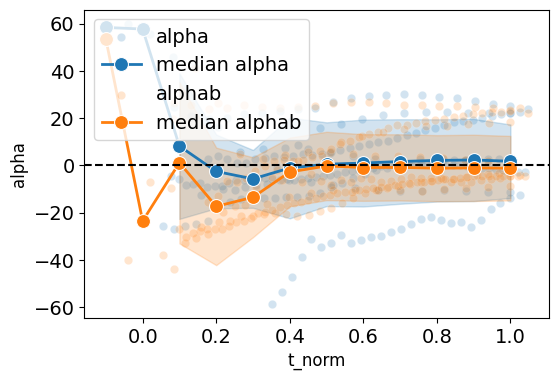

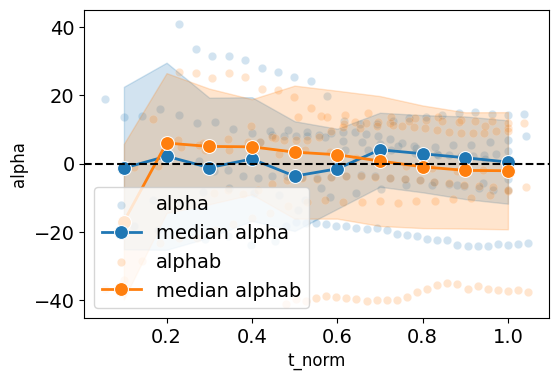

In [ ]:
db=DFx2[DFx2.t_mean<1.1]


f1,ax1=plotting.plot_single(db[db.lat.between(16,17)],'alpha',title='',scatter=True,estim='median',
                            error='band',err_kws={'alpha':1},color='tab:blue',ls='-')
f1,ax1=plotting.plot_single(db[db.lat.between(16,17)],'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                            estim='median',
                            error='band',err_kws={'alpha':1},ls='-')

ax1.axhline(0,color='black',linestyle='dashed')

plt.show()

f1,ax1=plotting.plot_single(db[db.lat.between(-17,-16)],'alpha',title='',scatter=True,estim='median',
                            error='band',err_kws={'alpha':1},color='tab:blue',ls='-')
f1,ax1=plotting.plot_single(db[db.lat.between(-17,-16)],'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                            estim='median',
                            error='band',err_kws={'alpha':1},ls='-')

ax1.axhline(0,color='black',linestyle='dashed')

plt.show()

In [ ]:
db2=db[db.t_mean==1].groupby('AR').mean().reset_index()
dbx=db2[(db2.lat.between(16,17)) | (db2.lat.between(-17,-16))][['AR','lat','alpha','alphab','flux']]


5.523730300905519
4.868938600272937


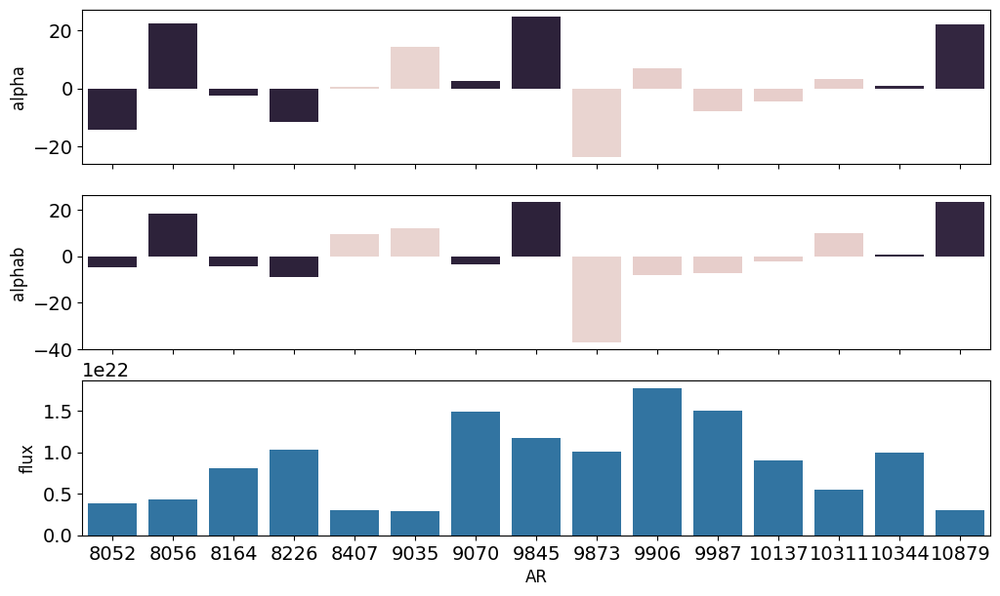

In [ ]:

f,ax=plt.subplots(3,1,figsize=(12,7),sharex=True)
ax=np.ravel(ax)
sns.barplot(data=dbx,x='AR',y='alpha',hue='lat',ax=ax[0])
sns.barplot(data=dbx,x='AR',y='alphab',hue='lat',ax=ax[1])
sns.barplot(data=dbx,x='AR',y='flux',ax=ax[2])

ax[0].legend().remove()
ax[1].legend().remove()

print(dbx[~dbx.AR.isin([8052,9873])].alpha.mean())
print(dbx[~dbx.AR.isin([8052,9873])].alphab.mean())


In [ ]:
db2=db[db.t_mean==1].groupby('AR').mean().reset_index()
db2[db2.lat.between(16,17)][['AR','alpha']]


In [ ]:
print(DFx2[DFx2.lat.between(16,17)]['AR'].unique())
print(DFx2[DFx2.lat.between(-17,-16)]['AR'].unique())

[ 8226 10344  9845 10879  9070  8052  8056  8164]
[10311  9873  9906  8407  9987  9035 10137]


<Axes: xlabel='lat', ylabel='Count'>

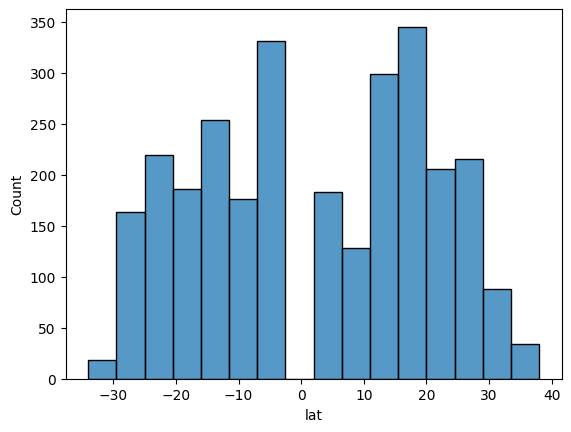

In [ ]:
sns.histplot(DFx2.lat)

# Few Plots

In [ ]:
db=DFx2.groupby(['AR','t_mean']).mean().reset_index()
#

In [ ]:
DFx2.AR.unique()

array([ 8193,  9218,  8205,  8722,  8214, 10268,  8226, 10274,  9764,
        8749,  9267,  8757,  8760, 10311,  9290,  9291, 10323,  9308,
        8797, 10344, 10349,  9844,  9845,  8828, 10879, 10385,  9873,
        8851, 10900, 10391,  9368,  9880,  9884,  9906,  9396,  9910,
        9399,  9912,  8898,  8900,  9417,  9931,  8913,  8404,  8407,
       10456,  9432, 10971,  8924,  9441, 10987,  9456,  8699,  9978,
       11007,  9987,  8968,  8972, 11024,  8986,  8476,  9511,  8488,
        9512,  7982, 10043,  9531, 10045, 10050,  9032, 10569,  9035,
        8524,  9548,  8016,  8536,  9563,  9569,  9574,  9063,  8040,
        8552,  9069,  9070, 10099,  8052, 10103,  8056,  8060,  8582,
        8589,  9103, 10130, 10132,  8084,  8088, 10137, 10144,  8614,
        9139,  8628,  9144,  8122,  9660,  8130,  9154,  8649,  9678,
        9170,  9689,  8164,  8167,  9192,  8171,  9710, 10226,  8690,
       10747])

In [ ]:
db1=db[db.t_mean==1]
db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))

/tmp/ipykernel_530/965072459.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))


<>:13: SyntaxWarning: invalid escape sequence '\m'
<>:13: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-331555565.py:13: SyntaxWarning: invalid escape sequence '\m'
  ax.set_title(f'$t_\mathrm{{norm}} =${tt}')
/tmp/ipython-input-331555565.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))


RSME alpha: 16.28 deg; rho: 0.113768
RSME alphab: 24.03 deg; rho: 0.134998
RSME alpha: 14.05 deg; rho: 0.162635
RSME alphab: 15.16 deg; rho: 0.196348
RSME alpha: 12.77 deg; rho: 0.275487
RSME alphab: 13.14 deg; rho: 0.298030


/tmp/ipython-input-331555565.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))
/tmp/ipython-input-331555565.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))


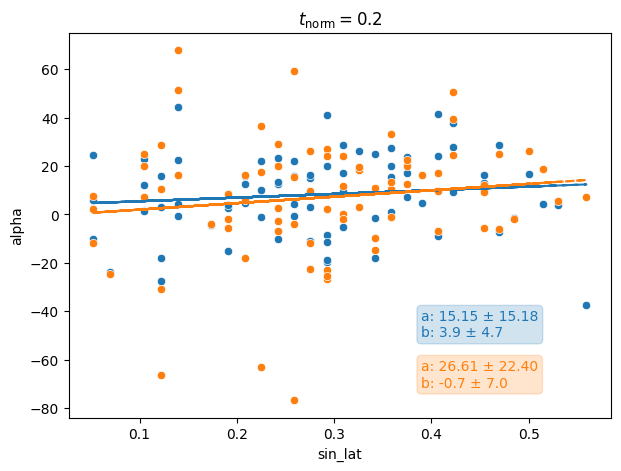

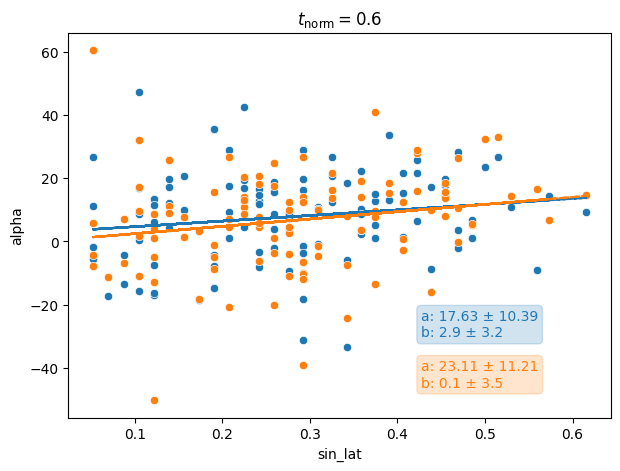

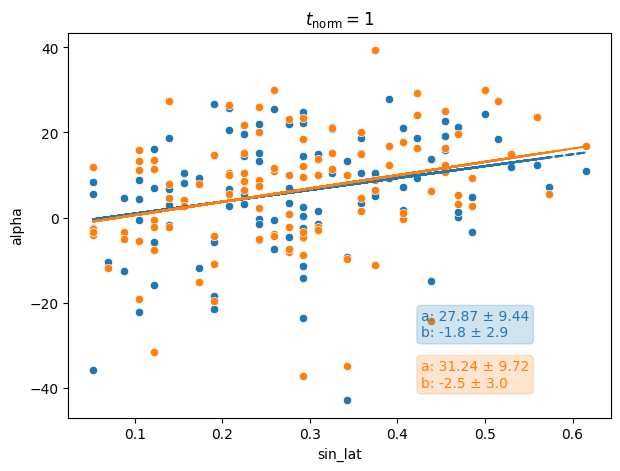

In [ ]:


f,ax=plt.subplots(1,2,figsize=(12,5))

db1=db[db['t_mean'].between(0.1,0.6)]
db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))
db1['lat']=db1['lat'].apply(lambda x: np.abs(x))


sns.scatterplot(data=db1,x='lat',y='alpha',ax=ax[0])
#sns.scatterplot(data=DFx2[DFx2.AR.isin(arshigh)],x='t_norm',y='fint',color='tab:orange',alpha=0.3,ax=ax1)

ax1.legend().remove()

ax2=ax[1]
sns.histplot(data=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index(),x='flux',ax=ax2)
ax2.axvline(DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index().flux.median(),color='red',linestyle='--',linewidth=2,
            label=f'Median Flux: {DFx2[DFx2.t_mean==1].groupby("AR").mean().reset_index().flux.median():.2e} Mx')

ax2.set_ylabel('Number of ARs',fontsize=14)
ax2.yaxis.set_label_position("right")
ax2.yaxis.tick_right()
ax2.set_xlabel('Flux at $t_{max}$ [Mx]',fontsize=14)

ax1.text(0.05,0.9,'(a)',transform=ax1.transAxes,fontsize=24)
ax2.text(0.05,0.9,'(b)',transform=ax2.transAxes,fontsize=24)

f.tight_layout()
f.savefig('../figures/flux-all.pdf',dpi=300)


for tt in [0.2,0.6,1]:

  db1=db[db.t_mean==tt]
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))

  f,ax=plt.subplots(figsize=(7,5))

  for var in ['alpha','alphab']:
    res = stats.linregress(db1['sin_lat'].values, db1[var].values,alternative='greater')
    color='tab:blue' if var=='alpha' else 'tab:orange'
    sns.scatterplot(data=db1,x='sin_lat',y=var,ax=ax,color=color)
    ax.plot(db1['sin_lat'].values,res.slope*db1['sin_lat'].values+res.intercept,color=color,linestyle='--')
    ax.set_title(f'$t_\mathrm{{norm}} =${tt}')

    ax.text(
        0.65, 0.21 if var == 'alpha' else 0.08,
        f"a: {res.slope:.2f} ± {res.stderr:.2f}\nb: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
        color=color,
        transform=ax.transAxes,
        fontsize=10,
        bbox=dict(boxstyle="round", alpha=0.2, color=color)
    )
    rmse = ((db1[var] - (res.slope * db1['sin_lat'] + res.intercept)) ** 2).mean() ** 0.5

    print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')

  f.show()


/tmp/ipython-input-1961835744.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))
/tmp/ipython-input-1961835744.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['lat']=db1['lat'].apply(lambda x: np.abs(x))


RSME alpha: 16.03 deg; rho: 0.158561
RSME alphab: 18.68 deg; rho: 0.203441


/tmp/ipython-input-1961835744.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))
/tmp/ipython-input-1961835744.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db1['lat']=db1['lat'].apply(lambda x: np.abs(x))


RSME alpha: 13.28 deg; rho: 0.246275
RSME alphab: 13.59 deg; rho: 0.254208


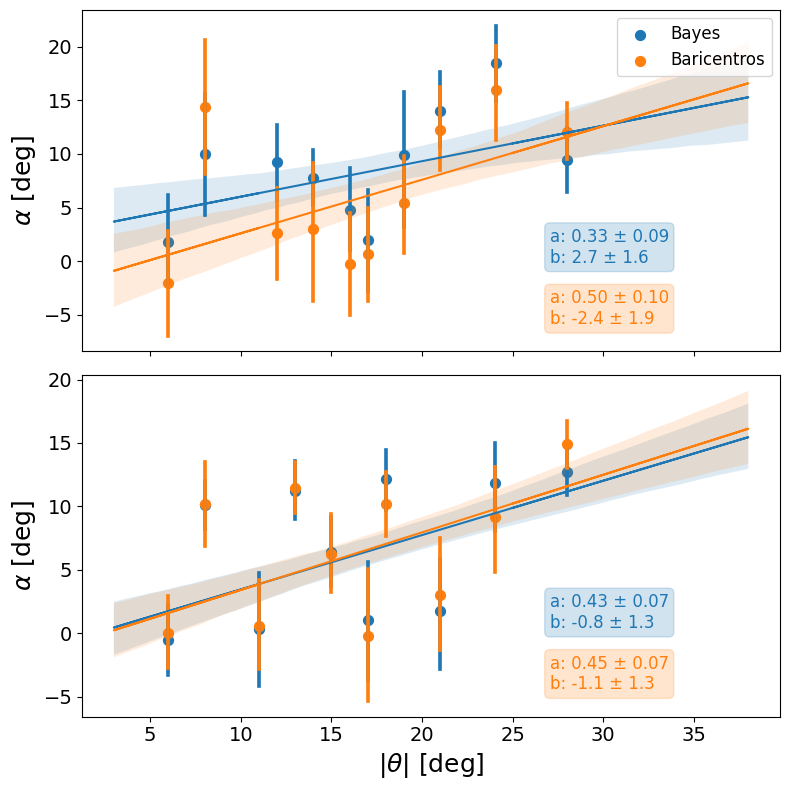

In [ ]:
f,ax=plt.subplots(2,1,figsize=(8,8),sharex=True)

db1=db[db['t_mean'].between(0.1,0.6)]
db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))
db1['lat']=db1['lat'].apply(lambda x: np.abs(x))


sns.regplot(data=db1,x='lat',y='alpha',ax=ax[0],x_bins=10,line_kws=dict(linestyle=None,alpha=0),label='Bayes')
#
sns.regplot(data=db1,x='lat',y='alphab',ax=ax[0],x_bins=10,line_kws=dict(linestyle=None,alpha=0),label='Baricentros')
ax[0].set_xlabel('')
for var in ['alpha','alphab']:
  res = stats.linregress(db1['lat'].values, db1[var].values,alternative='greater')
  color='tab:blue' if var=='alpha' else 'tab:orange'

  ax[0].plot(db1['lat'].values,res.slope*db1['lat'].values+res.intercept,color=color,linestyle='-')
  #ax[0].set_title(f'$t_\mathrm{{norm}} =${tt}')

  ax[0].text(
      0.67, 0.26 if var == 'alpha' else 0.08,
      f"a: {res.slope:.2f} ± {res.stderr:.2f}\nb: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
      color=color,
      transform=ax[0].transAxes,
      fontsize=12,
      bbox=dict(boxstyle="round", alpha=0.2, color=color)
  )
  rmse = ((db1[var] - (res.slope * db1['lat'] + res.intercept)) ** 2).mean() ** 0.5

  print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')

ax[0].legend(loc='upper right',fontsize=12)


db1=db[db.t_mean>0.6]
db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))
db1['lat']=db1['lat'].apply(lambda x: np.abs(x))


sns.regplot(data=db1,x='lat',y='alpha',ax=ax[1],x_bins=10,line_kws=dict(linestyle=None,alpha=0),label='Bayes')
#
sns.regplot(data=db1,x='lat',y='alphab',ax=ax[1],x_bins=10,line_kws=dict(linestyle=None,alpha=0),label='Baricentros')
ax[1].set_xlabel('')
for var in ['alpha','alphab']:
  res = stats.linregress(db1['lat'].values, db1[var].values,alternative='greater')
  color='tab:blue' if var=='alpha' else 'tab:orange'

  ax[1].plot(db1['lat'].values,res.slope*db1['lat'].values+res.intercept,color=color,linestyle='-')
  #ax[0].set_title(f'$t_\mathrm{{norm}} =${tt}')

  ax[1].text(
      0.67, 0.26 if var == 'alpha' else 0.08,
      f"a: {res.slope:.2f} ± {res.stderr:.2f}\nb: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
      color=color,
      transform=ax[1].transAxes,
      fontsize=12,
      bbox=dict(boxstyle="round", alpha=0.2, color=color)
  )
  rmse = ((db1[var] - (res.slope * db1['lat'] + res.intercept)) ** 2).mean() ** 0.5

  print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')

for ax1 in ax:
  ax1.set_ylabel(r'$\alpha$ [deg]',fontsize=18)
  ax1.tick_params(axis='both', labelsize=14)

ax[1].set_xlabel(r'$|\theta|$ [deg]',fontsize=18)

f.tight_layout()

f.savefig('/content/joy.pdf',dpi=300)

<>:11: SyntaxWarning: invalid escape sequence '\m'
<>:11: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-2878584332.py:11: SyntaxWarning: invalid escape sequence '\m'
  ax.set_title(f'$t_\mathrm{{norm}} =${tt}')


RSME alpha: 14.91 deg; rho: 0.203219
RSME alphab: 16.38 deg; rho: 0.216635


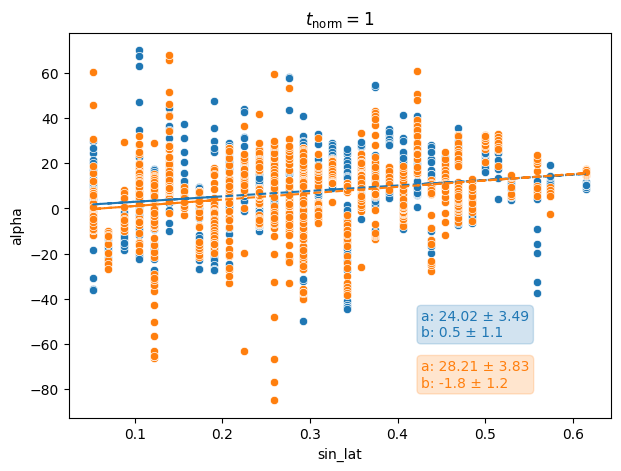

In [ ]:


db1=db
db1['sin_lat']=db1['lat'].apply(lambda x: np.sin(np.radians(np.abs(x))))

f,ax=plt.subplots(figsize=(7,5))

for var in ['alpha','alphab']:
  res = stats.linregress(db1['sin_lat'].values, db1[var].values,alternative='greater')
  color='tab:blue' if var=='alpha' else 'tab:orange'
  sns.scatterplot(data=db1,x='sin_lat',y=var,ax=ax,color=color)
  ax.plot(db1['sin_lat'].values,res.slope*db1['sin_lat'].values+res.intercept,color=color,linestyle='--')
  ax.set_title(f'$t_\mathrm{{norm}} =${tt}')

  ax.text(
      0.65, 0.21 if var == 'alpha' else 0.08,
      f"a: {res.slope:.2f} ± {res.stderr:.2f}\nb: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
      color=color,
      transform=ax.transAxes,
      fontsize=10,
      bbox=dict(boxstyle="round", alpha=0.2, color=color)
  )
  rmse = ((db1[var] - (res.slope * db1['sin_lat'] + res.intercept)) ** 2).mean() ** 0.5

  print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')

f.show()

In [ ]:
db1=db[db.t_mean==1]

# Sample data
x = db1['sin_lat'].values
y = db1['alphab'].values

# Reshape x to be a 2D array (column vector) for lstsq
X = x.reshape(-1, 1)

# Perform least squares fit with intercept forced to zero
# The 'rcond' parameter addresses potential issues with ill-conditioned matrices
m, residuals, rank, singular_values = np.linalg.lstsq(X, y, rcond=None)

# The slope (m) is the first (and only) element of the 'm' array
slope = m[0]

print(f"Slope (m): {slope}")
print(f"Equation: y = {slope:.2f}x")

Slope (m): 23.855145774429207
Equation: y = 23.86x


# SOME PLOTS

In [ ]:
areas=pd.read_csv('/content/plot-tilt-stats/data/areas.csv')

In [ ]:
dfm=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()
dfarea=pd.merge(areas,dfm,on='AR')

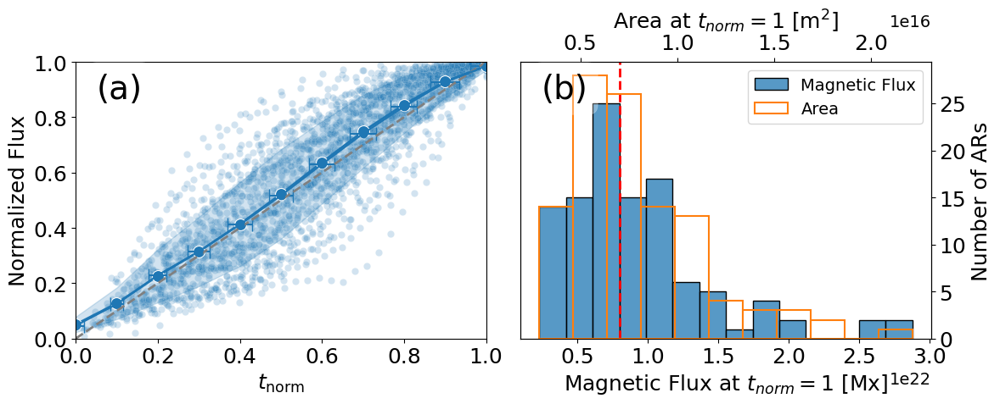

In [ ]:
'''
This plot shows the normalized flux vs normalized time for all active regions (ARs).
The flux is normalized by the maximum flux of each AR, and the time is normalized to 1
by the time of maximum flux. The plot includes scatter points for each data point.

'''



f,ax=plt.subplots(1,2,figsize=(12,5))


DFbb=DFx2.groupby('t_mean').mean().reset_index()

f,ax1=plotting.plot_single(DFx2,'fint',title='',scatter=True,fig=f,ax=ax[0])
ax1.set_ylabel('Normalized Flux',fontsize=18)
ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=18)
ax1.set_xlim(0,1)
ax1.errorbar(
    x=DFbb['t_mean'].values,
    y=DFbb['fint'].values,
    color='tab:blue',
    xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
   # yerr=DF1['alpha_err'].values,  # Specify y-axis error
    fmt='-o',          # Line with circle markers
    capsize=6          # Add caps to the error bars
)
ax1.legend().remove()
ax1.tick_params(axis='both', labelsize=18)

ax1.plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1),color='gray',linestyle='--',linewidth=2)
ax1.set_ylim(0,1)

dfm=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arshigh=dfm[dfm.flux>=dfm.flux.median()].AR.unique()
arslow=dfm[dfm.flux<dfm.flux.median()].AR.unique()

#sns.scatterplot(data=DFx2[DFx2.AR.isin(arshigh)],x='t_norm',y='fint',color='tab:orange',alpha=0.3,ax=ax1)

ax1.legend().remove()

ax2=ax[1]
sns.histplot(data=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index(),x='flux',ax=ax2,label='Magnetic Flux')

ax2.set_ylabel('Number of ARs',fontsize=18)
ax2.yaxis.set_label_position("right")
ax2.yaxis.tick_right()
ax2.tick_params(axis='both', labelsize=18)
ax2.set_xlabel(r'Magnetic Flux at $t_{norm}=1$ [Mx]',fontsize=18)

h,l=ax2.get_legend_handles_labels()

ax2b=ax2.twiny()
sns.histplot(data=dfarea,x='area',ax=ax2b,color='tab:orange',fill=None,label='Area')
ax2b.set_xlabel(r'Area at $t_{norm}=1$ [m$^2$]',fontsize=18)
ax2b.tick_params(axis='both', labelsize=18)

#ax2c=ax2b.twiny()
#sns.histplot(data=dfarea,x='area',ax=ax2b,color='tab:green',fill=None)
h2,l2=ax2b.get_legend_handles_labels()
ax2b.legend([*h,*h2],[*l,*l2])

ax1.text(0.05,0.87,'(a)',transform=ax1.transAxes,fontsize=28,bbox=dict(facecolor='white', alpha=0.3,edgecolor='white',linewidth=0.5,boxstyle="round"))
ax2b.text(0.05,0.87,'(b)',transform=ax2b.transAxes,fontsize=28,bbox=dict(facecolor='white', alpha=0.3,edgecolor='white',linewidth=0.5,boxstyle="round"))


ax2.axvline(DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index().flux.median(),color='red',linestyle='--',linewidth=2,
            label=f'Median Flux: {DFx2[DFx2.t_mean==1].groupby("AR").mean().reset_index().flux.median():.2e} Mx')



f.tight_layout()
f.savefig('../figures/flux-all.pdf',dpi=300)

In [ ]:
h

[<BarContainer object of 12 artists>]

62
22
9
7


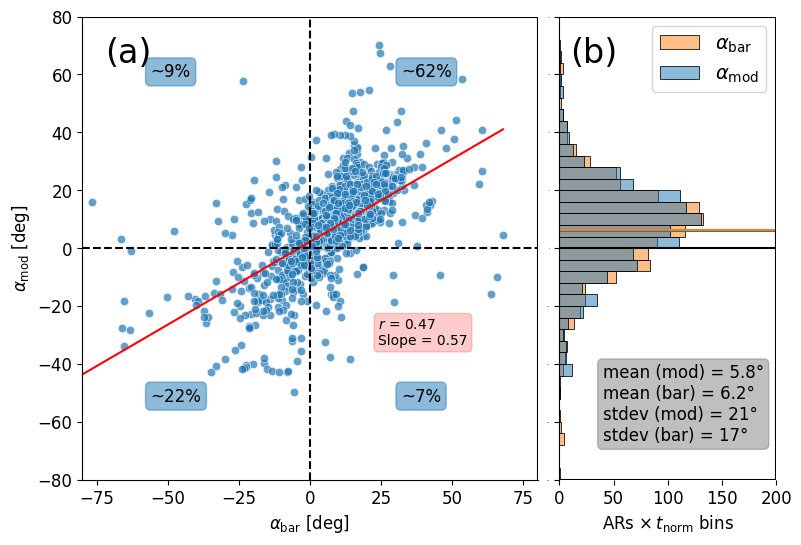

In [ ]:
db=DFx2[DFx2.t_mean<=1].groupby(['AR','t_mean']).mean().reset_index()
#
#
#  Jointplot de seaborn con histograma extendido en marg_y


g = sns.jointplot(
    data=db,
    x='alphab',
    y='alpha',
    kind='scatter',
    alpha=0.7,
    marginal_kws={'bins': 30,'binrange':(-80,80), 'fill': True},
    ratio=2,height=8,space=0.1)

g.set_axis_labels(r'$\alpha_\mathrm{bar}$ [deg]',r'$\alpha_\mathrm{mod}$ [deg]', fontsize=12)

g.ax_marg_x.set_visible(False)
#g.ax_marg_y.set_visible(False)
g.ax_marg_x.clear()
g.ax_marg_y.clear()
g.ax_marg_x.set_xlabel('X axis label')
g.ax_marg_y.set_ylabel('Y axis label')
g.ax_joint.tick_params(axis='both', labelsize=12)

#g.ax_marg_y.tick_params(axis='y', labelsize=12)

hist=sns.histplot(data=pd.melt(db,id_vars=['t_norm','lat','AR','fint','mag','flux'],value_vars=['alpha','alphab']),y='value',
                  hue='variable',
             palette=['tab:blue','tab:orange'],
             alpha=0.5,ax=g.ax_marg_y,binrange=(-80,80),bins=40)

# Linear fit
slope, intercept, r_value, p_value, std_err = stats.linregress(db['alphab'], db['alpha'])

# Add linear fit line
x_fit = np.linspace(db['alphab'].min(), db['alphab'].max(), 100)
y_fit = slope * x_fit + intercept
g.ax_joint.plot(x_fit, y_fit, color='red', label=f'Fit: y={slope:.2f}x+{intercept:.2f}')

# Annotate with correlation coefficient and slope
g.ax_joint.text(
    0.65, 0.35,
    f'$r$ = {r_value:.2f}\nSlope = {slope:.2f}',
    transform=g.ax_joint.transAxes,
    fontsize=10,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.2, color='red')
)

#g.ax_marg_y.legend()
g.ax_marg_y.legend(title='',labels=[r'$\alpha_\mathrm{bar}$',r'$\alpha_\mathrm{mod}$'],loc='upper right')
handles,labels=hist.get_legend_handles_labels()
#hist.legend(handles=handles,labels=labels,title=r'$t_{norm}$')
handles,labels=hist.get_legend_handles_labels()
g.ax_marg_y.set_ylabel('')
#
g.ax_marg_y.tick_params(axis='y', labelsize=10)  # Set y-ticklabel fontsize
g.ax_marg_y.tick_params(axis='x', labelsize=10)  # Set x-ticklabel fontsize (if needed)

g.ax_marg_y.axhline(0,color='black')

g.ax_marg_y.axhline(db.alpha.mean(),color='tab:blue')
g.ax_marg_y.axhline(db.alphab.mean(),color='tab:orange')

g.ax_joint.axvline(0,color='black',linestyle='dashed')
g.ax_joint.axhline(0,color='black',linestyle='dashed')
g.ax_joint.set_ylim(-80, 80)
g.ax_joint.set_xlim(-80, 80)

g.ax_marg_y.text(
    0.2, 0.25,
    f'mean (mod) = {db.alpha.mean():.1f}°\nmean (bar) = {db.alphab.mean():.1f}°\nstdev (mod) = {db.alpha.std():.0f}°\nstdev (bar) = {db.alphab.std():.0f}°',
    transform=g.ax_marg_y.transAxes,
    fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='gray')
)

g.ax_marg_y.set_xlim(0,200)

g.ax_joint.plot([-80,80],[80,80],color='black')
g.ax_joint.plot([80,80],[-80,80],color='black')
g.ax_marg_y.plot([0,200],[-80,-80],color='black')
g.ax_marg_y.plot([0,200],[80,80],color='black')
g.ax_marg_y.plot([200,200],[-80,80],color='black')
g.ax_marg_y.tick_params(axis='y', labelsize=0)
g.ax_marg_y.tick_params(axis='x', labelsize=12)
g.ax_marg_y.set_xlabel(r'ARs $\times\, t_\mathrm{norm}$ bins',fontsize=12)

aa=db.alpha.values
ab=db.alphab.values



print(round(100*sum((aa>0)*(ab>0))/len(aa)))
print(round(100*sum((aa<0)*(ab<0))/len(aa)))
print(round(100*sum((aa>0)*(ab<0))/len(aa)))
print(round(100*sum((aa<0)*(ab>0))/len(aa)))

g.ax_joint.text(0.7,0.9,f'~{round(100*sum((aa>0)*(ab>0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))
g.ax_joint.text(0.15,0.9,f'~{round(100*sum((aa>0)*(ab<0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))
g.ax_joint.text(0.7,0.2,f'~{round(100*sum((aa<0)*(ab>0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))
g.ax_joint.text(0.15,0.2,f'~{round(100*sum((aa<0)*(ab<0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))


g.ax_joint.text(0.05,0.9,'(a)',transform=g.ax_joint.transAxes,fontsize=24)
g.ax_marg_y.text(0.05,0.9,'(b)',transform=g.ax_marg_y.transAxes,fontsize=24)

g.savefig('../figures/alpha-alpha.pdf',dpi=300)


63
22
10
6


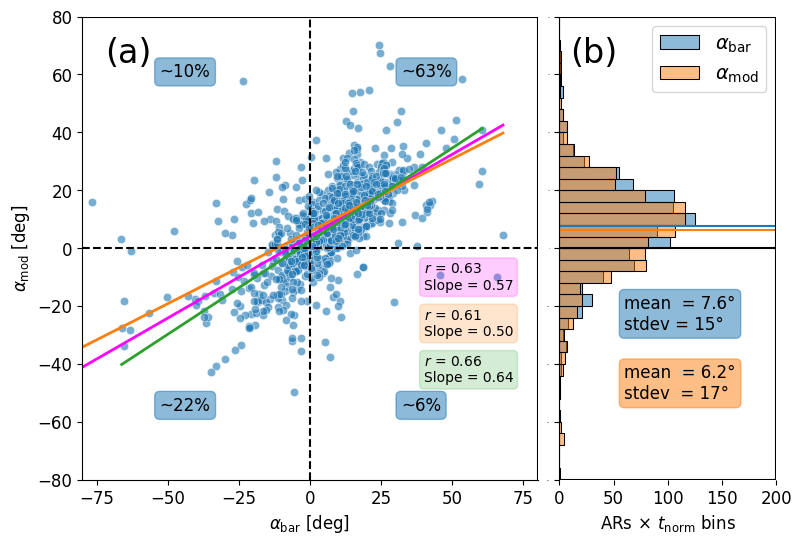

In [ ]:
db=DFx2[DFx2.t_mean<=1].groupby(['AR','t_mean']).mean().reset_index()
#
#
#  Jointplot de seaborn con histograma extendido en marg_y
arshigh=dfm[dfm.flux>=dfm.flux.median()].AR.unique()
dbh=db[db.AR.isin(arshigh)]
arslow=dfm[dfm.flux<dfm.flux.median()].AR.unique()
dbl=db[db.AR.isin(arslow)]

g = sns.jointplot(
    data=db,
    x='alphab',
    y='alpha',
    kind='scatter',
    alpha=0.6,
    marginal_kws={'bins': 30,'binrange':(-80,80), 'fill': True},
    ratio=2,height=8,space=0.1)

g.set_axis_labels(r'$\alpha_\mathrm{bar}$ [deg]',r'$\alpha_\mathrm{mod}$ [deg]', fontsize=12)

g.ax_marg_x.set_visible(False)
#g.ax_marg_y.set_visible(False)
g.ax_marg_x.clear()
g.ax_marg_y.clear()
g.ax_marg_x.set_xlabel('X axis label')
g.ax_marg_y.set_ylabel('Y axis label')
g.ax_joint.tick_params(axis='both', labelsize=12)

#g.ax_marg_y.tick_params(axis='y', labelsize=12)

#hist=sns.histplot(data=pd.melt(db,id_vars=['t_norm','lat','AR','fint','mag','flux'],value_vars=['alpha','alphab']),y='value',
#                  hue='variable',
#             palette=['tab:blue','tab:orange'],
#             alpha=0.5,ax=g.ax_marg_y,binrange=(-80,80),bins=40)
hist=sns.histplot(y=db.alpha.values,
           #       hue='variable',
          #   palette=['tab:blue','tab:orange'],
             alpha=0.5,ax=g.ax_marg_y,binrange=(-80,80),bins=40)

hist2=sns.histplot(y=db.alphab.values,
           #       hue='variable',
          #   palette=['tab:blue','tab:orange'],
             alpha=0.5,ax=g.ax_marg_y,binrange=(-80,80),bins=40)



# Linear fit


for i,db1,color in zip([0,1,2],[db,dbh,dbl],['magenta','tab:orange','tab:green']):
    slope, intercept, r_value, p_value, std_err = stats.linregress(db1['alphab'], db1['alpha'])

    # Add linear fit line
    x_fit = np.linspace(db1['alphab'].min(), db1['alphab'].max(), 100)
    y_fit = slope * x_fit + intercept
    g.ax_joint.plot(x_fit, y_fit, color=color,linewidth=2, label=f'Fit: y={slope:.2f}x+{intercept:.2f}')


    # Annotate with correlation coefficient and slope
    g.ax_joint.text(
        0.75, 0.47-i/10,
        f'$r$ = {r_value:.2f}\nSlope = {slope:.2f}',
        transform=g.ax_joint.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle="round", alpha=0.2, color=color)
    )

#g.ax_marg_y.legend()
g.ax_marg_y.legend(title='',labels=[r'$\alpha_\mathrm{bar}$',r'$\alpha_\mathrm{mod}$'],loc='upper right')
handles,labels=hist.get_legend_handles_labels()
#hist.legend(handles=handles,labels=labels,title=r'$t_{norm}$')
handles,labels=hist.get_legend_handles_labels()
g.ax_marg_y.set_ylabel('')
#
g.ax_marg_y.tick_params(axis='y', labelsize=10)  # Set y-ticklabel fontsize
g.ax_marg_y.tick_params(axis='x', labelsize=10)  # Set x-ticklabel fontsize (if needed)

g.ax_marg_y.axhline(0,color='black')

g.ax_marg_y.axhline(db.alpha.mean(),color='tab:blue')
g.ax_marg_y.axhline(db.alphab.mean(),color='tab:orange')

g.ax_joint.axvline(0,color='black',linestyle='dashed')
g.ax_joint.axhline(0,color='black',linestyle='dashed')
g.ax_joint.set_ylim(-80, 80)
g.ax_joint.set_xlim(-80, 80)

g.ax_marg_y.text(
    0.3, 0.4,
    f'mean  = {db.alpha.mean():.1f}°\nstdev = {db.alpha.std():.0f}°',
    transform=g.ax_marg_y.transAxes,
    fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue')
)

g.ax_marg_y.text(
    0.3, 0.25,
    f'mean  = {db.alphab.mean():.1f}°\nstdev  = {db.alphab.std():.0f}°',
    transform=g.ax_marg_y.transAxes,
    fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:orange')
)


g.ax_marg_y.set_xlim(0,200)

g.ax_joint.plot([-80,80],[80,80],color='black')
g.ax_joint.plot([80,80],[-80,80],color='black')
g.ax_marg_y.plot([0,200],[-80,-80],color='black')
g.ax_marg_y.plot([0,200],[80,80],color='black')
g.ax_marg_y.plot([200,200],[-80,80],color='black')
g.ax_marg_y.tick_params(axis='y', labelsize=0)
g.ax_marg_y.tick_params(axis='x', labelsize=12)
g.ax_marg_y.set_xlabel(r'ARs$\,\times\,t_\mathrm{norm}$ bins',fontsize=12)

aa=db.alpha.values
ab=db.alphab.values



print(round(100*sum((aa>0)*(ab>0))/len(aa)))
print(round(100*sum((aa<0)*(ab<0))/len(aa)))
print(round(100*sum((aa>0)*(ab<0))/len(aa)))
print(round(100*sum((aa<0)*(ab>0))/len(aa)))

g.ax_joint.text(0.7,0.9,f'~{round(100*sum((aa>0)*(ab>0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))
g.ax_joint.text(0.17,0.9,f'~{round(100*sum((aa>0)*(ab<0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))
g.ax_joint.text(0.7,0.18,f'~{round(100*sum((aa<0)*(ab>0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))
g.ax_joint.text(0.17,0.18,f'~{round(100*sum((aa<0)*(ab<0))/len(aa))}%',transform=g.ax_joint.transAxes,
                fontsize=12,
    verticalalignment='top',
    bbox=dict(boxstyle="round", alpha=0.5, color='tab:blue'))


g.ax_joint.text(0.05,0.9,'(a)',transform=g.ax_joint.transAxes,fontsize=24)
g.ax_marg_y.text(0.05,0.9,'(b)',transform=g.ax_marg_y.transAxes,fontsize=24)

g.savefig('../figures/alpha-alpha.pdf',dpi=300)


In [ ]:
len(DFx2.AR.unique())

108

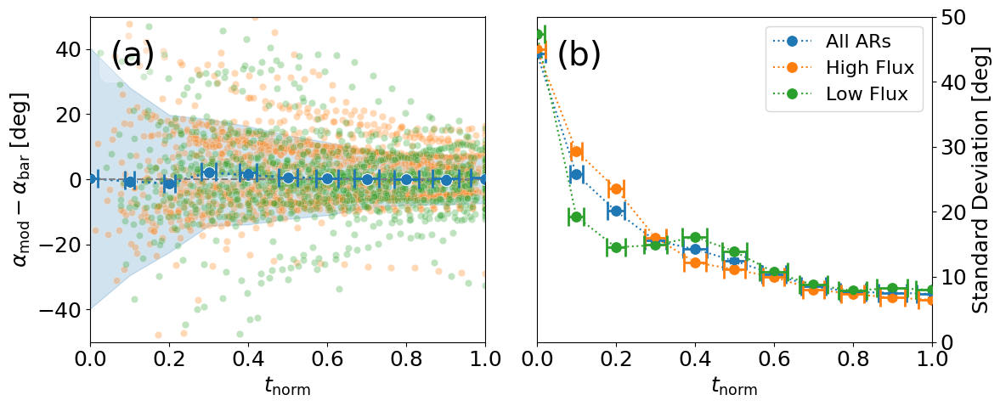

In [ ]:
'''
plot showing the difference between the modeled alpha and barycenter alpha
as a function of normalized time for all active regions (ARs).
Solid line represents the median difference at each normalized time.
The shaded-area plot represents the standard deviation of the difference at each normalized time,
with scatter points for individual data points. Solid dashed line at y=0 for reference.
'''


f,ax=plt.subplots(1,2,figsize=(12,5))

dfm=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arshigh=dfm[dfm.flux>=dfm.flux.median()].AR.unique()
arslow=dfm[dfm.flux<dfm.flux.median()].AR.unique()

f,ax1=plotting.plot_single(DFx2,'frac',title='',scatter=False,fig=f,ax=ax[0],estim='median',ls=':')

sns.scatterplot(DFx2[DFx2.AR.isin(arshigh)],x='t_norm',y='frac',color='tab:orange',alpha=0.3,ax=ax1,label='High Flux ARs')
sns.scatterplot(DFx2[DFx2.AR.isin(arslow)],x='t_norm',y='frac',color='tab:green',alpha=0.3,ax=ax1,label='Low Flux ARs')
DFbb=DFx2.groupby('t_mean').median().reset_index()



ax1.errorbar(
    x=DFbb['t_mean'].values,
    y=DFbb['frac'].values,
    color='tab:blue',
    linewidth=0,
    xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
   # yerr=DF1['alpha_err'].values,  # Specify y-axis error
    fmt='-o',          # Line with circle markers
    capsize=8,          # Add caps to the error bars
    capthick=2,
    elinewidth=2,zorder=4

)


ax1.set_ylabel(r'$\alpha_\mathrm{mod} - \alpha_\mathrm{bar}$ [deg]',fontsize=18)
ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=18)
ax1.set_xlim(0,1)
ax1.set_ylim(-50,50)
ax1.axhline(0,color='gray',ls='--')
ax1.legend().remove()

ax2=ax[1]

for rr,lab,col in zip([ars,arshigh,arslow],['All ARs', 'High Flux', 'Low Flux'],['tab:blue','tab:orange','tab:green']):

  sns.lineplot(DFx2[DFx2.AR.isin(rr)].groupby(['t_mean']).std().reset_index(),x='t_mean',y='frac',marker='o',ax=ax2,label=lab,color=col,ls=':',markersize=10)
  DFbb=DFx2[DFx2.AR.isin(rr)].groupby('t_mean').mean().reset_index()
  DFbb2=DFx2[DFx2.AR.isin(rr)].groupby('t_mean').std().reset_index()

  ax2.errorbar(
    x=DFbb2['t_mean'].values,
    y=DFbb2['frac'].values,
    color=col,
    linewidth=0,
    xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
   # yerr=DF1['alpha_err'].values,  # Specify y-axis error
    fmt='-o',          # Line with circle markers
    capsize=8,          # Add caps to the error bars
    capthick=2,
    elinewidth=2,zorder=4

  )


ax2.set_ylim(0,50)

ax2.legend(fontsize=16)

ax2.set_ylabel('Standard Deviation [deg]',fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.yaxis.set_label_position("right")
ax2.yaxis.tick_right()
ax2.set_xlabel(r'$t_\mathrm{norm}$',fontsize=18)
ax1.tick_params(axis='both', which='major', labelsize=18)

ax1.text(0.05,0.85,'(a)',transform=ax1.transAxes,fontsize=28,
         bbox=dict(facecolor='white', alpha=0.3,edgecolor='white',linewidth=0.5,boxstyle="round"))
ax2.text(0.05,0.85,'(b)',transform=ax2.transAxes,fontsize=28,
         bbox=dict(facecolor='white', alpha=0.3,edgecolor='white',linewidth=0.5,boxstyle="round"))
ax2.set_xlim(0,1)

f.tight_layout()


f.savefig('../figures/alpha-err.pdf',dpi=300)

In [ ]:
DFx2=DFx2.assign(t_mean=lambda x: round(10*x.t_norm)/10)

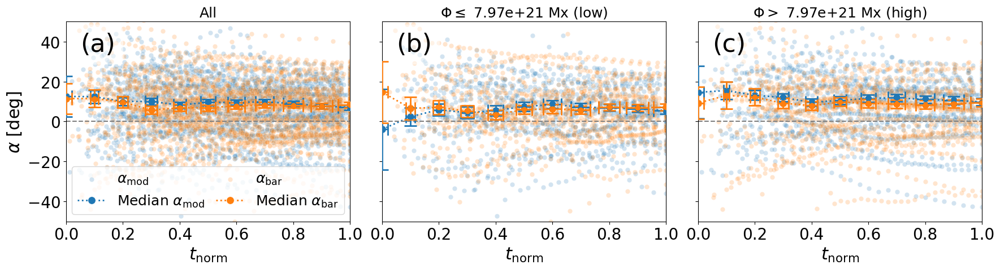

In [ ]:
'''
plot of alpha vs normalized time for all ARs, and for low and high flux subsets.
Solid lines represent the median alpha at each normalized time for both modeled and barycenter methods.
Scatter points represent individual data points. Solid dashed line at y=0 for reference.

'''

ff=22

f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)



db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([DFx2,DFx2[DFx2.AR.isin(arslowf)],DFx2[DFx2.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):


    f,ax2=plotting.plot_single(db1,'alpha',title='',ax=ax1,fig=f,scatter=True,estim='median',
                               error=None,
                               err_kws={'alpha':1},color='tab:blue',ls=':')
    f,ax2=plotting.plot_single(db1,'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                               estim='median',
                               error=None,
                               err_kws={'alpha':1},ls=':')

    DFxx=db1.groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()



    ax2.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alpha'].values,
        color='tab:blue',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2['alpha'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    ax2.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alphab'].values,
        color='tab:orange',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2['alphab'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    ax1.set_ylabel(r'$\alpha$ [deg]',fontsize=ff)
    ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-2)
    ax1.set_title(title,fontsize=ff-4)
    ax1.legend().remove()
    ax1.set_xlim(0,1)
    ax1.set_ylim(-50,50)
    ax1.axhline(0,color='gray',ls='--')



h,l=ax[0].get_legend_handles_labels()
ax[0].legend(ncols=2,fontsize=ff-4, columnspacing=0.8,handles=h,labels=[r'$\alpha_\mathrm{mod}$',r'Median $\alpha_\mathrm{mod}$',r'$\alpha_\mathrm{bar}$',r'Median $\alpha_\mathrm{bar}$'],loc='lower center')

for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.85,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=ff+10,zorder=5,bbox=dict(boxstyle="round", alpha=0.5, color='white'))

f.tight_layout(w_pad=-0.5)
f.savefig('../figures/alpha-vs-t_norm.pdf',dpi=300)

,lat
0,-22
1,-22
2,-22
3,-22
4,-22
...,...
2840,-7
2841,-7
2842,-7
2843,-7


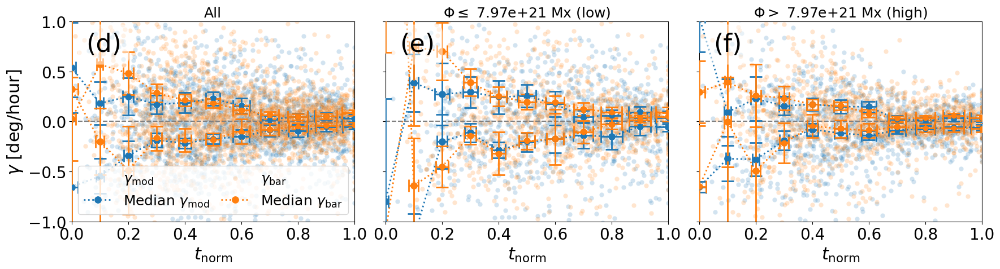

In [ ]:
f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)

ff=22

db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()



for var,col in zip(['rot','rotb'],['tab:blue','tab:orange']):
  for db1,ax1,title in zip([DFx2,DFx2[DFx2.AR.isin(arslowf)],DFx2[DFx2.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):

    dfm=db1.groupby('AR').sum().reset_index()

    arsp=dfm[dfm[var]>0].AR.values
    arsn=dfm[dfm[var]<0].AR.values

    # plot rot_cum in blue with circle marker and solid line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsp)],var,title='',marker='o',
                            color=col,error=None,estim='median',
                            err_kws={'alpha':1},ax=ax1,fig=f,scatter=True,ls=':')
        # plot rot_cum in blue with circle marker and solid line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsn)],var,title='',marker='o',
                            color=col,error=None,estim='median',
                            err_kws={'alpha':1},ax=ax1,fig=f,scatter=True,ls=':')

    DFxx=db1[db1.AR.isin(arsp)].groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()

    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb[var].values,
        color=col,
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2[var].values/np.sqrt(cc[var].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    DFxx=db1[db1.AR.isin(arsn)].groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()

    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb[var].values,
        color=col,
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2[var].values/np.sqrt(cc[var].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )




    ax1.legend().remove()
    ax1.set_ylabel(r'$\gamma$ [deg/hour]',fontsize=ff)
    ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-2)
    ax1.set_xlim(0,1)
    ax1.set_ylim(-1,1)
    ax1.axhline(0,color='gray',ls='--')
    ax1.set_title(title,fontsize=ff-4)

h,l=ax[0].get_legend_handles_labels()
ax[0].legend(ncols=2,fontsize=ff-4, columnspacing=0.8,handles=[*h[0:2],*h[4:6]],
             labels=[r'$\gamma_\mathrm{mod}$',r'Median $\gamma_\mathrm{mod}$',r'$\gamma_\mathrm{bar}$',r'Median $\gamma_\mathrm{bar}$'],
             loc='lower center')

for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.85,f'({chr(100+i)})',transform=ax1.transAxes,fontsize=ff+10,bbox=dict(boxstyle="round", alpha=0.5, color='white'),zorder=5)

f.tight_layout(w_pad=-0.5)
f.savefig('../figures/gamma-vs-t_norm.pdf',dpi=300)


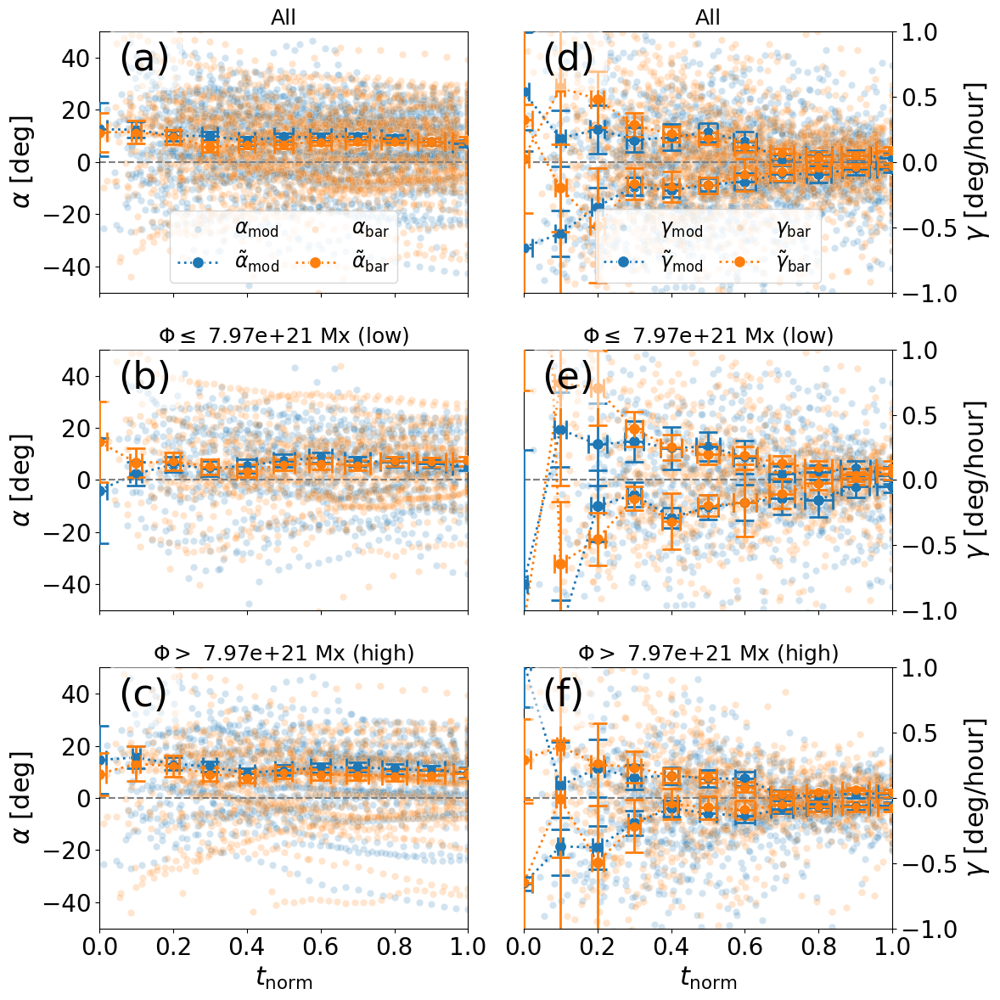

In [ ]:
'''
plot of alpha vs normalized time for all ARs, and for low and high flux subsets.
Solid lines represent the median alpha at each normalized time for both modeled and barycenter methods.
Scatter points represent individual data points. Solid dashed line at y=0 for reference.

'''

ff=22

f,ax=plt.subplots(3,2,figsize=(12,12),sharex=True)

ax=ax.flatten()

db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([DFx2,DFx2[DFx2.AR.isin(arslowf)],DFx2[DFx2.AR.isin(arshighf)]],ax[::2],
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):


    f,ax2=plotting.plot_single(db1,'alpha',title='',ax=ax1,fig=f,scatter=True,estim='median',
                               error=None,
                               err_kws={'alpha':1},color='tab:blue',ls=':')
    f,ax2=plotting.plot_single(db1,'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                               estim='median',
                               error=None,
                               err_kws={'alpha':1},ls=':')

    DFxx=db1.groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()



    ax2.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alpha'].values,
        color='tab:blue',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2['alpha'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    ax2.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alphab'].values,
        color='tab:orange',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2['alphab'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    ax1.set_ylabel(r'$\alpha$ [deg]',fontsize=ff)
    ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-2)
    ax1.set_title(title,fontsize=ff-4)
    ax1.legend().remove()
    ax1.set_xlim(0,1)
    ax1.set_ylim(-50,50)
    ax1.axhline(0,color='gray',ls='--')



h,l=ax[0].get_legend_handles_labels()
ax[0].legend(ncols=2,fontsize=ff-5, columnspacing=0.8,handles=h,labels=[r'$\alpha_\mathrm{mod}$',r'$\~\alpha_\mathrm{mod}$',r'$\alpha_\mathrm{bar}$',
                                                                        r'$\~\alpha_\mathrm{bar}$'],loc='lower center')

for i,ax1 in enumerate(ax[::2]):
    ax1.text(0.05,0.85,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=ff+10,zorder=5,bbox=dict(boxstyle="round", alpha=0.5, color='white'))




db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()



for var,col in zip(['rot','rotb'],['tab:blue','tab:orange']):
  for db1,ax1,title in zip([DFx2,DFx2[DFx2.AR.isin(arslowf)],DFx2[DFx2.AR.isin(arshighf)]],ax[1::2],
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):

    dfm=db1.groupby('AR').sum().reset_index()

    arsp=dfm[dfm[var]>0].AR.values
    arsn=dfm[dfm[var]<0].AR.values

    # plot rot_cum in blue with circle marker and solid line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsp)],var,title='',marker='o',
                            color=col,error=None,estim='median',
                            err_kws={'alpha':1},ax=ax1,fig=f,scatter=True,ls=':')
        # plot rot_cum in blue with circle marker and solid line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsn)],var,title='',marker='o',
                            color=col,error=None,estim='median',
                            err_kws={'alpha':1},ax=ax1,fig=f,scatter=True,ls=':')

    DFxx=db1[db1.AR.isin(arsp)].groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()

    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb[var].values,
        color=col,
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2[var].values/np.sqrt(cc[var].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    DFxx=db1[db1.AR.isin(arsn)].groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()

    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb[var].values,
        color=col,
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       yerr=DFbb2[var].values/np.sqrt(cc[var].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )




    ax1.legend().remove()
    ax1.set_ylabel(r'$\gamma$ [deg/hour]',fontsize=ff)
    ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-2)
    ax1.set_xlim(0,1)
    ax1.set_ylim(-1,1)
    ax1.axhline(0,color='gray',ls='--')
    ax1.set_title(title,fontsize=ff-4)
    ax1.yaxis.set_label_position('right')

    # Move the tick marks to the right side as well
    ax1.yaxis.tick_right()

h,l=ax[1].get_legend_handles_labels()
ax[1].legend(ncols=2,fontsize=ff-5, columnspacing=0.8,handles=[*h[0:2],*h[4:6]],
             labels=[r'$\gamma_\mathrm{mod}$',r'$\~\gamma_\mathrm{mod}$',r'$\gamma_\mathrm{bar}$',r'$\~\gamma_\mathrm{bar}$'],
             loc='lower center')

for i,ax1 in enumerate(ax[1::2]):
    ax1.text(0.05,0.85,f'({chr(100+i)})',transform=ax1.transAxes,fontsize=ff+10,bbox=dict(boxstyle="round", alpha=0.5, color='white'),zorder=5)

f.tight_layout()
f.savefig('../figures/alpha-gamma-vs-t_norm.pdf',dpi=300)


In [ ]:
DFx2.groupby('AR').sum().reset_index()

,AR,mag,da,alpha,a,R,N0,axf,xc,yc,...,gamma,sepax,stp,rot_cum,rotb_cum,t_norm,frac,t_mean,t_norm2,t_norm_err
0,7982,345.0,1.573590,322.978500,89.268763,283.263189,-4.412259,8.877730e+22,484.825275,468.015504,...,19.133714,27.016993,30.0,319.968061,159.297974,7.353962,164.972813,7.3,7.386937,0.865206
1,8040,900.0,4.479244,9.250909,133.106381,797.918646,-9.139328,8.525212e+22,1337.390056,562.633723,...,478.780379,995.926754,72.0,-919.886559,-433.484213,11.639606,46.459523,11.7,11.694673,1.036401
2,8052,1326.0,12.702524,-758.120664,297.776433,364.759731,21.015052,7.104992e+22,1081.979445,547.456041,...,813.524117,470.046035,52.0,1491.429988,2157.445354,17.913500,-604.066666,17.9,17.902743,0.949935
3,8056,238.0,4.434654,196.580733,113.029554,307.148045,-5.495364,6.405264e+22,579.372127,498.274367,...,284.822754,289.481695,28.0,1208.417869,1904.048058,8.752479,78.953957,8.8,8.786148,0.474340
4,8060,380.0,7.353149,-262.057798,124.105644,341.809682,12.840932,4.026492e+22,722.509525,657.964910,...,550.412672,392.081399,40.0,116.643876,-723.742092,15.003965,-357.689507,15.0,15.013865,0.707507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,10900,1653.0,10.486407,-57.508467,423.229188,2637.711626,54.728806,2.436619e+23,3768.485810,2768.924518,...,941.679801,2090.429426,58.0,-41.332295,-93.361458,45.849250,382.461126,45.9,45.357897,2.664299
104,10971,850.0,14.216506,-347.113985,138.772857,299.833321,18.610953,3.017219e+22,1130.634247,622.908580,...,1249.651830,614.190493,50.0,-1240.023774,2857.571373,14.165284,-476.093388,14.1,14.164041,0.797129
105,10987,1386.0,15.096187,456.767893,238.616307,803.239929,6.597470,1.522176e+23,1944.808993,1320.885802,...,1367.407455,1414.621565,66.0,-1810.452632,-1074.677526,22.792586,85.114981,22.8,22.816553,0.972229
106,11007,456.0,3.220324,194.777009,71.990138,622.130489,-17.754517,2.468516e+22,647.708122,422.723868,...,388.035455,715.681981,48.0,-1059.768462,59.211249,11.348814,89.110540,11.4,11.291665,0.802447


In [ ]:
DFx2.groupby('t_mean').count()

,mag,da,alpha,a,R,N0,axf,xc,yc,alphab,...,cond1,gamma,sepax,stp,rot_cum,rotb_cum,t_norm,frac,t_norm2,t_norm_err
t_mean,,,,,,,,,,,,,,,,,,,,,
-0.1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
0.0,11,11,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
0.1,90,90,90,90,90,90,90,90,90,90,...,90,90,90,90,90,90,90,90,90,90
0.2,181,181,181,181,181,181,181,181,181,181,...,181,181,181,181,181,181,181,181,181,181
0.3,254,254,254,254,254,254,254,254,254,254,...,254,254,254,254,254,254,254,254,254,254
0.4,294,294,294,294,294,294,294,294,294,294,...,294,294,294,294,294,294,294,294,294,294
0.5,307,307,307,307,307,307,307,307,307,307,...,307,307,307,307,307,307,307,307,307,307
0.6,323,323,323,323,323,323,323,323,323,323,...,323,323,323,323,323,323,323,323,323,323
0.7,322,322,322,322,322,322,322,322,322,322,...,322,322,322,322,322,322,322,322,322,322


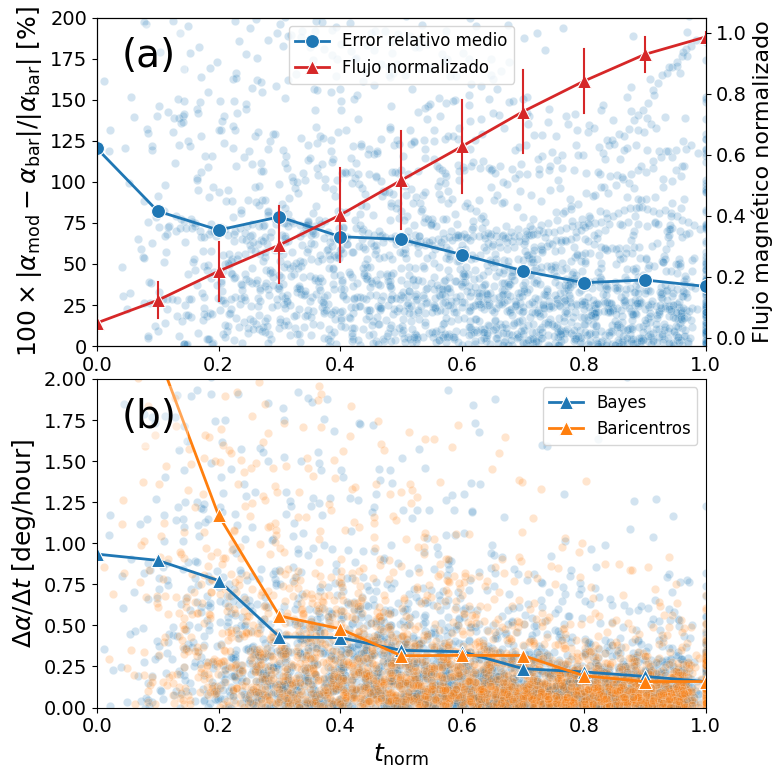

In [ ]:
f,ax=plt.subplots(2,1,figsize=(8,8))

DFx2=DFx2.assign(percerr=100*np.abs(DFx2.frac)/np.abs(DFx2.alphab))


f,ax0=plotting.plot_single(np.abs(DFx2),'percerr',title='',marker='o',
                        color='tab:blue',error=None,estim='median',
                        err_kws={'alpha':1},ax=ax[0],fig=f,scatter=True)

ax0.set_ylim(0,200)

h0,l0=ax0.get_legend_handles_labels()


ax0.set_ylabel(r'$100\times|\alpha_\mathrm{mod} - \alpha_\mathrm{bar}|/|\alpha_\mathrm{bar}|$ [%]',fontsize=18)


ax0b=ax0.twinx()

f,ax0b=plotting.plot_single(np.abs(DFx2),'fint',title='',marker='^',
                        color='tab:red',error='bars',estim='mean',
                        err_kws={'alpha':1},ax=ax0b,fig=f,scatter=False)

h0b,l0b=ax0b.get_legend_handles_labels()

ax0.legend([h0[1],h0b[0]],['Error relativo medio','Flujo normalizado'],loc='upper center',
           fontsize=12)

ax0b.legend().remove()
ax0b.set_ylabel(r'Flujo magnético normalizado',fontsize=16)
ax0.set_xlabel('')


db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()

f,ax1=plotting.plot_single(np.abs(DFx2),'rot',title='',marker='^',
                        color='tab:blue',error=None,estim='mean',
                        err_kws={'alpha':1},ax=ax[1],fig=f,scatter=True)

f,ax1=plotting.plot_single(np.abs(DFx2),'rotb',title='',marker='^',
                        color='tab:orange',error=None,estim='mean',
                        err_kws={'alpha':1},ax=ax[1],fig=f,scatter=True)

h,l=ax1.get_legend_handles_labels()
ax1.legend(h[1::2],['Bayes','Baricentros'],fontsize=12)

ax1.set_ylabel(r'$\Delta \alpha / \Delta t$ [deg/hour]',fontsize=18)
ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=18)

ax1.set_ylim(0,2)
ax1.set_xlim(0,1)
ax0.set_xlim(0,1)

ax1.tick_params(axis='both', labelsize=14)

for i,axx in enumerate([ax0,ax1]):
    axx.text(0.04,0.85,f'({chr(97+i)})',transform=axx.transAxes,fontsize=28,
             bbox=dict(facecolor='white', alpha=0.3,edgecolor='white',linewidth=0.5,boxstyle="round"))

f.tight_layout()
f.subplots_adjust(hspace=0.1)

f.savefig('/content/relerr-rot.pdf',dpi=300,pad_inches=2)



<>:44: SyntaxWarning: invalid escape sequence '\m'
<>:44: SyntaxWarning: invalid escape sequence '\c'
<>:44: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:44: SyntaxWarning: invalid escape sequence '\m'
<>:44: SyntaxWarning: invalid escape sequence '\c'
<>:44: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_227/3044516646.py:44: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(50,16,f'$\mu$: {dbx.rot_cum.mean():.1f}$^\circ$\n$\sigma$: {dbx.rot_cum.std():.1f}$^\circ$\nskew: {dbx.rot_cum.skew():.2f}',
/tmp/ipykernel_227/3044516646.py:44: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(50,16,f'$\mu$: {dbx.rot_cum.mean():.1f}$^\circ$\n$\sigma$: {dbx.rot_cum.std():.

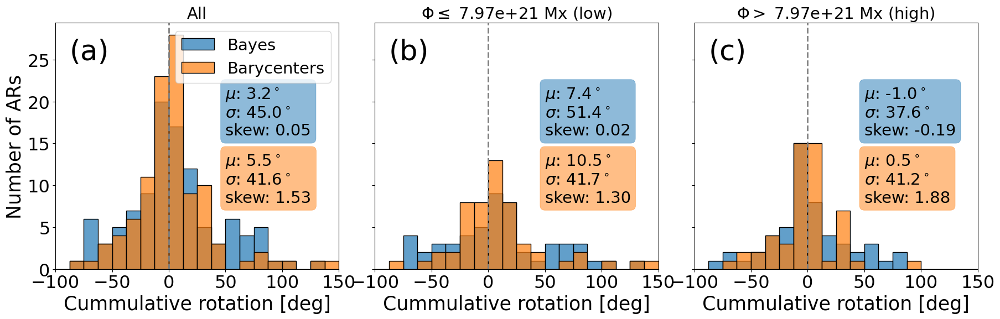

In [37]:
'''
plot of cumulative rotation for all ARs, and for low and high flux subsets.
Histograms comparing the cumulative rotation calculated using the modeled alpha and barycenter alpha methods.
The cumulative rotation is calculated at the time of maximum flux (t_mean=1).

'''

ff=25
f,ax=plt.subplots(1,3,figsize=(18,6),sharey=True)



db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([db,db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):

    dbb=pd.melt(db1,value_vars=['rot_cum','rotb_cum'])
    dbb['variable']=dbb['variable'].replace({'rot_cum': 'Bayes', 'rotb_cum': 'Barycenters'})
    #g=sns.histplot(data=dbb,x='value',hue='variable',fill=True,ax=ax1,binrange=(-100,150),bins=20)
    g=sns.histplot(dbb[dbb.variable=='Bayes'].value.values,alpha=0.7,ax=ax1,binrange=(-100,150),bins=20,label='Bayes')
    g1=sns.histplot(dbb[dbb.variable=='Barycenters'].value.values,alpha=0.7,ax=ax1,binrange=(-100,150),
                    bins=20,label='Barycenters')

    #sns.move_legend(g, "upper right", title='',fontsize=12

  #  sns.move_legend(g, "upper right", title='',fontsize=12)
    ax1.set_xlabel(r'Cummulative rotation [deg]',fontsize=ff)
    ax1.set_ylabel('Number of ARs',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-2)
    ax1.set_title(title,fontsize=ff-4)
    ax1.set_xlim(-100,150)
    #ax1.legend().remove()
    #ax1.legend(title='',fontsize=12)

    ax1.axvline(0,color='gray',linestyle='--',linewidth=2)

    dbx=db1[db1['rot_cum'].between(-100,150) | db1['rotb_cum'].between(-100,150)]

    ax1.text(50,16,f'$\mu$: {dbx.rot_cum.mean():.1f}$^\circ$\n$\sigma$: {dbx.rot_cum.std():.1f}$^\circ$\nskew: {dbx.rot_cum.skew():.2f}',
            fontsize=ff-4,
            bbox=dict(facecolor='tab:blue', alpha=0.5,linewidth=0.5,edgecolor='tab:blue',boxstyle="round"))
    ax1.text(50,8,f'$\mu$: {dbx.rotb_cum.mean():.1f}$^\circ$\n$\sigma$: {dbx.rotb_cum.std():.1f}$^\circ$\nskew: {dbx.rotb_cum.skew():.2f}',
            fontsize=ff-4,
            bbox=dict(facecolor='tab:orange', alpha=0.5,linewidth=0.5,edgecolor='tab:orange',boxstyle="round"))

ax[0].legend(fontsize=ff-4)
#ax[2].legend()

for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.85,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=ff+12)

f.tight_layout()



f.savefig('../figures/hist_cumrot.pdf',dpi=300)

<>:46: SyntaxWarning: invalid escape sequence '\m'
<>:46: SyntaxWarning: invalid escape sequence '\c'
<>:46: SyntaxWarning: invalid escape sequence '\c'
<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\c'
<>:49: SyntaxWarning: invalid escape sequence '\c'
<>:46: SyntaxWarning: invalid escape sequence '\m'
<>:46: SyntaxWarning: invalid escape sequence '\c'
<>:46: SyntaxWarning: invalid escape sequence '\c'
<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\c'
<>:49: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_231/2443912373.py:46: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(100,15,f'$\mu$: {dbb[dbb.lat>0].value.mean():.1f}$^\circ$\n$\sigma$: {dbb[dbb.lat>0].value.std():.1f}$^\circ$\nskew: {dbb[dbb.lat>0].value.skew():.2f}',
/tmp/ipykernel_231/2443912373.py:46: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(100,15,f'$\mu$: {dbb[dbb.lat>0].value.mean():.1f}$^

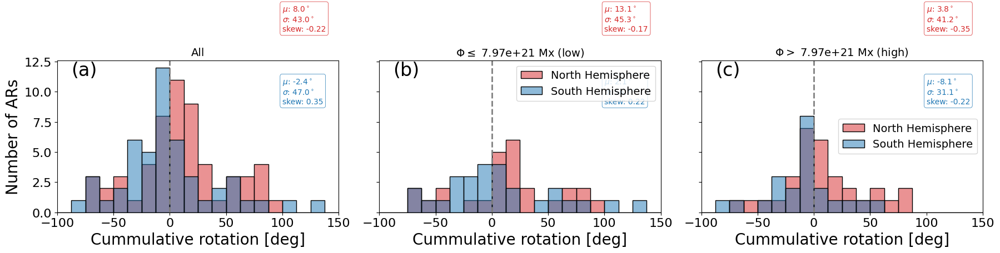

In [ ]:
'''
plot of cumulative rotation for all ARs, and for low and high flux subsets.
Histograms comparing the cumulative rotation calculated using the modeled alpha and barycenter alpha methods.
The cumulative rotation is calculated at the time of maximum flux (t_mean=1).

'''


f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)

mod='Bayes'

db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([db,db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):

    dbb=pd.melt(db1,value_vars=['rot_cum','rotb_cum'],id_vars='lat')
    dbb['variable']=dbb['variable'].replace({'rot_cum': 'Bayes', 'rotb_cum': 'Barycenters'})
    dbb=dbb[dbb.variable==mod]

    g=sns.histplot(data=dbb[dbb.lat>0],x='value',ax=ax1,binrange=(-100,150),bins=20,color='tab:red',label='North Hemisphere',alpha=0.5)
    g=sns.histplot(data=dbb[dbb.lat<0],x='value',ax=ax1,binrange=(-100,150),bins=20,color='tab:blue',label='South Hemisphere',alpha=0.5)

    #g=sns.kdeplot(data=dbb[dbb.lat>0],x='value',hue='variable',ax=ax1)

    #g=sns.histplot(data=dbb[dbb.lat<0],x='value',hue='variable',ax=ax1,binrange=(-100,150),bins=20)

    #sns.move_legend(g, "upper right", title='',fontsize=12)
    ax1.set_xlabel(r'Cummulative rotation [deg]',fontsize=20)
    ax1.set_ylabel('Number of ARs',fontsize=20)
    ax1.tick_params(axis='both', which='major', labelsize=16)
    ax1.set_title(title)
    ax1.set_xlim(-100,150)
    #ax1.legend().remove()
    #ax1.legend(title='',fontsize=12)

    ax1.axvline(0,color='gray',linestyle='--',linewidth=2)

    #dbx=db1[db1['rot_cum'].between(-100,150) | db1['rotb_cum'].between(-100,150)]

    ax1.text(100,15,f'$\mu$: {dbb[dbb.lat>0].value.mean():.1f}$^\circ$\n$\sigma$: {dbb[dbb.lat>0].value.std():.1f}$^\circ$\nskew: {dbb[dbb.lat>0].value.skew():.2f}',
            color='tab:red',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:red',boxstyle="round"))
    ax1.text(100,9,f'$\mu$: {dbb[dbb.lat<0].value.mean():.1f}$^\circ$\n$\sigma$: {dbb[dbb.lat<0].value.std():.1f}$^\circ$\nskew: {dbb[dbb.lat<0].value.skew():.2f}',
            color='tab:blue',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:blue',boxstyle="round"))

ax[1].legend()
ax[2].legend()

for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.tight_layout()



f.savefig('../figures/hist_cumrot.pdf',dpi=300)

<>:47: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:50: SyntaxWarning: invalid escape sequence '\m'
<>:50: SyntaxWarning: invalid escape sequence '\c'
<>:50: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:47: SyntaxWarning: invalid escape sequence '\c'
<>:50: SyntaxWarning: invalid escape sequence '\m'
<>:50: SyntaxWarning: invalid escape sequence '\c'
<>:50: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_231/1756762268.py:47: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(20,9,f'$\mu$: {dbb[dbb.value>0].lat.mean():.1f}$^\circ$\n$\sigma$: {dbb[dbb.value>0].lat.std():.1f}$^\circ$\nskew: {dbb[dbb.value>0].lat.skew():.2f}',
/tmp/ipykernel_231/1756762268.py:47: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(20,9,f'$\mu$: {dbb[dbb.value>0].lat.mean():.1f}$^\cir

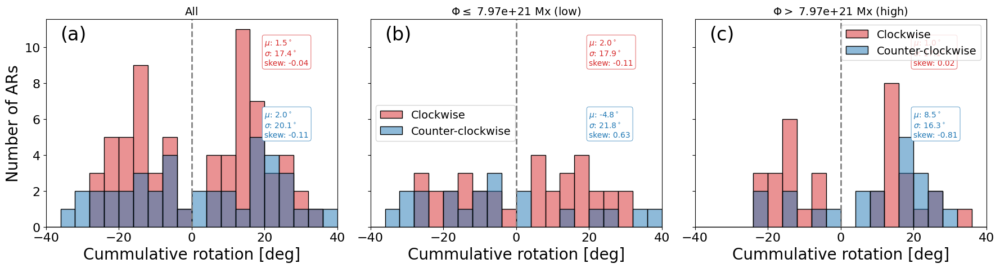

In [ ]:
'''
plot of cumulative rotation for all ARs, and for low and high flux subsets.
Histograms comparing the cumulative rotation calculated using the modeled alpha and barycenter alpha methods.
The cumulative rotation is calculated at the time of maximum flux (t_mean=1).

'''


f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)

mod='Bayes'

db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([db,db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):

    dbb=pd.melt(db1,value_vars=['rot_cum','rotb_cum'],id_vars='lat')
    dbb['variable']=dbb['variable'].replace({'rot_cum': 'Bayes', 'rotb_cum': 'Barycenters'})
    dbb=dbb[dbb.variable==mod]
    dbb['value']=dbb['value']*np.sign(dbb['lat'])

    g=sns.histplot(data=dbb[dbb.value>0],x='lat',ax=ax1,binrange=(-40,40),bins=20,color='tab:red',label='Clockwise',alpha=0.5)
    g=sns.histplot(data=dbb[dbb.value<0],x='lat',ax=ax1,binrange=(-40,40),bins=20,color='tab:blue',label='Counter-clockwise',alpha=0.5)

    #g=sns.kdeplot(data=dbb[dbb.lat>0],x='value',hue='variable',ax=ax1)

    #g=sns.histplot(data=dbb[dbb.lat<0],x='value',hue='variable',ax=ax1,binrange=(-100,150),bins=20)

    #sns.move_legend(g, "upper right", title='',fontsize=12)
    ax1.set_xlabel(r'Cummulative rotation [deg]',fontsize=20)
    ax1.set_ylabel('Number of ARs',fontsize=20)
    ax1.tick_params(axis='both', which='major', labelsize=16)
    ax1.set_title(title)
    ax1.set_xlim(-40,40)
    #ax1.legend().remove()
    #ax1.legend(title='',fontsize=12)

    ax1.axvline(0,color='gray',linestyle='--',linewidth=2)

    #dbx=db1[db1['rot_cum'].between(-100,150) | db1['rotb_cum'].between(-100,150)]

    ax1.text(20,9,f'$\mu$: {dbb[dbb.value>0].lat.mean():.1f}$^\circ$\n$\sigma$: {dbb[dbb.value>0].lat.std():.1f}$^\circ$\nskew: {dbb[dbb.value>0].lat.skew():.2f}',
            color='tab:red',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:red',boxstyle="round"))
    ax1.text(20,5,f'$\mu$: {dbb[dbb.value<0].lat.mean():.1f}$^\circ$\n$\sigma$: {dbb[dbb.value<0].lat.std():.1f}$^\circ$\nskew: {dbb[dbb.value<0].lat.skew():.2f}',
            color='tab:blue',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:blue',boxstyle="round"))

ax[1].legend()
ax[2].legend()

for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.tight_layout()



f.savefig('../figures/hist_cumrot.pdf',dpi=300)

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_888/1457600329.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(50,10,f'$\mu$: {np.mean(rn):.1f}$^\circ$\n$\sigma$: {np.std(rn):.1f}$^\circ$\nskew: {skew(rn):.2f}',
/tmp/ipykernel_888/1457600329.py:29: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(50,10,f'$\mu$: {np.mean(rn):.1f}$^\circ$\n$\sigma$: {np.std(rn):.1f}$^\circ$\nskew: {skew(rn):.2f}',
/t

North hemisphere: 63.1578947368421 36.8421052631579
South hemisphere: 61.224489795918366 38.775510204081634
North hemisphere: 61.40350877192982 38.59649122807018
South hemisphere: 55.10204081632653 44.89795918367347


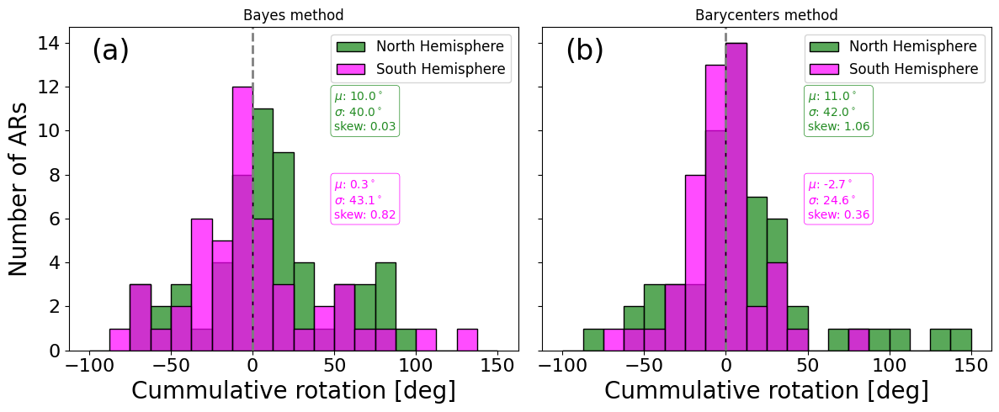

In [ ]:

f,ax=plt.subplots(1,2,figsize=(12,5),sharey=True,sharex=True)

from scipy.stats import skew

cc1='forestgreen'
cc2='magenta'
db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()


for ax1,var,met in zip(ax,['rot_cum','rotb_cum'],['Bayes','Barycenters']):
  rn=db[(db.lat>0) & (db[var].between(-100,150))][var].values
  rs=db[(db.lat<0) & (db[var].between(-100,150))][var].values

  print('North hemisphere:',100*np.sum(rn>0)/len(rn),100*np.sum(rn<0)/len(rn))

  print('South hemisphere:',100*np.sum(rs<0)/len(rs),100*np.sum(rs>0)/len(rs))

  sns.histplot(rn,ax=ax1,binrange=(-100,150),bins=20,color=cc1,label='North Hemisphere')
  sns.histplot(rs,ax=ax1,binrange=(-100,150),bins=20,color=cc2,label='South Hemisphere',alpha=0.7)

  #sns.move_legend(g, "upper right", title='',fontsize=12)
  ax1.set_xlabel(r'Cummulative rotation [deg]',fontsize=20)
  ax1.set_ylabel('Number of ARs',fontsize=20)
  ax1.tick_params(axis='both', which='major', labelsize=16)
  ax1.set_title(f'{met} method')
  #ax1.legend().remove()
  ax1.legend(fontsize=12)

  ax1.text(50,10,f'$\mu$: {np.mean(rn):.1f}$^\circ$\n$\sigma$: {np.std(rn):.1f}$^\circ$\nskew: {skew(rn):.2f}',
          color=cc1,fontsize=10,
          bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor=cc1,boxstyle="round"))
  ax1.text(50,6,f'$\mu$: {np.mean(rs):.1f}$^\circ$\n$\sigma$: {np.std(rs):.1f}$^\circ$\nskew: {skew(rs):.2f}',
          color=cc2,fontsize=10,
          bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor=cc2,boxstyle="round"))

  ax1.axvline(0,color='gray',linestyle='--',linewidth=2)
f.tight_layout()


for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.show()




<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:29: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_888/22888981.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(1,10,f'$\mu$: {np.mean(rn):.1f}$^\circ$\n$\sigma$: {np.std(rn):.1f}$^\circ$\nskew: {skew(rn):.2f}',
/tmp/ipykernel_888/22888981.py:29: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(1,10,f'$\mu$: {np.mean(rn):.1f}$^\circ$\n$\sigma$: {np.std(rn):.1f}$^\circ$\nskew: {skew(rn):.2f}',
/tmp/ipy

North hemisphere: 53.44827586206897 46.55172413793103
South hemisphere: 64.0 36.0
North hemisphere: 56.89655172413793 43.10344827586207
South hemisphere: 48.0 52.0


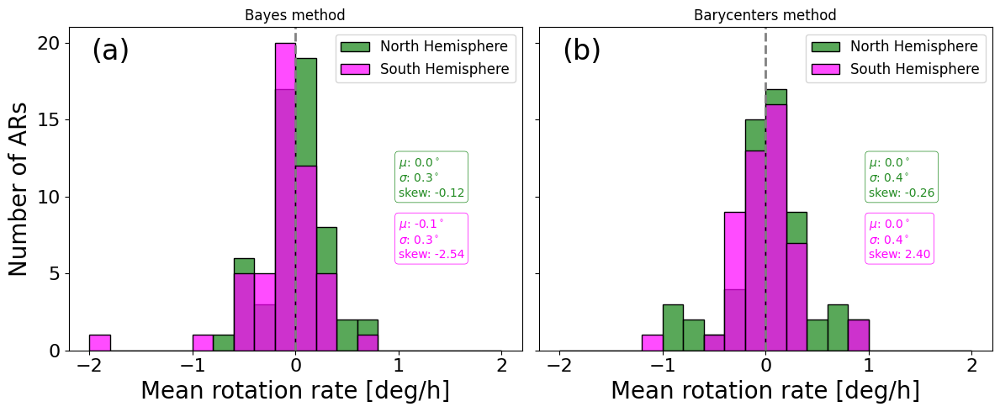

In [ ]:
f,ax=plt.subplots(1,2,figsize=(12,5),sharey=True,sharex=True)

from scipy.stats import skew

cc1='forestgreen'
cc2='magenta'
db=DFx2[DFx2.t_mean<=1].groupby('AR').mean().reset_index()


for ax1,var,met in zip(ax,['rot','rotb'],['Bayes','Barycenters']):
  rn=db[(db.lat>0) & (db[var].between(-3,3))][var].values
  rs=db[(db.lat<0) & (db[var].between(-3,3))][var].values

  print('North hemisphere:',100*np.sum(rn>0)/len(rn),100*np.sum(rn<0)/len(rn))

  print('South hemisphere:',100*np.sum(rs<0)/len(rs),100*np.sum(rs>0)/len(rs))

  sns.histplot(rn,ax=ax1,binrange=(-2,2),bins=20,color=cc1,label='North Hemisphere')
  sns.histplot(rs,ax=ax1,binrange=(-2,2),bins=20,color=cc2,label='South Hemisphere',alpha=0.7)

  #sns.move_legend(g, "upper right", title='',fontsize=12)
  ax1.set_xlabel(r'Mean rotation rate [deg/h]',fontsize=20)
  ax1.set_ylabel('Number of ARs',fontsize=20)
  ax1.tick_params(axis='both', which='major', labelsize=16)
  ax1.set_title(f'{met} method')
  #ax1.legend().remove()
  ax1.legend(fontsize=12)

  ax1.text(1,10,f'$\mu$: {np.mean(rn):.1f}$^\circ$\n$\sigma$: {np.std(rn):.1f}$^\circ$\nskew: {skew(rn):.2f}',
          color=cc1,fontsize=10,
          bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor=cc1,boxstyle="round"))
  ax1.text(1,6,f'$\mu$: {np.mean(rs):.1f}$^\circ$\n$\sigma$: {np.std(rs):.1f}$^\circ$\nskew: {skew(rs):.2f}',
          color=cc2,fontsize=10,
          bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor=cc2,boxstyle="round"))

  ax1.axvline(0,color='gray',linestyle='--',linewidth=2)
f.tight_layout()


for i,ax1 in enumerate(ax):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.show()

In [ ]:
len(rn)

58

In [ ]:
rn.rot_cum

AttributeError: 'Series' object has no attribute 'rot_cum'

<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\c'
<>:51: SyntaxWarning: invalid escape sequence '\c'
<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:54: SyntaxWarning: invalid escape sequence '\c'
<>:54: SyntaxWarning: invalid escape sequence '\c'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\c'
<>:51: SyntaxWarning: invalid escape sequence '\c'
<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:54: SyntaxWarning: invalid escape sequence '\c'
<>:54: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_343005/2445005860.py:51: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(100,15,f'$\mu$: {db1.frac_rot.mean():.1f}$^\circ$\n$\sigma$: {db1.frac_rot.std():.1f}$^\circ$\nskew: {db1.frac_rot.skew():.2f}',
/tmp/ipykernel_343005/2445005860.py:51: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(100,15,f'$\mu$: {db1.frac_rot.mean():.1f}$^\circ$\n$\sigma$: {db1.fra

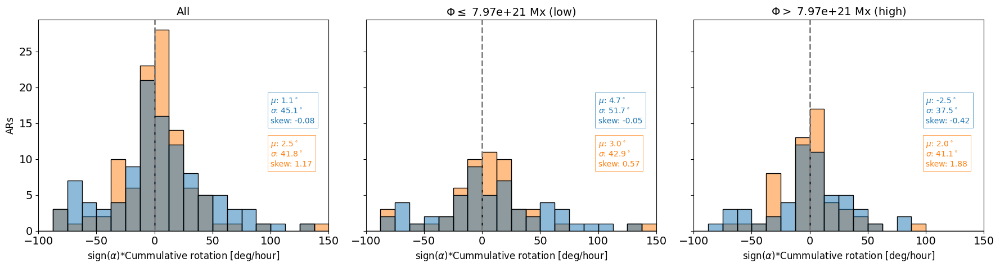

In [ ]:
'''
Este plot muestra histogramas de la rotación acumulada (gamma)
en el momento del flujo magnético máximo de las regiones activas (ARs).
Se divide en tres subplots: todos los ARs, ARs con flujo bajo y ARs con flujo alto.
Se calculan estadísticas como la media, desviación estándar y sesgo
para cada grupo y se muestran en el gráfico. Los valores extremos fuera del rango
de -200 a 200 se excluyen para una mejor visualización, ya que estos provienen de ARs
con valores muy pequeños de tilt al final de la emergencia que generan fracciones muy grandes.
'''


f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)



db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

db['frac_rot'] = np.sign(db['alpha'])*db['rot_cum']
db['frac_rotb'] = np.sign(db['alphab'])*db['rotb_cum']

# Crear máscaras para valores entre -5 y 5
mask_rot = (db['frac_rot'].between(-200, 200))
mask_rotb = (db['frac_rotb'].between(-200, 200))

# Aplicar las máscaras y reemplazar valores fuera del rango con NaN
db.loc[~mask_rot, 'frac_rot'] = np.nan
db.loc[~mask_rotb, 'frac_rotb'] = np.nan

# Alternativamente, si quieres mantener solo las filas que cumplen ambas condiciones:
db = db[mask_rot & mask_rotb]

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([db,db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):
    sns.histplot(data=pd.melt(db1,
                            value_vars=['frac_rot','frac_rotb']),x='value',hue='variable',fill=True,ax=ax1,bins=20,binrange=(-100,150))

    ax1.set_xlabel(r'sign($\alpha$)*Cummulative rotation [deg/hour]')
    ax1.set_ylabel('ARs')
    ax1.set_title(title)
    ax1.set_xlim(-100,150)
    ax1.legend().remove()


    #ax1.legend(title='',labels=['Bayes','Barycenters'],fontsize=12)
    ax1.axvline(0,color='gray',linestyle='--',linewidth=2)

    ax1.text(100,15,f'$\mu$: {db1.frac_rot.mean():.1f}$^\circ$\n$\sigma$: {db1.frac_rot.std():.1f}$^\circ$\nskew: {db1.frac_rot.skew():.2f}',
            color='tab:blue',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:blue'))
    ax1.text(100,9,f'$\mu$: {db1.frac_rotb.mean():.1f}$^\circ$\n$\sigma$: {db1.frac_rotb.std():.1f}$^\circ$\nskew: {db1.frac_rotb.skew():.2f}',
            color='tab:orange',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:orange'))

f.tight_layout()
f.savefig('../figures/hist_cumrot2.pdf',dpi=300)


<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\c'
<>:35: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:32: SyntaxWarning: invalid escape sequence '\c'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\c'
<>:35: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_343005/1911394526.py:32: SyntaxWarning: invalid escape sequence '\m'
  ax1.text(100,10,f'$\mu$: {db1.rot_cum.mean():.1f}$^\circ$\n$\sigma$: {db1.rot_cum.std():.1f}$^\circ$\nskew: {db1.rot_cum.skew():.2f}',
/tmp/ipykernel_343005/1911394526.py:32: SyntaxWarning: invalid escape sequence '\c'
  ax1.text(100,10,f'$\mu$: {db1.rot_cum.mean():.1f}$^\circ$\n$\sigma$: {db1.rot_cum

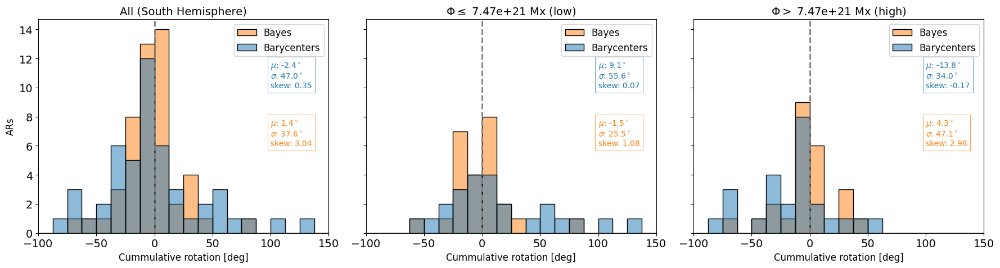

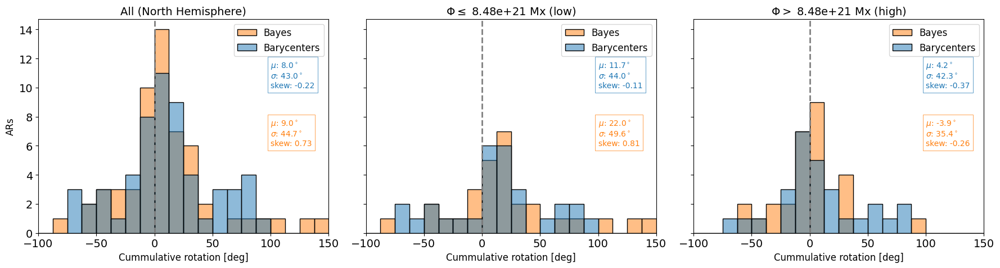

In [ ]:
'''
plot of cumulative rotation for all ARs, and for low and high flux subsets.
Histograms comparing the cumulative rotation calculated using the modeled alpha and barycenter alpha methods.
The cumulative rotation is calculated at the time of maximum flux (t_mean=1).

'''


for a,hem in [(-1,'South Hemisphere'),(1,'North Hemisphere')]:

    f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)
    db=DFx2[(DFx2.t_mean==1) & (DFx2.lat*a > 0)].groupby('AR').mean().reset_index()

    arslowf=db[db.flux <= db.flux.median()].AR.unique()
    arshighf=db[db.flux > db.flux.median()].AR.unique()


    for db1,ax1,title in zip([db,db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,
                            [f'All ({hem})',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):
        sns.histplot(data=pd.melt(db1,
                                value_vars=['rot_cum','rotb_cum']),x='value',hue='variable',fill=True,ax=ax1,binrange=(-100,150),bins=20)

        ax1.set_xlabel(r'Cummulative rotation [deg]')
        ax1.set_ylabel('ARs')
        ax1.set_title(title)
        ax1.set_xlim(-100,150)


        ax1.legend(title='',labels=['Bayes','Barycenters'],fontsize=12)
        ax1.axvline(0,color='gray',linestyle='--',linewidth=2)

        ax1.text(100,10,f'$\mu$: {db1.rot_cum.mean():.1f}$^\circ$\n$\sigma$: {db1.rot_cum.std():.1f}$^\circ$\nskew: {db1.rot_cum.skew():.2f}',
                color='tab:blue',fontsize=10,
                bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:blue'))
        ax1.text(100,6,f'$\mu$: {db1.rotb_cum.mean():.1f}$^\circ$\n$\sigma$: {db1.rotb_cum.std():.1f}$^\circ$\nskew: {db1.rotb_cum.skew():.2f}',
                color='tab:orange',fontsize=10,
                bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:orange'))

    f.tight_layout()
#    f.savefig('../figures/hist_cumrot.pdf',dpi=300)

$\rho_{mod}$: -0.28$
$\rho_{bar}$: -0.49$


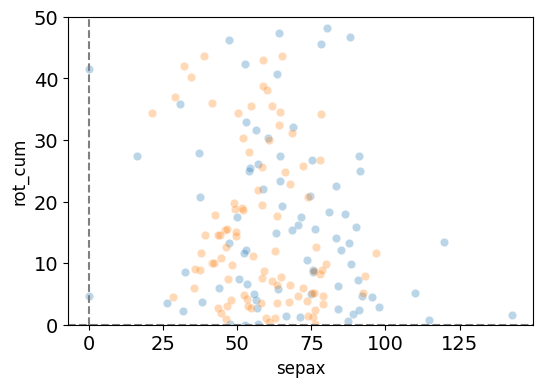

In [ ]:
db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index().abs()

sns.scatterplot(data=db,x='sepax',y='rot_cum',alpha=0.3)
sns.scatterplot(data=db,x='sar',y='rotb_cum',alpha=0.3)

plt.axvline(0,linestyle='--',color='gray')
plt.axhline(0,linestyle='--',color='gray')

plt.ylim(0,50)
print(rf'$\rho_{{mod}}$: {db["rot"].corr(db["sepax"]):.2f}$')
print(rf'$\rho_{{bar}}$: {db["rotb"].corr(db["sar"]):.2f}$')
#plt.text(30,20,rf'$\rho$: {db["alpha"].corr(db["rot"]):.2f}',color='tab:blue')
#plt.text(30,10,rf'$\rho$: {db["alphab"].corr(db["rotb"]):.2f}',color='tab:orange')

(-2.0, 2.0)

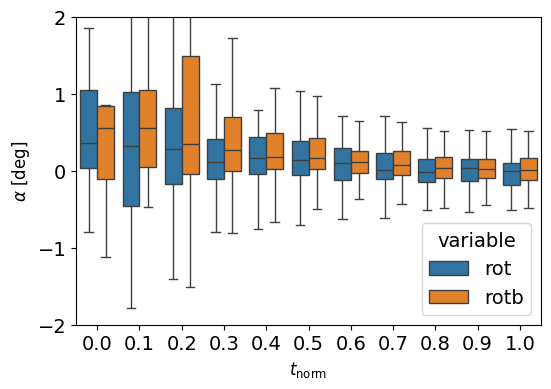

In [ ]:
mdf=pd.melt(DFx2,id_vars=['t_norm','t_mean','lat','AR','mag','flux'],value_vars=['rot','rotb'])
dfm=df.groupby('AR').mean().reset_index()

mdf=mdf[(mdf.t_norm>0) & (mdf.t_norm<1.05)]

arsp1=dfm[dfm.rot_cum>0].AR.values
arsp2=dfm[dfm.rotb_cum>0].AR.values
arsn1=dfm[dfm.rot_cum<0].AR.values
arsn2=dfm[dfm.rotb_cum<0].AR.values

# crear máscaras alineadas con el DataFrame completo
mask_pos_rot  = (mdf['variable']=='rot')  & (mdf['AR'].isin(arsp1))
mask_pos_rotb = (mdf['variable']=='rotb') & (mdf['AR'].isin(arsp2))
mdf_pos = mdf[mask_pos_rot | mask_pos_rotb]

mask_neg_rot  = (mdf['variable']=='rot')  & (mdf['AR'].isin(arsn1))
mask_neg_rotb = (mdf['variable']=='rotb') & (mdf['AR'].isin(arsn2))
mdf_neg = mdf[mask_neg_rot | mask_neg_rotb]

f,ax=plt.subplots()
#sns.lineplot(data=mdf,x='t_mean',y='value',estimator='mean',hue='variable',marker='o',errorbar='sd',err_style='bars')
sns.boxplot(data=mdf_pos,x='t_mean',y='value',hue='variable',ax=ax,fliersize=False)
#sns.boxplot(data=mdf_neg,x='t_mean',y='value',hue='variable',ax=ax,fliersize=False)
ax.set_ylabel(r'$\alpha$ [deg]')
ax.set_xlabel(r'$t_\mathrm{norm}$')
ax.set_ylim(-2,2)

# Joy Plots

In [38]:
import scipy

def theil_sen_ci(x, y, n_boot=1000, ci=95):
    slopes = []
    intercepts = []
    rng = np.random.default_rng()
    for _ in range(n_boot):
        idx = rng.choice(len(x), len(x), replace=True)
        try:
            res = scipy.stats.theilslopes(y[idx], x[idx])
            slopes.append(res[0])
            intercepts.append(res[1])
        except Exception:
            continue
    lower = (100 - ci) / 2
    upper = 100 - lower
    slope_ci = np.percentile(slopes, [lower, upper])
    intercept_ci = np.percentile(intercepts, [lower, upper])
    return np.mean(slopes), np.mean(intercepts), slope_ci, intercept_ci

In [ ]:
# === Crear eje x superior ===
ax_top = ax1.secondary_xaxis(
    "top",
    functions=(
        lambda x: x * (db1.frac.mean() / db1.frac_sin.mean()),
        lambda x: x * (db1.frac_sin.mean() / db1.frac.mean())
    )
)

ax_top.set_xlabel("frac / fracb", fontsize=10)


Text(0.5, 0, 'frac / fracb')

<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\s'
<>:77: SyntaxWarning: invalid escape sequence '\m'
<>:77: SyntaxWarning: invalid escape sequence '\s'
<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\s'
<>:77: SyntaxWarning: invalid escape sequence '\m'
<>:77: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_227/499857058.py:37: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(dbAx.groupby('AR').mean().frac_sin.values)})')
/tmp/ipykernel_227/499857058.py:69: SyntaxWarning: invalid escape sequence '\m'
  f'$\mu$ ={dbAx.groupby('AR').mean().frac_sin.mean():.1f}°\n$\sigma$={dbAx.groupby('AR').mean().frac_sin.std():.1f}°\nSkew={dbAx.groupby('AR').mean().frac_sin.skew():.1f}',
/tmp/ipykernel_227/499857058.py:69: Sy

(-266,317)
(-291,332)


TypeError: 'Axes' object is not callable

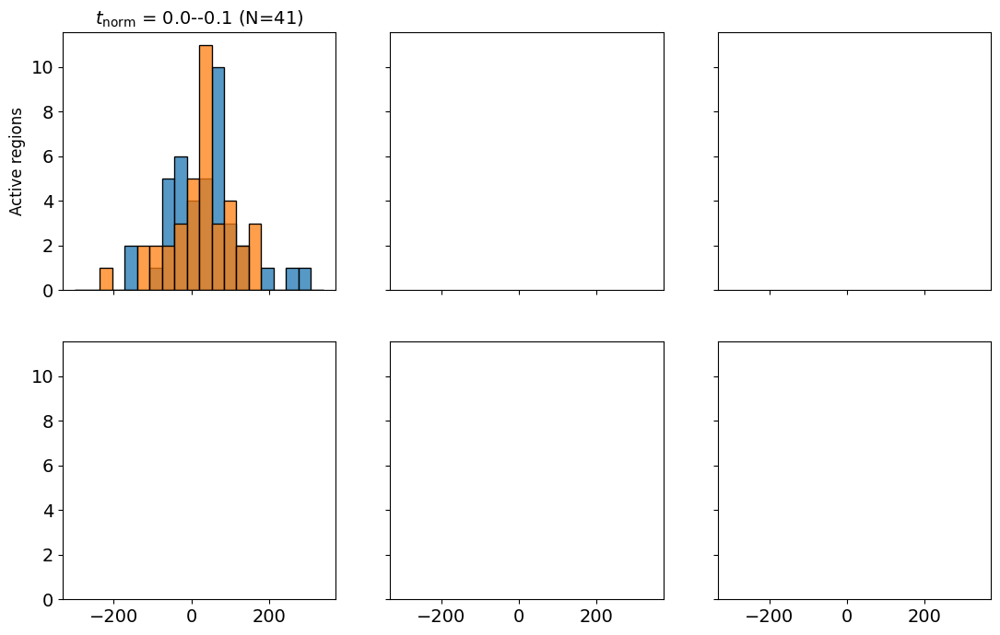

In [39]:
limits=(-300,340)

db=DFx2[DFx2['t_mean'].between(0.8,1.1)]

db['lat']=np.abs(db['lat'])

db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
db1['lat']=np.abs(db1['lat'])
db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))

db1=db1.assign(frac= lambda x: x.alpha/x.lat)
db1=db1.assign(fracb= lambda x: x.alphab/x.lat)


print(f'({db1.frac_sin.mean()-3*db1.frac_sin.std():.0f},{db1.frac_sin.mean()+3*db1.frac_sin.std():.0f})')
print(f'({db1.fracb_sin.mean()-3*db1.fracb_sin.std():.0f},{db1.fracb_sin.mean()+3*db1.fracb_sin.std():.0f})')


dbA=db1[db1['frac_sin'].between(*limits)]
dbB=db1[db1['fracb_sin'].between(*limits)]

#dbA=db1
#dbB=db1

f,ax=plt.subplots(2,3,figsize=(13,8),sharey=True,sharex=True)

for (i,tt),ax1 in zip(enumerate(np.sort(dbA.t_mean.unique())[::2]),ax.flatten()):


  dbAx=dbA[dbA['t_mean'].between(tt,tt+0.1)]
  dbBx=dbB[dbB['t_mean'].between(tt,tt+0.1)]

  sns.histplot(data=dbAx.groupby('AR').mean(),x='frac_sin',ax=ax1,bins=20,label='Bayes',binrange=limits)
  sns.histplot(data=dbBx.groupby('AR').mean(),x='fracb_sin',ax=ax1,bins=20,label='Barycenters',binrange=limits)

  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(dbAx.groupby('AR').mean().frac_sin.values)})')
  ax1.set_xlabel(r'$\alpha / \sin{|\theta|}$ [deg]',fontsize=12)
  ax1.set_ylabel(f'Active regions',fontsize=12)

  ax1.errorbar(g1(0.56),40,xerr=g1(0.01),fmt='o',color='tab:green',label='Stenflo & Kosovichev (2012)')
  ax1.errorbar(dbAx.groupby('AR').mean()['frac_sin'].mean(),50,xerr=dbAx.groupby('AR').mean()['frac_sin'].std()/np.sqrt(len(dbAx.groupby('AR').mean()['frac_sin'].values)),fmt='o',color='tab:blue')
  ax1.errorbar(dbBx.groupby('AR').mean()['fracb_sin'].mean(),45,
               xerr=dbBx.groupby('AR').mean()['fracb_sin'].std()/np.sqrt(len(dbBx.groupby('AR').mean()['fracb_sin'].values)),fmt='o',color='tab:orange')
  ax1.errorbar(g1(0.5),35,xerr=g1(0.2),fmt='o',color='tab:red',label='Li & Ulrich (2012)')
  ax1.errorbar(g1(0.53),30,xerr=g1(0.01),fmt='o',color='tab:purple',label='Tlatova et al. (2018)')


  #ax1.axvline(32.1,linestyle='--',linewidth=2,label='Stenflo & Kosovichev (2012)',color='tab:green')
  #ax1.axvline(0,linestyle='--',linewidth=2,color='gray')
  #ax1.axvline(dbA[dbA['t_mean'].between(tt,tt+0.1)]['frac_sin'].mean(),linestyle='--',linewidth=2,color='tab:blue')
  #ax1.axvline(dbB[dbB['t_mean'].between(tt,tt+0.1)]['fracb_sin'].mean(),linestyle='--',linewidth=2,color='tab:orange')
  f1 = lambda x: x * (dbB.fracb.mean() / dbB.fracb_sin.mean())      # primary → secondary
  g1 = lambda u: u * (dbB.fracb_sin.mean() / dbB.fracb.mean())      # secondary → primary
  # === Nuevo eje superior ===
  ax_top = ax1.secondary_xaxis(
      "top",
      functions=(
          f1,
          g1)
      )

  ax_top.set_xlabel(r'$\alpha / |\theta|$', fontsize=10)

#  ax1.axvline(g1(0.5),linestyle='--',linewidth=2,label='Li & Ulrich (2012)',color='tab:red')

  ax1.text(
    0.65, 0.51,
    f'$\mu$ ={dbAx.groupby('AR').mean().frac_sin.mean():.1f}°\n$\sigma$={dbAx.groupby('AR').mean().frac_sin.std():.1f}°\nSkew={dbAx.groupby('AR').mean().frac_sin.skew():.1f}',
    color='tab:blue',
    transform=ax1.transAxes,
    fontsize=10,
    bbox=dict(boxstyle="round", alpha=0.2, color='tab:blue')
    )
  ax1.text(
    0.65, 0.28,
    f'$\mu$ ={dbBx.groupby('AR').mean().fracb_sin.mean():.1f}°\n$\sigma$={dbBx.groupby('AR').mean().fracb_sin.std():.1f}°\nSkew={dbBx.groupby('AR').mean().fracb_sin.skew():.1f}',
    color='tab:orange',
    transform=ax1.transAxes,
    fontsize=10,
    bbox=dict(boxstyle="round", alpha=0.2, color='tab:orange')
    )

  ax1.text(0.05,0.85,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=22)

ax[0,0].legend()
f.tight_layout()

print(f'{dbA.frac_sin.mean():.1f},{dbA.frac_sin.std():.1f},{dbA.frac_sin.skew():.1f}')
print(f'{dbB.fracb_sin.mean():.1f},{dbB.fracb_sin.std():.1f},{dbB.fracb_sin.skew():.1f}')

f.savefig('../figures/hist_sin_alpha.pdf',dpi=300)




In [ ]:
np.sort(dbA.t_mean.unique())[::2]

array([0. , 0.2, 0.4, 0.6, 0.8, 1. ])

<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:121: SyntaxWarning: invalid escape sequence '\m'
<>:121: SyntaxWarning: invalid escape sequence '\s'
<>:129: SyntaxWarning: invalid escape sequence '\m'
<>:129: SyntaxWarning: invalid escape sequence '\s'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:121: SyntaxWarning: invalid escape sequence '\m'
<>:121: SyntaxWarning: invalid escape sequence '\s'
<>:129: SyntaxWarning: invalid escape sequence '\m'
<>:129: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_227/5137210.py:52: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(data_A)})',fontsize=18)
/tmp/ipykernel_227/5137210.py:121: SyntaxWarning: invalid escape sequence '\m'
  f'$\mu$ ={data_A.mean():.1f}° ({mean_A:.1f}°)\n$\sigma$={data_A.std():.1f}° ({np.abs(std_A):.1f}°)\nSkew={data_A.skew():.1f}',
/tmp/ipykernel_227/5137210.py:121: SyntaxWarning: invalid escape sequence '\s'
  f'$\mu$ ={data_A.mea

(-266,317)
(-291,332)
24.4,73.6,-0.3
21.6,74.9,-0.2


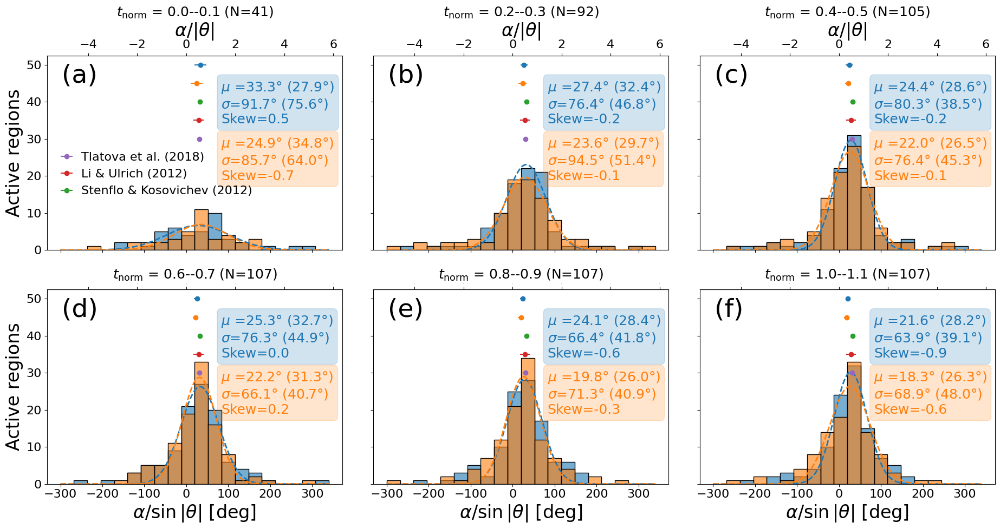

In [40]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

limits=(-300,340)

db=DFx2[DFx2['t_mean'].between(0.8,1.1)]
db['lat']=np.abs(db['lat'])

db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
db1['lat']=np.abs(db1['lat'])
db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))

db1=db1.assign(frac= lambda x: x.alpha/x.lat)
db1=db1.assign(fracb= lambda x: x.alphab/x.lat)

print(f'({db1.frac_sin.mean()-3*db1.frac_sin.std():.0f},{db1.frac_sin.mean()+3*db1.frac_sin.std():.0f})')
print(f'({db1.fracb_sin.mean()-3*db1.fracb_sin.std():.0f},{db1.fracb_sin.mean()+3*db1.fracb_sin.std():.0f})')

dbA=db1[db1['frac_sin'].between(*limits)]
dbB=db1[db1['fracb_sin'].between(*limits)]

# Define Gaussian function
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-((x - mean) / stddev) ** 2 / 2)

f,ax=plt.subplots(2,3,figsize=(19,10),sharey=True,sharex=True)

for (i,tt),ax1 in zip(enumerate(np.sort(dbA.t_mean.unique())[::2]),ax.flatten()):
    dbAx=dbA[dbA['t_mean'].between(tt,tt+0.1)]
    dbBx=dbB[dbB['t_mean'].between(tt,tt+0.1)]

    # Get data for fitting
    data_A = dbAx.groupby('AR').mean()['frac_sin'].dropna()
    data_B = dbBx.groupby('AR').mean()['fracb_sin'].dropna()

    # Create histograms to fit
    hist_A, bin_edges_A = np.histogram(data_A, bins=20, range=limits)
    hist_B, bin_edges_B = np.histogram(data_B, bins=20, range=limits)

    # Calculate bin centers
    bin_centers_A = (bin_edges_A[:-1] + bin_edges_A[1:]) / 2
    bin_centers_B = (bin_edges_B[:-1] + bin_edges_B[1:]) / 2

    # Plot histograms
    sns.histplot(data=dbAx.groupby('AR').mean(), x='frac_sin', ax=ax1, bins=20,
                 label='Bayes', binrange=limits, alpha=0.6, color='tab:blue')
    sns.histplot(data=dbBx.groupby('AR').mean(), x='fracb_sin', ax=ax1, bins=20,
                 label='Barycenters', binrange=limits, alpha=0.6, color='tab:orange')

    ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(data_A)})',fontsize=18)
    ax1.set_xlabel(r'$\alpha / \sin{|\theta|}$ [deg]',fontsize=24)
    ax1.set_ylabel(f'Active regions',fontsize=24)
    ax1.tick_params(axis='both', which='major', labelsize=16)

    # Perform Gaussian fits
    try:
        # Fit for frac_sin (Bayes)
        p0_A = [max(hist_A)/max(bin_centers_A), data_A.mean(), data_A.std()]
        popt_A, pcov_A = curve_fit(gaussian, bin_centers_A, hist_A/max(hist_A), p0=p0_A[:3])

        # Create smooth curve for plotting
        x_fit_A = np.linspace(limits[0], limits[1], 200)
        y_fit_A = gaussian(x_fit_A, *popt_A) * max(hist_A)

        # Plot Gaussian fit for frac_sin
        ax1.plot(x_fit_A, y_fit_A, 'tab:blue', linewidth=2,linestyle='--', label='Gauss fit (Bayes)')

        # Store fit parameters for annotation
        amp_A, mean_A, std_A = popt_A
        amp_A = amp_A * max(hist_A)  # Scale back amplitude
    except:
        mean_A, std_A = np.nan, np.nan
        print(f"Gaussian fit failed for Bayes panel {i}")

    try:
        # Fit for fracb_sin (Barycenters)
        p0_B = [max(hist_B)/max(bin_centers_B), data_B.mean(), data_B.std()]
        popt_B, pcov_B = curve_fit(gaussian, bin_centers_B, hist_B/max(hist_B), p0=p0_B[:3])

        # Create smooth curve for plotting
        x_fit_B = np.linspace(limits[0], limits[1], 200)
        y_fit_B = gaussian(x_fit_B, *popt_B) * max(hist_B)

        # Plot Gaussian fit for fracb_sin
        ax1.plot(x_fit_B, y_fit_B, 'tab:orange', linewidth=2, linestyle='--', label='Gauss fit (Bary)')

        # Store fit parameters for annotation
        amp_B, mean_B, std_B = popt_B
        amp_B = amp_B * max(hist_B)  # Scale back amplitude
    except:
        mean_B, std_B = np.nan, np.nan
        print(f"Gaussian fit failed for Barycenters panel {i}")

    f1 = lambda x: x * (dbB.fracb.mean() / dbB.fracb_sin.mean())
    g1 = lambda u: u * (dbB.fracb_sin.mean() / dbB.fracb.mean())

    ax1.errorbar(g1(0.56),40,xerr=g1(0.01),fmt='o',color='tab:green',label='Stenflo & Kosovichev (2012)')
    ax1.errorbar(dbAx.groupby('AR').mean()['frac_sin'].mean(),50,
                 xerr=dbAx.groupby('AR').mean()['frac_sin'].std()/np.sqrt(len(data_A)),
                 fmt='o',color='tab:blue')
    ax1.errorbar(dbBx.groupby('AR').mean()['fracb_sin'].mean(),45,
                 xerr=dbBx.groupby('AR').mean()['fracb_sin'].std()/np.sqrt(len(data_B)),
                 fmt='o',color='tab:orange')
    ax1.errorbar(g1(0.5),35,xerr=g1(0.2),fmt='o',color='tab:red',label='Li & Ulrich (2012)')
    ax1.errorbar(g1(0.53),30,xerr=g1(0.01),fmt='o',color='tab:purple',label='Tlatova et al. (2018)')



    ax_top = ax1.secondary_xaxis("top", functions=(f1, g1))
    if i <3:
      ax_top.set_xlabel(r'$\alpha / |\theta|$', fontsize=24)
      ax_top.tick_params(axis='both', which='major', labelsize=16)
    else:
      ax_top.tick_params(axis='both', which='major', labelsize=0)

    # Update annotations with Gaussian fit parameters
    ax1.text(
        0.59, 0.65,
        f'$\mu$ ={data_A.mean():.1f}° ({mean_A:.1f}°)\n$\sigma$={data_A.std():.1f}° ({np.abs(std_A):.1f}°)\nSkew={data_A.skew():.1f}',
        color='tab:blue',
        transform=ax1.transAxes,
        fontsize=18,
        bbox=dict(boxstyle="round", alpha=0.2, color='tab:blue')
    )
    ax1.text(
        0.59, 0.36,
        f'$\mu$ ={data_B.mean():.1f}° ({mean_B:.1f}°)\n$\sigma$={data_B.std():.1f}° ({np.abs(std_B):.1f}°)\nSkew={data_B.skew():.1f}',
        color='tab:orange',
        transform=ax1.transAxes,
        fontsize=18,
        bbox=dict(boxstyle="round", alpha=0.2, color='tab:orange')
    )


    ax1.text(0.05,0.86,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=34)


h,l=ax[0,0].get_legend_handles_labels()
ax[0,0].legend(h[:3:-1],l[:3:-1],loc=(0.01,0.25),fontsize=16,framealpha=0.0,handletextpad=0.2)


f.tight_layout()

print(f'{dbA.frac_sin.mean():.1f},{dbA.frac_sin.std():.1f},{dbA.frac_sin.skew():.1f}')
print(f'{dbB.fracb_sin.mean():.1f},{dbB.fracb_sin.std():.1f},{dbB.fracb_sin.skew():.1f}')

f.savefig('../figures/hist_sin_alpha.pdf',dpi=300)

<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:123: SyntaxWarning: invalid escape sequence '\m'
<>:123: SyntaxWarning: invalid escape sequence '\s'
<>:131: SyntaxWarning: invalid escape sequence '\m'
<>:131: SyntaxWarning: invalid escape sequence '\s'
<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:123: SyntaxWarning: invalid escape sequence '\m'
<>:123: SyntaxWarning: invalid escape sequence '\s'
<>:131: SyntaxWarning: invalid escape sequence '\m'
<>:131: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_227/2016083796.py:54: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(data_A)})',fontsize=ff-4)
/tmp/ipykernel_227/2016083796.py:123: SyntaxWarning: invalid escape sequence '\m'
  f'$\mu$ ={data_A.mean():.1f}° ({mean_A:.1f}°)\n$\sigma$={data_A.std():.1f}° ({np.abs(std_A):.1f}°)\nSkew={data_A.skew():.1f}',
/tmp/ipykernel_227/2016083796.py:123: SyntaxWarning: invalid escape sequence '\s'
  f'$\mu$ =

(-266,317)
(-291,332)
24.4,73.6,-0.3
21.6,74.9,-0.2


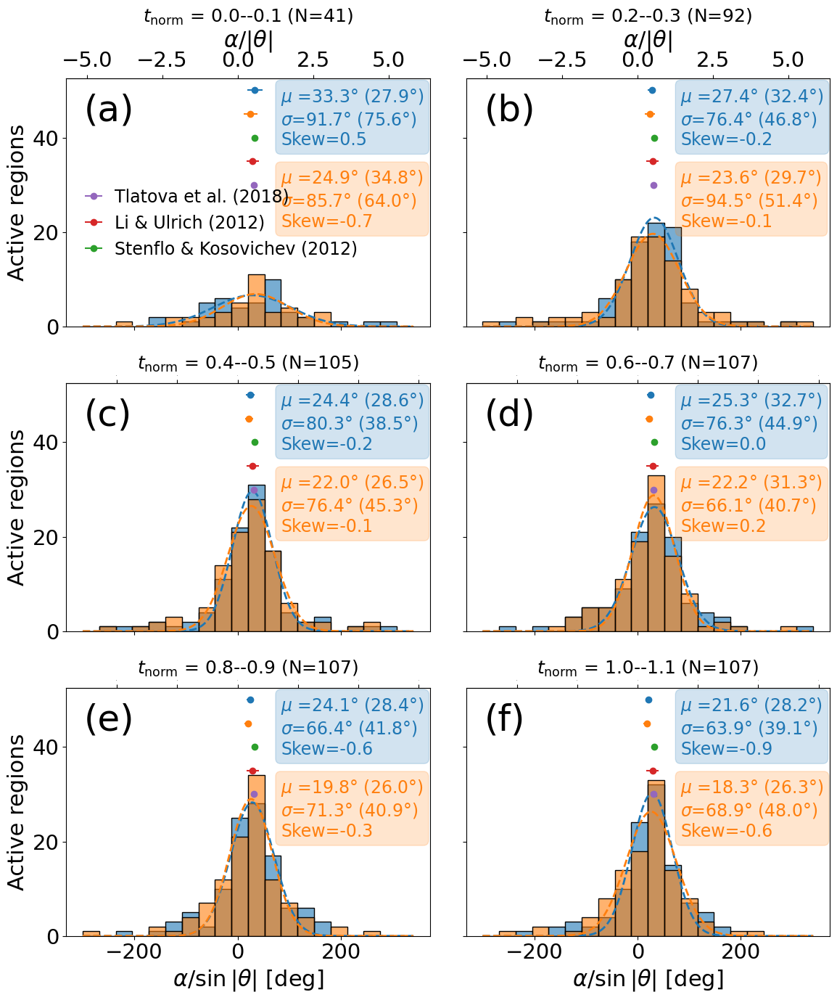

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

limits=(-300,340)

db=DFx2[DFx2['t_mean'].between(0.8,1.1)]
db['lat']=np.abs(db['lat'])

db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
db1['lat']=np.abs(db1['lat'])
db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))

db1=db1.assign(frac= lambda x: x.alpha/x.lat)
db1=db1.assign(fracb= lambda x: x.alphab/x.lat)

print(f'({db1.frac_sin.mean()-3*db1.frac_sin.std():.0f},{db1.frac_sin.mean()+3*db1.frac_sin.std():.0f})')
print(f'({db1.fracb_sin.mean()-3*db1.fracb_sin.std():.0f},{db1.fracb_sin.mean()+3*db1.fracb_sin.std():.0f})')

dbA=db1[db1['frac_sin'].between(*limits)]
dbB=db1[db1['fracb_sin'].between(*limits)]

# Define Gaussian function
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-((x - mean) / stddev) ** 2 / 2)

#f,ax=plt.subplots(2,3,figsize=(19,10),sharey=True,sharex=True)
ff=22

f,ax=plt.subplots(3,2,figsize=(12,14),sharex=True,sharey=True)
for (i,tt),ax1 in zip(enumerate(np.sort(dbA.t_mean.unique())[::2]),ax.flatten()):
    dbAx=dbA[dbA['t_mean'].between(tt,tt+0.1)]
    dbBx=dbB[dbB['t_mean'].between(tt,tt+0.1)]

    # Get data for fitting
    data_A = dbAx.groupby('AR').mean()['frac_sin'].dropna()
    data_B = dbBx.groupby('AR').mean()['fracb_sin'].dropna()

    # Create histograms to fit
    hist_A, bin_edges_A = np.histogram(data_A, bins=20, range=limits)
    hist_B, bin_edges_B = np.histogram(data_B, bins=20, range=limits)

    # Calculate bin centers
    bin_centers_A = (bin_edges_A[:-1] + bin_edges_A[1:]) / 2
    bin_centers_B = (bin_edges_B[:-1] + bin_edges_B[1:]) / 2

    # Plot histograms
    sns.histplot(data=dbAx.groupby('AR').mean(), x='frac_sin', ax=ax1, bins=20,
                 label='Bayes', binrange=limits, alpha=0.6, color='tab:blue')
    sns.histplot(data=dbBx.groupby('AR').mean(), x='fracb_sin', ax=ax1, bins=20,
                 label='Barycenters', binrange=limits, alpha=0.6, color='tab:orange')

    ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(data_A)})',fontsize=ff-4)
    ax1.set_xlabel(r'$\alpha / \sin{|\theta|}$ [deg]',fontsize=ff)
    ax1.set_ylabel(f'Active regions',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-1)

    # Perform Gaussian fits
    try:
        # Fit for frac_sin (Bayes)
        p0_A = [max(hist_A)/max(bin_centers_A), data_A.mean(), data_A.std()]
        popt_A, pcov_A = curve_fit(gaussian, bin_centers_A, hist_A/max(hist_A), p0=p0_A[:3])

        # Create smooth curve for plotting
        x_fit_A = np.linspace(limits[0], limits[1], 200)
        y_fit_A = gaussian(x_fit_A, *popt_A) * max(hist_A)

        # Plot Gaussian fit for frac_sin
        ax1.plot(x_fit_A, y_fit_A, 'tab:blue', linewidth=2,linestyle='--', label='Gauss fit (Bayes)')

        # Store fit parameters for annotation
        amp_A, mean_A, std_A = popt_A
        amp_A = amp_A * max(hist_A)  # Scale back amplitude
    except:
        mean_A, std_A = np.nan, np.nan
        print(f"Gaussian fit failed for Bayes panel {i}")

    try:
        # Fit for fracb_sin (Barycenters)
        p0_B = [max(hist_B)/max(bin_centers_B), data_B.mean(), data_B.std()]
        popt_B, pcov_B = curve_fit(gaussian, bin_centers_B, hist_B/max(hist_B), p0=p0_B[:3])

        # Create smooth curve for plotting
        x_fit_B = np.linspace(limits[0], limits[1], 200)
        y_fit_B = gaussian(x_fit_B, *popt_B) * max(hist_B)

        # Plot Gaussian fit for fracb_sin
        ax1.plot(x_fit_B, y_fit_B, 'tab:orange', linewidth=2, linestyle='--', label='Gauss fit (Bary)')

        # Store fit parameters for annotation
        amp_B, mean_B, std_B = popt_B
        amp_B = amp_B * max(hist_B)  # Scale back amplitude
    except:
        mean_B, std_B = np.nan, np.nan
        print(f"Gaussian fit failed for Barycenters panel {i}")

    f1 = lambda x: x * (dbB.fracb.mean() / dbB.fracb_sin.mean())
    g1 = lambda u: u * (dbB.fracb_sin.mean() / dbB.fracb.mean())

    ax1.errorbar(g1(0.56),40,xerr=g1(0.01),fmt='o',color='tab:green',label='Stenflo & Kosovichev (2012)')
    ax1.errorbar(dbAx.groupby('AR').mean()['frac_sin'].mean(),50,
                 xerr=dbAx.groupby('AR').mean()['frac_sin'].std()/np.sqrt(len(data_A)),
                 fmt='o',color='tab:blue')
    ax1.errorbar(dbBx.groupby('AR').mean()['fracb_sin'].mean(),45,
                 xerr=dbBx.groupby('AR').mean()['fracb_sin'].std()/np.sqrt(len(data_B)),
                 fmt='o',color='tab:orange')
    ax1.errorbar(g1(0.5),35,xerr=g1(0.2),fmt='o',color='tab:red',label='Li & Ulrich (2012)')
    ax1.errorbar(g1(0.53),30,xerr=g1(0.01),fmt='o',color='tab:purple',label='Tlatova et al. (2018)')



    ax_top = ax1.secondary_xaxis("top", functions=(f1, g1))
    if i <2:
      ax_top.set_xlabel(r'$\alpha / |\theta|$', fontsize=ff)
      ax_top.tick_params(axis='both', which='major', labelsize=ff-1)
    else:
      ax_top.tick_params(axis='both', which='major', labelsize=0)

    # Update annotations with Gaussian fit parameters
    ax1.text(
        0.59, 0.73,
        f'$\mu$ ={data_A.mean():.1f}° ({mean_A:.1f}°)\n$\sigma$={data_A.std():.1f}° ({np.abs(std_A):.1f}°)\nSkew={data_A.skew():.1f}',
        color='tab:blue',
        transform=ax1.transAxes,
        fontsize=ff-5,
        bbox=dict(boxstyle="round", alpha=0.2, color='tab:blue')
    )
    ax1.text(
        0.59, 0.4,
        f'$\mu$ ={data_B.mean():.1f}° ({mean_B:.1f}°)\n$\sigma$={data_B.std():.1f}° ({np.abs(std_B):.1f}°)\nSkew={data_B.skew():.1f}',
        color='tab:orange',
        transform=ax1.transAxes,
        fontsize=ff-5,
        bbox=dict(boxstyle="round", alpha=0.2, color='tab:orange')
    )


    ax1.text(0.05,0.83,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=ff+14)


h,l=ax[0,0].get_legend_handles_labels()
ax[0,0].legend(h[:3:-1],l[:3:-1],loc=(0.01,0.25),fontsize=ff-5,framealpha=0.0,handletextpad=0.2)


f.tight_layout()

print(f'{dbA.frac_sin.mean():.1f},{dbA.frac_sin.std():.1f},{dbA.frac_sin.skew():.1f}')
print(f'{dbB.fracb_sin.mean():.1f},{dbB.fracb_sin.std():.1f},{dbB.fracb_sin.skew():.1f}')

f.savefig('../figures/hist_sin_alpha.pdf',dpi=300)

In [ ]:
dbA[dbA['t_mean'].between(0.,0.1)].frac_sin.std()

76.33359347543242

<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:54: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_1603/1328754448.py:54: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel(f'$t_\mathrm{{norm}}$ interval',fontsize=18)


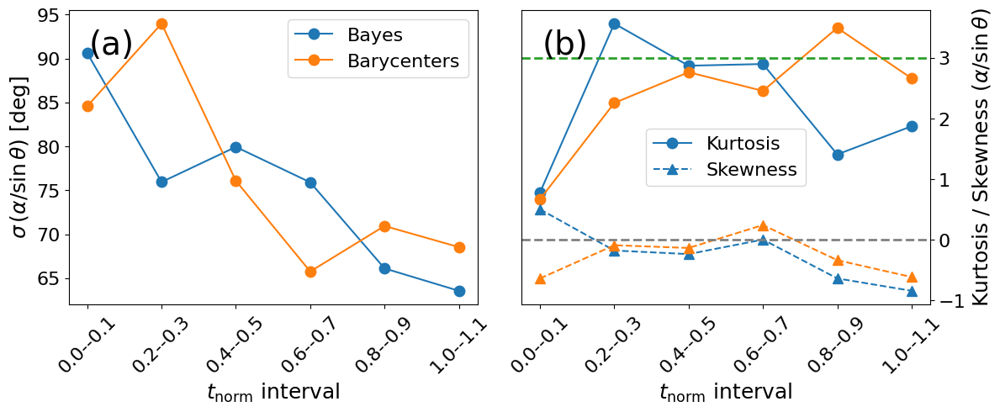

In [ ]:
db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

from scipy.stats import kurtosis,skew

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()
db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
db1['lat']=np.abs(db1['lat'])
db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(frac= lambda x: x.alpha/x.lat)
db1=db1.assign(fracb= lambda x: x.alphab/x.lat)


f,ax=plt.subplots(1,2,figsize=(12,5))
ax=ax.flatten()

std1=[]
std2=[]
time=[]
kur1=[]
kur2=[]
sk1=[]
sk2=[]

dbA=db1[db1['frac_sin'].between(*limits)]
dbB=db1[db1['fracb_sin'].between(*limits)]

for tt in np.sort(dbA.t_mean.unique())[::2]:
  time.append(f'{tt:.1f}--{tt+0.1:.1f}')
  dat_A=dbA[dbA['t_mean'].between(tt,tt+0.1)].groupby('AR').mean().frac_sin
  dat_B=dbB[dbB['t_mean'].between(tt,tt+0.1)].groupby('AR').mean().fracb_sin
  std1.append(np.std(dat_A))
  std2.append(np.std(dat_B))

  kur1.append(kurtosis(dat_A))
  kur2.append(kurtosis(dat_B))

  sk1.append(skew(dat_A))
  sk2.append(skew(dat_B))

ms=9
ax[0].plot(time,std1,label='Bayes',marker='o',markersize=ms)
ax[0].plot(time,std2,label='Barycenters',marker='o',markersize=ms)
ax[1].plot(time,kur1,label='Kurtosis',marker='o',markersize=ms)
ax[1].plot(time,kur2,label='Kurtosis',marker='o',markersize=ms)
ax[1].plot(time,sk1,label='Skewness',marker='^',markersize=ms,color='tab:blue',linestyle='--')
ax[1].plot(time,sk2,label='Skewness',marker='^',markersize=ms,color='tab:orange',linestyle='--')

ax[1].axhline(0,linestyle='--',color='gray',linewidth=2)
ax[1].axhline(3,linestyle='--',color='tab:green',linewidth=2)

for ax1 in ax:
  ax1.set_xlabel(f'$t_\mathrm{{norm}}$ interval',fontsize=18)
  ax1.tick_params(axis='both', which='major', labelsize=16)
  ax1.tick_params(axis='x', labelrotation=45)
for s in [0,1]:
  ax[s].text(0.05,0.85,f'({chr(97+s)})',transform=ax[s].transAxes,fontsize=28)

ax[0].legend(fontsize=16)
h,l=ax[1].get_legend_handles_labels()
ax[1].legend(h[::2],l[::2],fontsize=16)

ax[0].set_ylabel(r'$\sigma \,(\alpha/\sin{\theta})$ [deg]',fontsize=18)
ax[1].set_ylabel(r'Kurtosis / Skewness ($\alpha/\sin \theta$)',fontsize=18)
ax[1].yaxis.set_label_position('right')

# Move the tick marks to the right side as well
ax[1].yaxis.tick_right()
#ax[1].legend().remove()
f.tight_layout()
f.savefig('../figures/sin_alpha_momentum.pdf',dpi=300)


<>:40: SyntaxWarning: invalid escape sequence '\P'
<>:42: SyntaxWarning: invalid escape sequence '\P'
<>:48: SyntaxWarning: invalid escape sequence '\m'
<>:40: SyntaxWarning: invalid escape sequence '\P'
<>:42: SyntaxWarning: invalid escape sequence '\P'
<>:48: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_1603/3857372618.py:40: SyntaxWarning: invalid escape sequence '\P'
  ax[s].set_title(f'$\Phi$ $\leq$ {db.flux.median():.2e} Mx',fontsize=16)
/tmp/ipykernel_1603/3857372618.py:42: SyntaxWarning: invalid escape sequence '\P'
  ax[s].set_title(f'$\Phi$ > {db.flux.median():.2e} Mx',fontsize=16)
/tmp/ipykernel_1603/3857372618.py:48: SyntaxWarning: invalid escape sequence '\m'
  ax[s].set_xlabel(f'$t_\mathrm{{norm}}$ interval',fontsize=18)


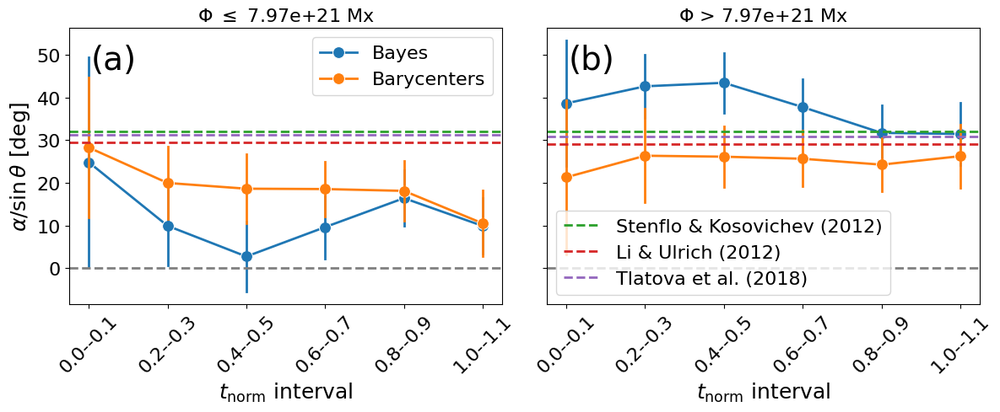

In [ ]:

db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()
db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
db1['lat']=np.abs(db1['lat'])
db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(frac= lambda x: x.alpha/x.lat)
db1=db1.assign(fracb= lambda x: x.alphab/x.lat)


f,ax=plt.subplots(1,2,figsize=(12,5),sharey=True)
ax=ax.flatten()
for s,ars in enumerate([arslowf,arshighf]):
  db2=db1[db1.AR.isin(ars)]
  dbA=db2[db2['frac_sin'].between(*limits)]
  dbB=db2[db2['fracb_sin'].between(*limits)]

  f1 = lambda x: x * (dbB.fracb.mean() / dbB.fracb_sin.mean())      # primary → secondary
  g1 = lambda u: u * (dbB.fracb_sin.mean() / dbB.fracb.mean())      # secondary → primary
  l=[]
  for tt in np.sort(dbA.t_mean.unique())[::2]:
    l.append(dbA[dbA['t_mean'].between(tt,tt+0.1)].assign(Method='Bayes',interval=f'{tt:.1f}--{tt+0.1:.1f}'))
    l.append(dbB[dbB['t_mean'].between(tt,tt+0.1)].assign(Method='Barycenters',
                                                          interval=f'{tt:.1f}--{tt+0.1:.1f}',
                                                          frac_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat))))

  DFT=pd.concat(l)

  #sns.boxplot(data=DFT,x='interval',y='frac_sin',hue='Method', showfliers=False,ax=ax[s])
  # Calculate means for each group and category
  mean_values = DFT.groupby(['interval', 'Method']).mean().reset_index()

  # Add the lineplot connecting the means
  sns.lineplot(x='interval', y='frac_sin', hue='Method', data=DFT, marker='o',estimator='mean',errorbar='se',
               err_style='bars', linewidth=2, color='red', legend=True,ax=ax[s], markersize=10, err_kws={'capsize': 0, 'elinewidth': 2})
#  sns.lineplot(x='interval', y='frac_sin', hue='Method', data=mean_values, marker='o',errorbar='sd', linestyle='-', color='red', legend=False,ax=ax[s])
  if s == 0:
    ax[s].set_title(f'$\Phi$ $\leq$ {db.flux.median():.2e} Mx',fontsize=16)
  else:
    ax[s].set_title(f'$\Phi$ > {db.flux.median():.2e} Mx',fontsize=16)

  ax[s].axhline(0,linestyle='--',color='gray',linewidth=2)
  ax[s].axhline(32.1,linestyle='--',color='tab:green',linewidth=2,label='Stenflo & Kosovichev (2012)')
  ax[s].axhline(g1(0.5),linestyle='--',color='tab:red',linewidth=2,label='Li & Ulrich (2012)')
  ax[s].axhline(g1(0.53),linestyle='--',color='tab:purple',linewidth=2,label='Tlatova et al. (2018)')
  ax[s].set_xlabel(f'$t_\mathrm{{norm}}$ interval',fontsize=18)
  ax[s].set_ylabel(r'$\alpha/\sin{\theta}$ [deg]',fontsize=18)
  ax[s].tick_params(axis='both', which='major', labelsize=16)
  ax[s].tick_params(axis='x', labelrotation=45)

  ax[s].text(0.05,0.85,f'({chr(97+s)})',transform=ax[s].transAxes,fontsize=28)

h,l=ax[0].get_legend_handles_labels()
ax[0].legend(h[:2],l[:2],fontsize=16)
ax[1].legend(h[2:],l[2:],fontsize=16)
f.tight_layout()


f.savefig('../figures/sin_alpha_interval.pdf',dpi=300)

<>:44: SyntaxWarning: invalid escape sequence '\m'
<>:44: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-1854875492.py:44: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.values)})',fontsize=16)
/tmp/ipython-input-1854875492.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat']=np.abs(db['lat'])


(-266,317)
(-291,332)
t:0.2--0.30000000000000004----------------------
m_{mod}:0.32 +/- 0.16
m_{bar}:0.44 +/- 0.20
C_{mod}:2.58 +/- 3.09
C_{bar}:-1.06 +/- 3.74
rmse_{mod}:15.64
rmse_{bar}:19.07
------------------------------------
t:1.0--1.1----------------------
m_{mod}:0.40 +/- 0.13
m_{bar}:0.49 +/- 0.13
C_{mod}:-0.36 +/- 2.36
C_{bar}:-1.92 +/- 2.45
rmse_{mod}:12.60
rmse_{bar}:13.39
------------------------------------


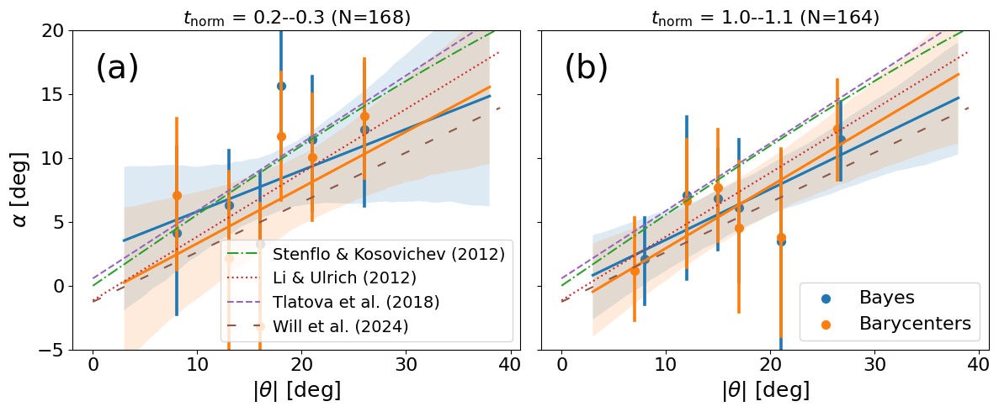

In [ ]:
limits=(-300,340)

db=DFx2[DFx2['t_mean'].between(0.8,1.1)]

db['lat']=np.abs(db['lat'])

db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
db1['lat']=np.abs(db1['lat'])
db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))

db1=db1.assign(frac= lambda x: x.alpha/x.lat)
db1=db1.assign(fracb= lambda x: x.alphab/x.lat)


print(f'({db1.frac_sin.mean()-3*db1.frac_sin.std():.0f},{db1.frac_sin.mean()+3*db1.frac_sin.std():.0f})')
print(f'({db1.fracb_sin.mean()-3*db1.fracb_sin.std():.0f},{db1.fracb_sin.mean()+3*db1.fracb_sin.std():.0f})')


dbA=db1[db1['frac_sin'].between(*limits)]
dbB=db1[db1['fracb_sin'].between(*limits)]


f,ax=plt.subplots(1,2,figsize=(12,5),sharey=True)

for (i,tt),ax1 in zip(enumerate([0.2,1.0]),ax.flatten()):

  sns.regplot(data=dbA[dbA['t_mean'].between(tt,tt+0.1)],x='lat',y='alpha',ax=ax1,x_bins=6,label='Bayes')
  sns.regplot(data=dbB[dbB['t_mean'].between(tt,tt+0.1)],x='lat',y='alphab',ax=ax1,x_bins=6,label='Barycenters')
  res1 = stats.linregress(dbA[dbA['t_mean'].between(tt,tt+0.1)].lat.values, dbA[dbA['t_mean'].between(tt,tt+0.1)].alpha.values)
  res2 = stats.linregress(dbB[dbB['t_mean'].between(tt,tt+0.1)].lat.values, dbB[dbB['t_mean'].between(tt,tt+0.1)].alphab.values)
  rmse1 = ((dbA[dbA['t_mean'].between(tt,tt+0.1)].alpha.values - (res1.slope * dbA[dbA['t_mean'].between(tt,tt+0.1)].lat.values + res1.intercept)) ** 2).mean() ** 0.5
  rmse2 = ((dbB[dbB['t_mean'].between(tt,tt+0.1)].alphab.values - (res2.slope * dbB[dbB['t_mean'].between(tt,tt+0.1)].lat.values + res2.intercept))**2).mean()**0.5

  print(f't:{tt}--{tt+0.1}----------------------')
  print(f'm_{{mod}}:{res1.slope:.2f} +/- {res1.stderr:.2f}')
  print(f'm_{{bar}}:{res2.slope:.2f} +/- {res2.stderr:.2f}')
  print(f'C_{{mod}}:{res1.intercept:.2f} +/- {res1.intercept_stderr:.2f}')
  print(f'C_{{bar}}:{res2.intercept:.2f} +/- {res2.intercept_stderr:.2f}')
  print(f'rmse_{{mod}}:{rmse1:.2f}')
  print(f'rmse_{{bar}}:{rmse2:.2f}')
  print('------------------------------------')

  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.values)})',fontsize=16)
  ax1.set_ylabel('')
  if i in [0,3]:
    ax1.set_ylabel(r'$\alpha$ [deg]',fontsize=18)

  ax1.set_xlabel(r'$|\theta|$ [deg]',fontsize=18)
  ax1.tick_params(axis='both', which='major', labelsize=16)

  ax1.set_ylim(-5,20)

  x=np.arange(0,40)

  ax1.plot(x,32.1*np.sin(np.deg2rad(x)),linestyle='-.',color='tab:green',label='Stenflo & Kosovichev (2012)')
  ax1.plot(x,180*(0.5*np.deg2rad(x)-0.02)/np.pi,linestyle=':',color='tab:red',label='Li & Ulrich (2012)')
  ax1.plot(x,180*(0.53*np.deg2rad(x)+0.01)/np.pi,linestyle='--',color='tab:purple',label='Tlatova et al. (2018)')
  ax1.plot(x,0.39*x-1.26,linestyle=(0, (5, 10)),color='tab:brown',label='Will et al. (2024)')






#  ax1.axvline(g1(0.5),linestyle='--',linewidth=2,label='Li & Ulrich (2012)',color='tab:red')


  ax1.text(0.05,0.85,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=28)

h,l=ax[0].get_legend_handles_labels()
ax[1].legend(h[:2],l[:2],fontsize=16)
ax[0].legend(h[2:],l[2:],fontsize=14)
f.tight_layout()

f.savefig('../figures/reg_sin_alpha.pdf',dpi=300)



<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:48: SyntaxWarning: invalid escape sequence '\m'
<>:48: SyntaxWarning: invalid escape sequence '\s'
<>:56: SyntaxWarning: invalid escape sequence '\m'
<>:56: SyntaxWarning: invalid escape sequence '\s'
<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:48: SyntaxWarning: invalid escape sequence '\m'
<>:48: SyntaxWarning: invalid escape sequence '\s'
<>:56: SyntaxWarning: invalid escape sequence '\m'
<>:56: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-1174389414.py:43: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.values)})')
/tmp/ipython-input-1174389414.py:48: SyntaxWarning: invalid escape sequence '\m'
  f'$\mu$ ={dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.mean():.1f}°\n$\sigma$={dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.std():.1f}°',
/tmp/ipython-input-1174389414.py:48: SyntaxWarning: in

(-327,348)
(-347,374)


/tmp/ipython-input-1174389414.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat']=np.abs(db['lat'])


(-190,270)
(-226,280)


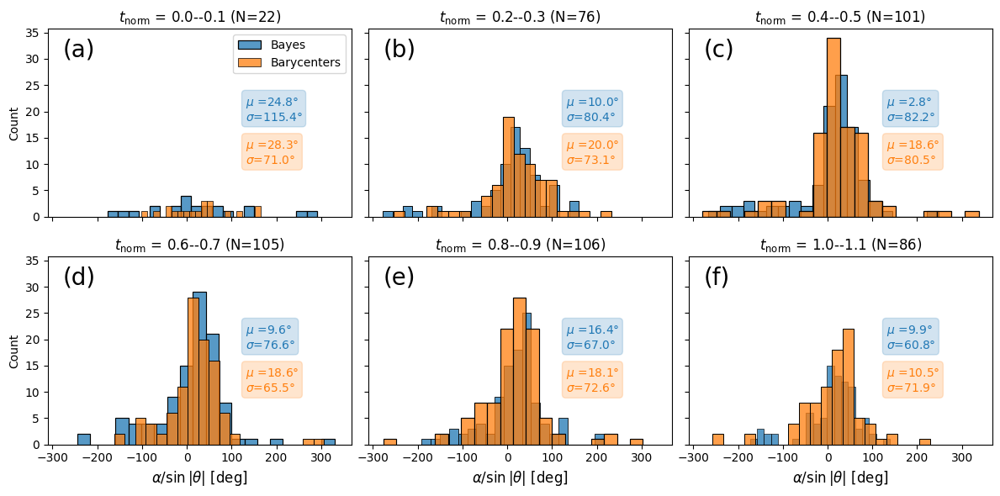

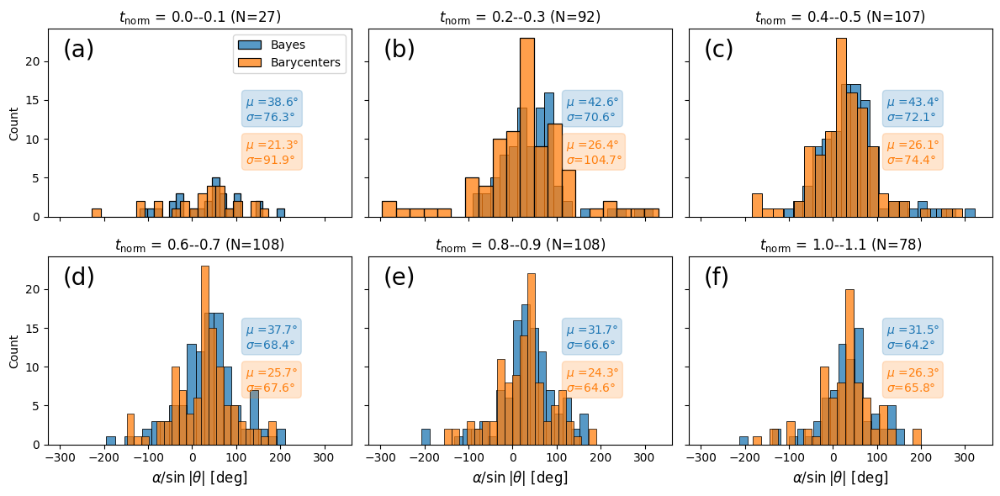

In [ ]:
db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()




for s,ars in enumerate([arslowf,arshighf]):

  limits=(-300,340)

  db=DFx2[DFx2['t_mean'].between(0.8,1.1)]

  db['lat']=np.abs(db['lat'])

  db1=DFx2[DFx2['t_mean'].between(0,1.1)].groupby(['AR','t_mean']).mean().reset_index()
  db1['lat']=np.abs(db1['lat'])
  db1=db1[db1['AR'].isin(ars)]
  db1=db1.assign(frac_sin= lambda x: x.alpha/np.sin(np.deg2rad(x.lat)))
  db1=db1.assign(fracb_sin= lambda x: x.alphab/np.sin(np.deg2rad(x.lat)))



  #sns.histplot(data=db1[db1['frac_sin'].between(*limits)],x='frac_sin')
  #sns.histplot(data=db1[db1['fracb_sin'].between(*limits)],x='fracb_sin')

  print(f'({db1.frac_sin.mean()-3*db1.frac_sin.std():.0f},{db1.frac_sin.mean()+3*db1.frac_sin.std():.0f})')
  print(f'({db1.fracb_sin.mean()-3*db1.fracb_sin.std():.0f},{db1.fracb_sin.mean()+3*db1.fracb_sin.std():.0f})')


  dbA=db1[db1['frac_sin'].between(*limits)]
  dbB=db1[db1['fracb_sin'].between(*limits)]


  f,ax=plt.subplots(2,3,figsize=(12,6),sharey=True,sharex=True)

  for (i,tt),ax1 in zip(enumerate(np.sort(dbA.t_mean.unique())[::2]),ax.flatten()):

    sns.histplot(data=dbA[dbA['t_mean'].between(tt,tt+0.1)],x='frac_sin',ax=ax1,bins=20,label='Bayes')
    sns.histplot(data=dbB[dbB['t_mean'].between(tt,tt+0.1)],x='fracb_sin',ax=ax1,bins=20,label='Barycenters')

    ax1.set_title(f'$t_\mathrm{{norm}}$ = {tt:.1f}--{tt+0.1:.1f} (N={len(dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.values)})')
    ax1.set_xlabel(r'$\alpha / \sin{|\theta|}$ [deg]',fontsize=12)

    ax1.text(
      0.65, 0.51,
      f'$\mu$ ={dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.mean():.1f}°\n$\sigma$={dbA[dbA['t_mean'].between(tt,tt+0.1)].frac_sin.std():.1f}°',
      color='tab:blue',
      transform=ax1.transAxes,
      fontsize=10,
      bbox=dict(boxstyle="round", alpha=0.2, color='tab:blue')
      )
    ax1.text(
      0.65, 0.28,
      f'$\mu$ ={dbB[dbB['t_mean'].between(tt,tt+0.1)].fracb_sin.mean():.1f}°\n$\sigma$={dbB[dbB['t_mean'].between(tt,tt+0.1)].fracb_sin.std():.1f}°',
      color='tab:orange',
      transform=ax1.transAxes,
      fontsize=10,
      bbox=dict(boxstyle="round", alpha=0.2, color='tab:orange')
      )

    ax1.text(0.05,0.85,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=20)

  ax[0,0].legend()
  f.tight_layout()
  f.savefig(f'../figures/hist_sin_alpha_{'lowf' if s==0 else 'highf'}.pdf',dpi=300)
  f.show()




In [ ]:
f1,ax1=plotting.plot_single(db1,'alpha',title='',ax=ax1,fig=f,scatter=True,estim='median',
                            error='band',err_kws={'alpha':1},color='tab:blue',ls='-')
f1,ax1=plotting.plot_single(db1,'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                            estim='median',
                            error='band',err_kws={'alpha':1},ls='-')

np.int64(8084)

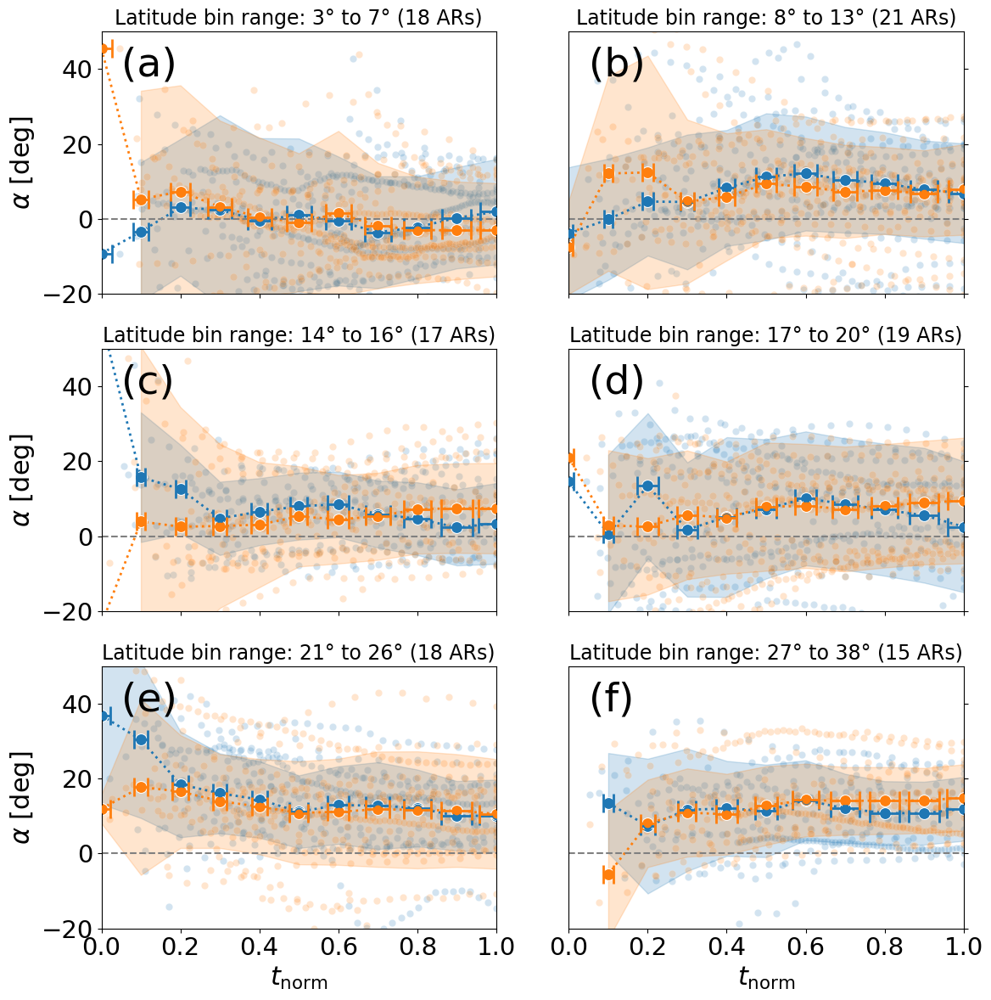

In [53]:

'''
Plot of alpha vs normalized time for all ARs, separated by latitude bins.
Solid lines represent the median alpha at each normalized time for both modeled and barycenter methods.
scatter points represent individual data points. Solid dashed line at y=0 for reference.
Each panel shows a different latitude bin. Shaded area represents the standard deviation at each time.
'''


DFx2['lat']=np.abs(DFx2['lat'])

DFx2['lat_bin'] = pd.qcut(DFx2['lat'], q=6,labels=False)

#f,ax=plt.subplots(2,3,figsize=(18,10),sharey=True)

ff=22

f,ax=plt.subplots(3,2,figsize=(12,12),sharex=True,sharey=True)

for (i,lat_bin),ax1 in zip(enumerate(np.sort(DFx2.lat_bin.unique())),ax.flatten()):
    db1=DFx2[DFx2['lat_bin']==lat_bin]
    nARs=len(db1.AR.unique())

    binrange=db1.lat.min(),db1.lat.max()

    f1,ax1=plotting.plot_single(db1,'alpha',title='',ax=ax1,fig=f,scatter=True,estim='median',
                               error='band',err_kws={'alpha':1},color='tab:blue',ls=':')
    f1,ax1=plotting.plot_single(db1,'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                               estim='median',
                               error='band',err_kws={'alpha':1},ls=':')



    DFxx=db1.groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()



    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alpha'].values,
        color='tab:blue',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       #yerr=DFbb2['alpha'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alphab'].values,
        color='tab:orange',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       #yerr=DFbb2['alphab'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )


    ax1.set_ylabel(r'$\alpha$ [deg]',fontsize=ff)
    ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=ff)
    ax1.tick_params(axis='both', which='major', labelsize=ff-1)
    ax1.set_title(f'Latitude bin range: {binrange[0]}° to {binrange[1]}° ({nARs} ARs)',fontsize=ff-5)
    ax1.legend().remove()
    ax1.set_xlim(0,1)
    ax1.set_ylim(-20,50)
    ax1.axhline(0,color='gray',ls='--')
    if i in [1,3,5]:
      ax1.yaxis.set_label_position('right')

      # Move the tick marks to the right side as well
      ax1.yaxis.tick_right()


for i,ax1 in enumerate(ax.flatten()):
    ax1.text(0.05,0.83,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=ff+12)

f.tight_layout()
f.savefig('../figures/alpha-vs-t_norm-by-lat.pdf',dpi=300)


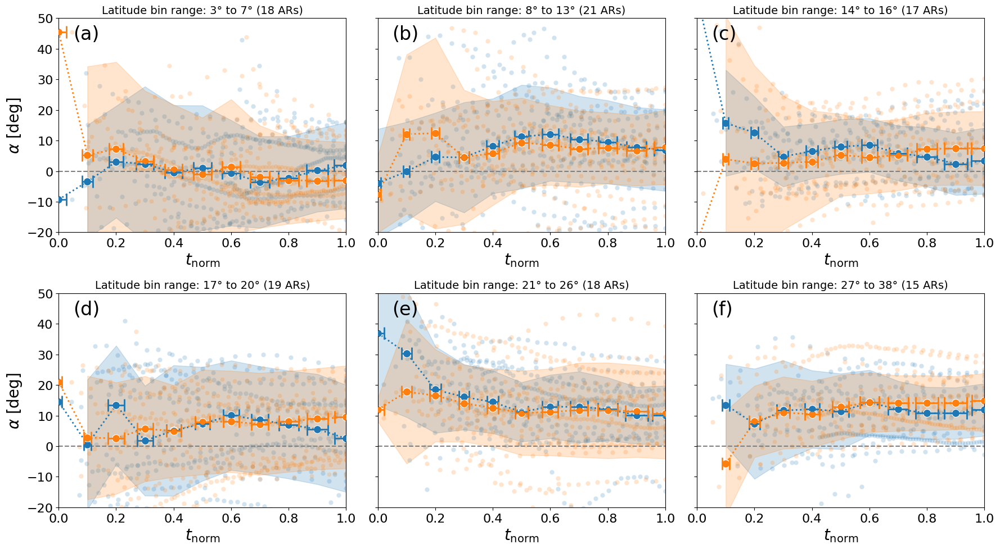

In [ ]:
'''
Plot of alpha vs normalized time for all ARs, separated by latitude bins.
Solid lines represent the median alpha at each normalized time for both modeled and barycenter methods.
scatter points represent individual data points. Solid dashed line at y=0 for reference.
Each panel shows a different latitude bin. Shaded area represents the standard deviation at each time.
'''


DFx2['lat']=np.abs(DFx2['lat'])

DFx2['lat_bin'] = pd.qcut(DFx2['lat'], q=6,labels=False)

f,ax=plt.subplots(2,3,figsize=(18,10),sharey=True)

for (i,lat_bin),ax1 in zip(enumerate(np.sort(DFx2.lat_bin.unique())),ax.flatten()):
    db1=DFx2[DFx2['lat_bin']==lat_bin]
    nARs=len(db1.AR.unique())

    binrange=db1.lat.min(),db1.lat.max()

    f1,ax1=plotting.plot_single(db1,'alpha',title='',ax=ax1,fig=f,scatter=True,estim='median',
                               error='band',err_kws={'alpha':1},color='tab:blue',ls=':')
    f1,ax1=plotting.plot_single(db1,'alphab',title='',ax=ax1,fig=f,color='tab:orange',scatter=True,
                               estim='median',
                               error='band',err_kws={'alpha':1},ls=':')



    DFxx=db1.groupby(['AR','t_mean']).mean().reset_index()
    DFbb=DFxx.groupby('t_mean').median().reset_index()
    DFbb2=DFxx.groupby('t_mean').std().reset_index()
    cc = DFxx.groupby('t_mean').count().reset_index()



    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alpha'].values,
        color='tab:blue',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       #yerr=DFbb2['alpha'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )

    ax1.errorbar(
        x=DFbb['t_mean'].values,
        y=DFbb['alphab'].values,
        color='tab:orange',
        linewidth=0,
        xerr=DFbb['t_norm_err'].values,  # Specify x-axis error
       #yerr=DFbb2['alphab'].values/np.sqrt(cc['alpha'].values),  # Specify y-axis error
        fmt='-o',          # Line with circle markers
        capsize=8,          # Add caps to the error bars
        capthick=2,
        elinewidth=2,zorder=4

    )


    ax1.set_ylabel(r'$\alpha$ [deg]',fontsize=20)
    ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=20)
    ax1.tick_params(axis='both', which='major', labelsize=16)
    ax1.set_title(f'Latitude bin range: {binrange[0]}° to {binrange[1]}° ({nARs} ARs)')
    ax1.legend().remove()
    ax1.set_xlim(0,1)
    ax1.set_ylim(-20,50)
    ax1.axhline(0,color='gray',ls='--')


for i,ax1 in enumerate(ax.flatten()):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.tight_layout()
f.savefig('../figures/alpha-vs-t_norm-by-lat.pdf',dpi=300)

/tmp/ipykernel_9601/3129853290.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat']=np.abs(db['lat'])
/tmp/ipykernel_9601/3129853290.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['t_bin'] = pd.qcut(db['t_norm'], q=4,labels=False)


------ Time bin: -0.10 - 0.40 ----
RSME alpha: 17.67 deg; rho: 0.139688
RSME alphab: 18.97 deg; rho: 0.192576
-----------------------------------------------
------ Time bin: 0.40 - 0.62 ----
RSME alpha: 14.93 deg; rho: 0.159774
RSME alphab: 14.75 deg; rho: 0.262050
-----------------------------------------------
------ Time bin: 0.62 - 0.83 ----
RSME alpha: 13.05 deg; rho: 0.220572
RSME alphab: 13.84 deg; rho: 0.265636
-----------------------------------------------
------ Time bin: 0.83 - 1.05 ----
RSME alpha: 12.72 deg; rho: 0.274182
RSME alphab: 13.10 deg; rho: 0.297061
-----------------------------------------------


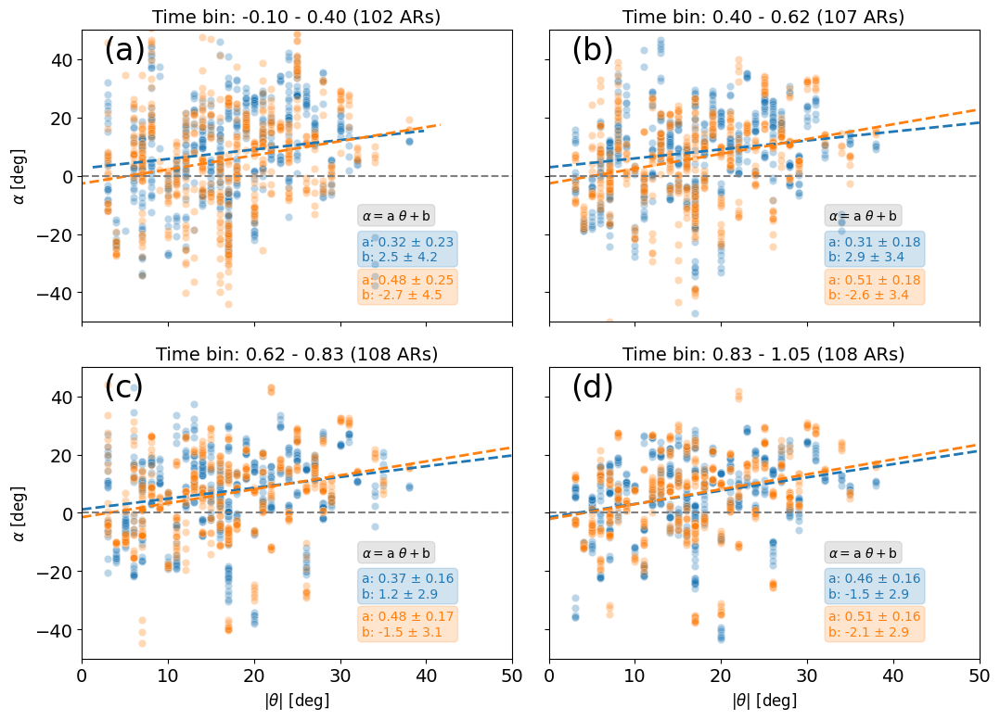

In [ ]:
'''
Plot of alpha vs latitude for all ARs, separated by normalized time bins.
Dashed lines represent linear fits for both modeled and barycenter methods.
scatter points represent individual data points. Solid dashed line at y=0 for reference.
Each panel shows a different normalized time bin.


'''






db=DFx2[DFx2.t_mean<=1]

db['lat']=np.abs(db['lat'])
db['t_bin'] = pd.qcut(db['t_norm'], q=4,labels=False)

f,ax=plt.subplots(2,2,figsize=(11,8),sharey=True,sharex=True)

for (i,t_bin),ax1 in zip(enumerate(np.sort(db.t_bin.unique())),ax.flatten()):
    db1=db[db['t_bin']==t_bin]
    nARs=len(db1.AR.unique())

    binrange=db1.t_norm.min(),db1.t_norm.max()

    sns.scatterplot(data=db1,x='lat',y='alpha',color='tab:blue',alpha=0.3,label=r'$\alpha_\mathrm{mod}$',ax=ax1)
    sns.scatterplot(data=db1,x='lat',y='alphab',color='tab:orange',alpha=0.3,label=r'$\alpha_\mathrm{bar}$',ax=ax1)
    db2=db1.groupby('AR').median().reset_index()
    #sns.scatterplot(data=db2,x='lat',y='alpha',color='tab:blue',s=100,edgecolor='black',label=r'Median $\alpha_\mathrm{mod}$',ax=ax1)
    #sns.scatterplot(data=db2,x='lat',y='alphab',color='tab:orange',s=100,edgecolor='black',label=r'Median $\alpha_\mathrm{bar}$',ax=ax1)
    print(f'------ Time bin: {binrange[0]:.2f} - {binrange[1]:.2f} ----')
    for var, color in zip(['alpha', 'alphab'], ['tab:blue', 'tab:orange']):
      dfv = db2[[var,'lat']]
      res = stats.linregress(dfv['lat'].values, dfv[var].values)
      x_vals = np.array(ax1.get_xlim())
      y_vals = res.intercept + res.slope * x_vals
      ax1.plot(x_vals, y_vals, color=color, linestyle='--', linewidth=2, label=f'Fit ${var}$')

      ax1.text(
          0.65, 0.21 if var == 'alpha' else 0.08,
          f"a: {res.slope:.2f} ± {res.stderr:.2f}\nb: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
          color=color,
          transform=ax1.transAxes,
          fontsize=10,
          bbox=dict(boxstyle="round", alpha=0.2, color=color)
      )
      rmse = ((db2[var] - (res.slope * db2['lat'] + res.intercept)) ** 2).mean() ** 0.5

      print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')

    print('-----------------------------------------------')

    ax1.text(
        0.65, 0.35 ,
        r"$\alpha = \mathrm{a}~\theta +\mathrm{b}$",
        color='black',
        transform=ax1.transAxes,
        fontsize=10,
        bbox=dict(boxstyle="round", alpha=0.2, color='gray')
        )

    ax1.set_ylabel(r'$\alpha$ [deg]')
    ax1.set_xlabel(r'$|\theta|$ [deg]')
    ax1.set_title(f'Time bin: {binrange[0]:.2f} - {binrange[1]:.2f} ({nARs} ARs)')
    ax1.legend().remove()
    ax1.set_xlim(0,50)
    ax1.set_ylim(-50,50)
    ax1.axhline(0,color='gray',ls='--')


for i,ax1 in enumerate(ax.flatten()):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.tight_layout()
f.savefig('../figures/alpha-vs-lat-by-tnorm.pdf',dpi=300)



/tmp/ipykernel_9601/28542831.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat']=np.abs(db['lat'])
/tmp/ipykernel_9601/28542831.py:13: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  res = stats.linregress(dfv['lat'].values, dfv[var].values)


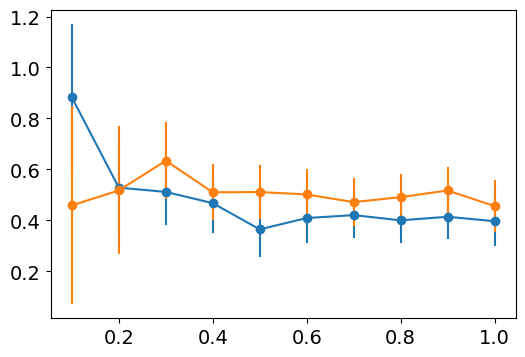

In [ ]:
db=DFx2[DFx2.t_mean<=1]
db['lat']=np.abs(db['lat'])


for var in ['alpha','alphab']:
    slp=[]
    slp_err=[]
    int=[]
    int_err=[]
    ax1=plt.gca()
    for tt in db.t_mean.unique():
        dfv=db[db.t_mean==tt]
        res = stats.linregress(dfv['lat'].values, dfv[var].values)
        slp.append(res.slope)
        slp_err.append(res.stderr)
        int.append(res.intercept)
        int_err.append(res.intercept_stderr)
    ax1.errorbar(db.t_mean.unique()[:-2],slp[:-2],slp_err[:-2],marker='o')



<ErrorbarContainer object of 3 artists>

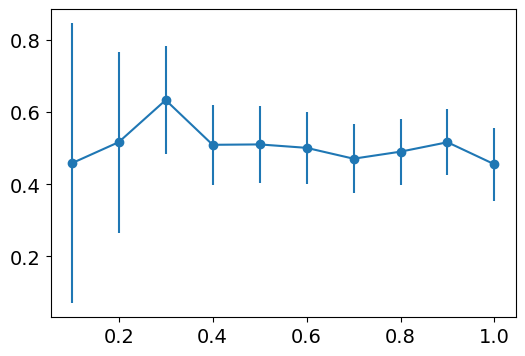

In [ ]:
plt.errorbar(db.t_mean.unique()[:-2],slp[:-2],slp_err[:-2],marker='o')

/tmp/ipykernel_9601/1060717700.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat']=np.abs(db['lat'])
/tmp/ipykernel_9601/1060717700.py:54: RuntimeWarning: divide by zero encountered in divide
  w = np.where(derr > 0, 1 / derr, 0)
/tmp/ipykernel_9601/1060717700.py:54: RuntimeWarning: divide by zero encountered in divide
  w = np.where(derr > 0, 1 / derr, 0)


------ Time bin: 0.01 - 0.27 ----
RSME alpha: 17.51 deg; rho: 0.144757
RSME alphab: 22.94 deg; rho: 0.172746
-----------------------------------------------
------ Time bin: 0.27 - 0.53 ----
RSME alpha: 16.04 deg; rho: 0.140677
RSME alphab: 16.01 deg; rho: 0.238898
-----------------------------------------------
------ Time bin: 0.53 - 0.79 ----
RSME alpha: 13.41 deg; rho: 0.194763
RSME alphab: 14.01 deg; rho: 0.255455
-----------------------------------------------
------ Time bin: 0.79 - 1.05 ----
RSME alpha: 12.71 deg; rho: 0.272250
RSME alphab: 13.13 deg; rho: 0.294739
-----------------------------------------------


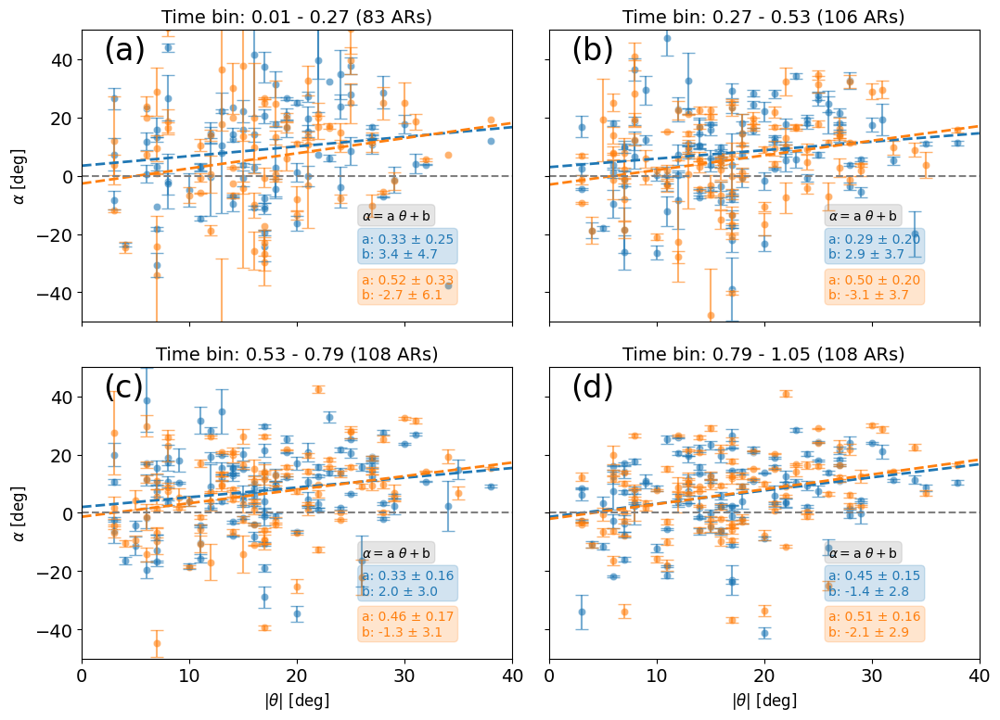

In [ ]:
'''
Plot of alpha vs latitude for all ARs, separated by normalized time bins.
Dashed lines represent linear fits for both modeled and barycenter methods.
scatter points represent individual data points. Solid dashed line at y=0 for reference.
Each panel shows a different normalized time bin.


'''

from sklearn.linear_model import LinearRegression




db=DFx2[DFx2.t_mean<=1]

db['lat']=np.abs(db['lat'])
db=db[db.t_norm>=0]
db['t_bin'] = pd.cut(db['t_norm'], bins=4,labels=False)

f,ax=plt.subplots(2,2,figsize=(11,8),sharey=True,sharex=True)

for (i,t_bin),ax1 in zip(enumerate(np.sort(db.t_bin.unique())),ax.flatten()):
    db1=db[db['t_bin']==t_bin]
    nARs=len(db1.AR.unique())
    db_std = db1.groupby('AR').std().reset_index()

    binrange=db1.t_norm.min(),db1.t_norm.max()
    db2=db1.groupby('AR').median().reset_index()
    sns.scatterplot(data=db2,x='lat',y='alpha',color='tab:blue',alpha=0.6,label=r'$\alpha_\mathrm{mod}$',ax=ax1)
    sns.scatterplot(data=db2,x='lat',y='alphab',color='tab:orange',alpha=0.6,label=r'$\alpha_\mathrm{bar}$',ax=ax1)
    ax1.errorbar(db2['lat'], db2['alpha'],
                 yerr=db1.groupby('AR').std().reset_index()['alpha'],
                 fmt='none', capsize=5, color='black',
                 barsabove=False,ecolor='tab:blue',alpha=0.6)
    ax1.errorbar(db2['lat'], db2['alphab'],
                 yerr=db1.groupby('AR').std().reset_index()['alphab'],
                 fmt='none', capsize=5, color='black',
                 barsabove=False,ecolor='tab:orange',alpha=0.6)


    #sns.scatterplot(data=db2,x='lat',y='alpha',color='tab:blue',s=100,edgecolor='black',label=r'Median $\alpha_\mathrm{mod}$',ax=ax1)
    #sns.scatterplot(data=db2,x='lat',y='alphab',color='tab:orange',s=100,edgecolor='black',label=r'Median $\alpha_\mathrm{bar}$',ax=ax1)
    print(f'------ Time bin: {binrange[0]:.2f} - {binrange[1]:.2f} ----')
    for var, color in zip(['alpha', 'alphab'], ['tab:blue', 'tab:orange']):

      dfv = db2[[var,'lat']]
      res = stats.linregress(dfv['lat'].values, dfv[var].values)
      derr = db1.groupby('AR')[var].quantile(0.75).values - db1.groupby('AR')[var].quantile(0.25).values
      derr = derr / 2
      #yerr = db1.groupby('AR')[var].std().reset_index()[var] / np.sqrt(db1.groupby('AR').size().values)

      # Evitar pesos infinitos o nulos
      w = np.where(derr > 0, 1 / derr, 0)
      x=dfv['lat'].values
      y=dfv[var].values
      #w=np.ones_like(x)
      # Ajuste lineal ponderado
      #coeffs, cov = np.polyfit(x, y, deg=1, w=w, cov=True)
      #slope, intercept = coeffs
      #slope_err, intercept_err = np.sqrt(np.diag(cov))
      #slope, intercept, slope_ci, intercept_ci = theil_sen_ci(x, y)

      x_vals = np.linspace(0, 40, 100)
      y_vals = res.slope * x_vals + res.intercept
      ax1.plot(x_vals, y_vals, color=color, linestyle='--', linewidth=2,
                 label=f'Weighted fit {var}')

      ax1.text(
            0.65, 0.22 if var == 'alpha' else 0.08,
            f"a: {res.slope:.2f} ± {res.stderr:.2f}\n"
            f"b: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
            color=color,
            transform=ax1.transAxes,
            fontsize=10,
            bbox=dict(boxstyle="round", alpha=0.2, color=color)
        )
      rmse = ((db2[var] - (res.slope * db2['lat'] + res.intercept)) ** 2).mean() ** 0.5

      print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')

    print('-----------------------------------------------')

    ax1.text(
        0.65, 0.35 ,
        r"$\alpha = \mathrm{a}~\theta +\mathrm{b}$",
        color='black',
        transform=ax1.transAxes,
        fontsize=10,
        bbox=dict(boxstyle="round", alpha=0.2, color='gray')
        )

    ax1.set_ylabel(r'$\alpha$ [deg]')
    ax1.set_xlabel(r'$|\theta|$ [deg]')
    ax1.set_title(f'Time bin: {binrange[0]:.2f} - {binrange[1]:.2f} ({nARs} ARs)')
    ax1.legend().remove()
    ax1.set_xlim(0,40)
    ax1.set_ylim(-50,50)
    ax1.axhline(0,color='gray',ls='--')


for i,ax1 in enumerate(ax.flatten()):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.tight_layout()
f.savefig('../figures/alpha-vs-lat-by-tnorm.pdf',dpi=300)



/tmp/ipykernel_9601/1053227913.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat'] = np.abs(db['lat'])


------ Time bin: 0.01 - 0.27 ----
RMSE alpha: 17.50 deg
RMSE alphab: 22.94 deg
-----------------------------------------------
------ Time bin: 0.27 - 0.53 ----
RMSE alpha: 16.04 deg
RMSE alphab: 16.02 deg
-----------------------------------------------
------ Time bin: 0.53 - 0.79 ----
RMSE alpha: 13.41 deg
RMSE alphab: 14.02 deg
-----------------------------------------------
------ Time bin: 0.79 - 1.05 ----
RMSE alpha: 12.70 deg
RMSE alphab: 13.14 deg
-----------------------------------------------


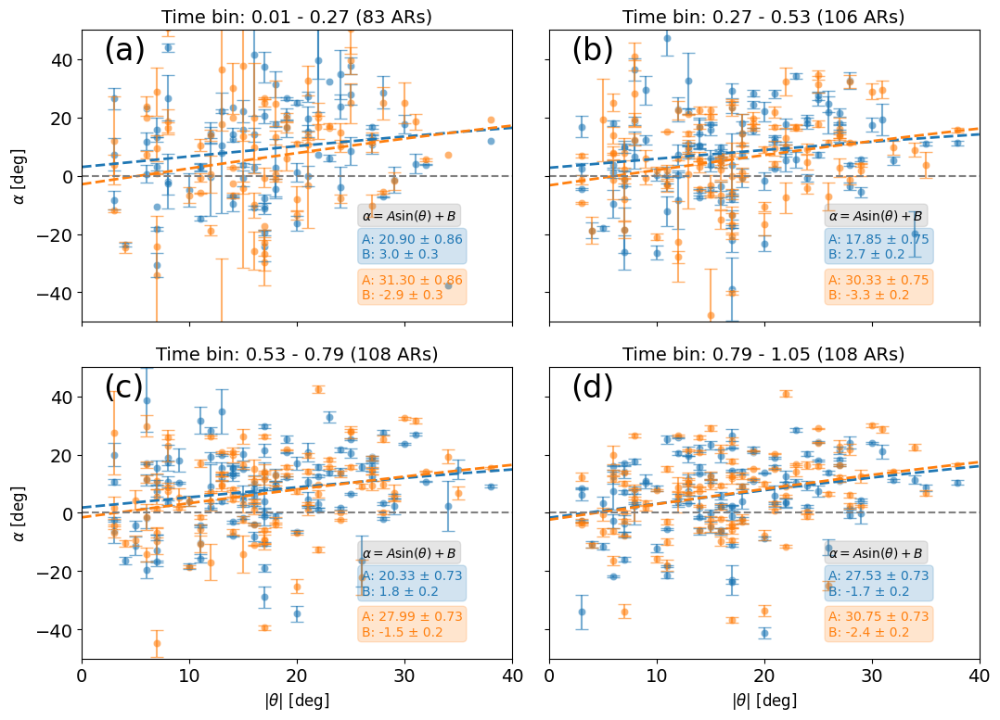

In [ ]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def sin_func(x, A, B):
    """Modelo sinusoidal simple."""
    return A * np.sin(np.radians(x)) + B  # si x está en grados

db = DFx2[DFx2.t_mean <= 1]
db['lat'] = np.abs(db['lat'])
db = db[db.t_norm >= 0]
db['t_bin'] = pd.cut(db['t_norm'], bins=4, labels=False)

f, ax = plt.subplots(2, 2, figsize=(11, 8), sharey=True, sharex=True)

for (i, t_bin), ax1 in zip(enumerate(np.sort(db.t_bin.unique())), ax.flatten()):
    db1 = db[db['t_bin'] == t_bin]
    nARs = len(db1.AR.unique())
    binrange = db1.t_norm.min(), db1.t_norm.max()
    db2 = db1.groupby('AR').median().reset_index()

    sns.scatterplot(data=db2, x='lat', y='alpha', color='tab:blue', alpha=0.6, label=r'$\alpha_\mathrm{mod}$', ax=ax1)
    sns.scatterplot(data=db2, x='lat', y='alphab', color='tab:orange', alpha=0.6, label=r'$\alpha_\mathrm{bar}$', ax=ax1)

    # Dibujar barras de error
    for var, color in zip(['alpha', 'alphab'], ['tab:blue', 'tab:orange']):
        err = db1.groupby('AR')[var].std().reset_index()[var]
        ax1.errorbar(db2['lat'], db2[var], yerr=err, fmt='none', capsize=5, ecolor=color, alpha=0.6)

    print(f'------ Time bin: {binrange[0]:.2f} - {binrange[1]:.2f} ----')

    for var, color in zip(['alpha', 'alphab'], ['tab:blue', 'tab:orange']):
        x = db2['lat'].values
        y = db2[var].values

        # Definir pesos (inverso del rango intercuartílico)
        derr = db1.groupby('AR')[var].quantile(0.75).values - db1.groupby('AR')[var].quantile(0.25).values
        derr = np.where(derr == 0, np.nanmedian(derr), derr)
        w = 1 / derr

        # Ajuste sinusoidal con pesos
        try:
            popt, pcov = curve_fit(sin_func, x, y, sigma=1, absolute_sigma=True, p0=[10, 0])
            A, B = popt
            A_err, B_err = np.sqrt(np.diag(pcov))
        except Exception as e:
            print(f"Fit failed for {var}: {e}")
            A, B, A_err, B_err = np.nan, np.nan, np.nan, np.nan

        # Graficar curva ajustada
        x_fit = np.linspace(0, 40, 200)
        y_fit = sin_func(x_fit, A, B)
        ax1.plot(x_fit, y_fit, color=color, linestyle='--', linewidth=2, label=f'Sine fit {var}')

        # Mostrar parámetros
        ax1.text(
            0.65, 0.22 if var == 'alpha' else 0.08,
            f"A: {A:.2f} ± {A_err:.2f}\nB: {B:.1f} ± {B_err:.1f}",
            color=color,
            transform=ax1.transAxes,
            fontsize=10,
            bbox=dict(boxstyle="round", alpha=0.2, color=color)
        )

        # Calcular RMSE
        rmse = np.sqrt(np.mean((y - sin_func(x, A, B)) ** 2))
        print(f'RMSE {var}: {rmse:.2f} deg')

    print('-----------------------------------------------')

    ax1.text(
        0.65, 0.35,
        r"$\alpha = A \sin(\theta) + B$",
        color='black',
        transform=ax1.transAxes,
        fontsize=10,
        bbox=dict(boxstyle="round", alpha=0.2, color='gray')
    )

    ax1.set_ylabel(r'$\alpha$ [deg]')
    ax1.set_xlabel(r'$|\theta|$ [deg]')
    ax1.set_title(f'Time bin: {binrange[0]:.2f} - {binrange[1]:.2f} ({nARs} ARs)')
    ax1.legend().remove()
    ax1.set_xlim(0, 40)
    ax1.set_ylim(-50, 50)
    ax1.axhline(0, color='gray', ls='--')

for i, ax1 in enumerate(ax.flatten()):
    ax1.text(0.05, 0.9, f'({chr(97+i)})', transform=ax1.transAxes, fontsize=24)

f.tight_layout()
f.savefig('../figures/alpha-vs-lat-sinefit.pdf', dpi=300)


In [ ]:
plt.plot(yerr)

NameError: name 'yerr' is not defined

/tmp/ipykernel_183968/2561337339.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat']=np.abs(db['lat'])


------ Low Flux ----
RSME alpha: 11.68 deg; rho: 0.391216
RSME alphab: 11.55 deg; rho: 0.409670
-----------------------------------------------
------ High Flux ----
RSME alpha: 13.48 deg; rho: 0.131941
RSME alphab: 14.59 deg; rho: 0.161803
-----------------------------------------------


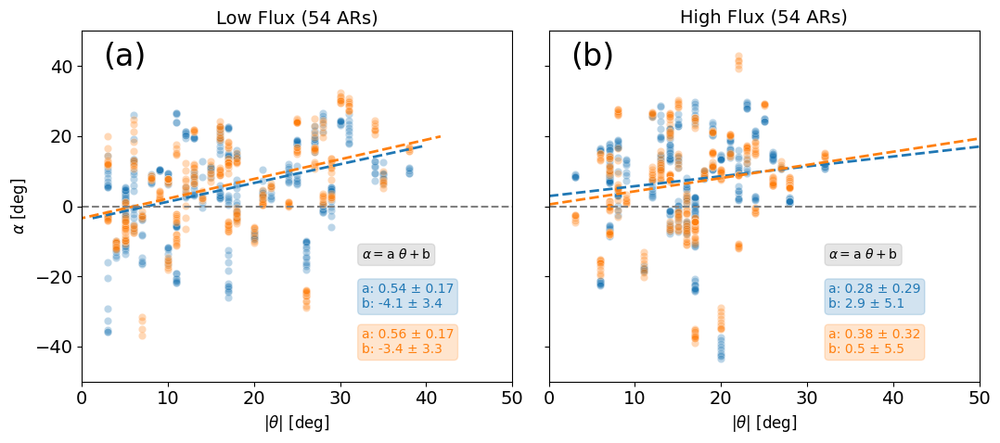

In [ ]:





db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()




db=DFx2[DFx2['t_mean'].between(0.8,1)]

db['lat']=np.abs(db['lat'])


f,ax=plt.subplots(1,2,figsize=(11,5),sharey=True,sharex=True)

for db1,ax1,titles in zip([db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,['Low Flux','High Flux']):

    nARs=len(db1.AR.unique())
    sns.scatterplot(data=db1,x='lat',y='alpha',color='tab:blue',alpha=0.3,label=r'$\alpha_\mathrm{mod}$',ax=ax1)
    sns.scatterplot(data=db1,x='lat',y='alphab',color='tab:orange',alpha=0.3,label=r'$\alpha_\mathrm{bar}$',ax=ax1)
    db2=db1.groupby('AR').median().reset_index()
    #sns.scatterplot(data=db2,x='lat',y='alpha',color='tab:blue',s=100,edgecolor='black',label=r'Median $\alpha_\mathrm{mod}$',ax=ax1)
    #sns.scatterplot(data=db2,x='lat',y='alphab',color='tab:orange',s=100,edgecolor='black',label=r'Median $\alpha_\mathrm{bar}$',ax=ax1)
    print(f'------ {titles} ----')
    for var, color in zip(['alpha', 'alphab'], ['tab:blue', 'tab:orange']):
      dfv = db2[[var,'lat']]
      rho=db2[var].corr(db2['lat'])
      res = stats.linregress(dfv['lat'].values, dfv[var].values)
      x_vals = np.array(ax1.get_xlim())
      y_vals = res.intercept + res.slope * x_vals
      ax1.plot(x_vals, y_vals, color=color, linestyle='--', linewidth=2, label=f'Fit ${var}$')

      ax1.text(
          0.65, 0.21 if var == 'alpha' else 0.08,
          f"a: {res.slope:.2f} ± {res.stderr:.2f}\nb: {res.intercept:.1f} ± {res.intercept_stderr:.1f}",
          color=color,
          transform=ax1.transAxes,
          fontsize=10,
          bbox=dict(boxstyle="round", alpha=0.2, color=color)
      )
      rmse = ((db2[var] - (res.slope * db2['lat'] + res.intercept)) ** 2).mean() ** 0.5

      print(f'RSME {var}: {rmse:.2f} deg; rho: {res.rvalue:.6f}')
    print('-----------------------------------------------')


    ax1.text(
        0.65, 0.35 ,
        r"$\alpha = \mathrm{a}~\theta +\mathrm{b}$",
        color='black',
        transform=ax1.transAxes,
        fontsize=10,
        bbox=dict(boxstyle="round", alpha=0.2, color='gray')
        )

    ax1.set_ylabel(r'$\alpha$ [deg]')
    ax1.set_xlabel(r'$|\theta|$ [deg]')
    ax1.set_title(f'{titles} ({nARs} ARs)')
    ax1.legend().remove()
    ax1.set_xlim(0,50)
    ax1.set_ylim(-50,50)
    ax1.axhline(0,color='gray',ls='--')


for i,ax1 in enumerate(ax.flatten()):
    ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

f.tight_layout()
f.savefig('../figures/alpha-vs-lat-by-flux.pdf',dpi=300)

# Bayes approach to Joy Law

In [ ]:
# PyMC 4.0 imports
import pymc as pm
import pytensor
import arviz as az


In [ ]:
db = DFx2[DFx2.t_mean < 1.1]
db['lat'] = np.abs(db['lat'])
db = db[db.t_mean > 0]


db2=db.groupby(['AR','t_mean']).mean().reset_index()

/tmp/ipython-input-4084513880.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat'] = np.abs(db['lat'])


In [ ]:
'''
dfa=pd.merge(maxfs,db2,on='AR',suffixes=('_max','')).sort_values('flux_max')
db0=dfa
alpha=[]
alphab=[]
theta=[]
std=[]
rep=[]
fmax=[]
timebool=[]
for tt in np.sort(db0.t_mean.unique()):
  timebool.append(db0.t_mean == tt)
  rep.append(len(db0[db0.t_mean == tt].alpha.values))
  for j in range(len(db0[db0.t_mean == tt].alpha.values)):
    alpha.append(db0[db0.t_mean == tt].alpha.values[j])
    alphab.append(db0[db0.t_mean == tt].alphab.values[j])
    theta.append(db0[db0.t_mean == tt].lat.values[j])
    fmax.append(db0[db0.t_mean == tt].flux_max.values[j])
    std.append(tt)

alpha=[db0[db0.t_mean == tt].alpha.values for tt in db0.t_mean.unique()]
alphab=[db0[db0.t_mean == tt].alphab.values for tt in db0.t_mean.unique()]
theta=[db0[db0.t_mean == tt].lat.values for tt in db0.t_mean.unique()]
'''

"\ndfa=pd.merge(maxfs,db2,on='AR',suffixes=('_max','')).sort_values('flux_max')\ndb0=dfa\nalpha=[]\nalphab=[]\ntheta=[]\nstd=[]\nrep=[]\nfmax=[]\ntimebool=[]\nfor tt in np.sort(db0.t_mean.unique()):\n  timebool.append(db0.t_mean == tt)\n  rep.append(len(db0[db0.t_mean == tt].alpha.values))\n  for j in range(len(db0[db0.t_mean == tt].alpha.values)):\n    alpha.append(db0[db0.t_mean == tt].alpha.values[j])\n    alphab.append(db0[db0.t_mean == tt].alphab.values[j])\n    theta.append(db0[db0.t_mean == tt].lat.values[j])\n    fmax.append(db0[db0.t_mean == tt].flux_max.values[j])\n    std.append(tt)\n\nalpha=[db0[db0.t_mean == tt].alpha.values for tt in db0.t_mean.unique()]\nalphab=[db0[db0.t_mean == tt].alphab.values for tt in db0.t_mean.unique()]\ntheta=[db0[db0.t_mean == tt].lat.values for tt in db0.t_mean.unique()]\n"

In [ ]:
maxfs=db2[db2.t_mean==1.0].groupby('AR').mean().reset_index()[['AR','flux']]
db0=pd.merge(maxfs,db2,on='AR',suffixes=('_max','')).sort_values('flux_max')
timebool=[]
for tt in np.sort(db0.t_mean.unique()):
  timebool.append(db0.t_mean == tt)

alpha=db0.alpha.values
alphab=db0.alphab.values
theta=db0.lat.values
fmax=db0.flux_max.values


def JOYMODELB2(alpha,theta,timebool):

    # Model
    with pm.Model() as joy_model:
        a = pm.Uniform('a', 0, 1)
        b = pm.Uniform('b', -5, 5)

            # Variables independientes
        A1 = pm.HalfNormal('A1', sigma=5)
        A2 = pm.HalfNormal('A2', sigma=5)
        A3 = pm.HalfNormal('A3', sigma=5)
        A4 = pm.HalfNormal('A4', sigma=5)
        A5 = pm.HalfNormal('A5', sigma=5)
        A6 = pm.HalfNormal('A6', sigma=5)
        A7 = pm.HalfNormal('A7', sigma=5)
        A8 = pm.HalfNormal('A8', sigma=5)
        A9 = pm.HalfNormal('A9', sigma=5)
        A10 = pm.HalfNormal('A10', sigma=5)
        #A11 = pm.HalfNormal('A11', sigma=5)

        # Construcción del vector
        A_vec = pm.Deterministic(
            'A_vec',
                A1*timebool[0]+
                A2*timebool[1]+
                A3*timebool[2]+
                A4*timebool[3]+
                A5*timebool[4]+
                A6*timebool[5]+
                A7*timebool[6]+
                A8*timebool[7]+
                A9*timebool[8]+
                A10*timebool[9]

        )



        #sigma = pm.HalfNormal('sigma', 5)

        mu = a * theta + b
        alpha_obs = pm.Normal('alpha_obs', mu, A_vec, observed=alpha)

        trace = pm.sample(idata_kwargs={'log_likelihood':True})
        ppc = pm.sample_posterior_predictive(trace)

    # Posterior predictive check
    #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

    return ppc,trace


def JOYMODELC2(alpha,theta,timebool):

      # Model
      with pm.Model() as joy_model:
          #a = pm.Uniform('a', 0, 1)
          b = pm.Uniform('b', -5, 5)

          # Dos pendientes distintas
          a_low  = pm.Uniform('a_low',  0, 1)
          a_high = pm.Uniform('a_high', 0, 1)
          thr=pm.Normal('thr',mu=len(theta)/2,sigma=20)

          # Vector binario: 0 o 1
          #group = (np.arange(len(alpha)) > thr).astype(int)
          # sigmoid gating per observation (use pm.math.expit)
          s = pm.Deterministic('s', pm.math.sigmoid(10 * (np.arange(len(alpha)) - thr)))
          # Ensamblar pendiente por observación
          # a_i = a_low si group[i] = 0
          # a_i = a_high si group[i] = 1

          a_i = pm.Deterministic('a_i', a_low*(1 - s) + a_high*s)
          sigma_low=pm.HalfNormal('sigma_low',1)
          sigma_high=pm.HalfNormal('sigma_high',1)

          #sigma = pm.HalfNormal('sigma', 5)

              # Variables independientes
          A1 = pm.HalfNormal('A1', sigma=1)
          A2 = pm.HalfNormal('A2', sigma=1)
          A3 = pm.HalfNormal('A3', sigma=1)
          A4 = pm.HalfNormal('A4', sigma=1)
          A5 = pm.HalfNormal('A5', sigma=1)
          A6 = pm.HalfNormal('A6', sigma=1)
          A7 = pm.HalfNormal('A7', sigma=1)
          A8 = pm.HalfNormal('A8', sigma=1)
          A9 = pm.HalfNormal('A9', sigma=1)
          A10 = pm.HalfNormal('A10', sigma=1)
          #A11 = pm.HalfNormal('A11', sigma=5)

          # Construcción del vector
          A_vec = pm.Deterministic(
              'A_vec',
                  A1*timebool[0]+
                  A2*timebool[1]+
                  A3*timebool[2]+
                  A4*timebool[3]+
                  A5*timebool[4]+
                  A6*timebool[5]+
                  A7*timebool[6]+
                  A8*timebool[7]+
                  A9*timebool[8]+
                  A10*timebool[9]

          )

          # Modelo del sigma dependiente de fmax (como tenías)
          sigma = pm.Deterministic('sigma', (sigma_low*(1 - s) + sigma_high*s)*A_vec)



          #sigma = pm.HalfNormal('sigma', 5)

          mu = a_i * theta + b
          alpha_obs = pm.Normal('alpha_obs', mu, sigma, observed=alpha)

          trace = pm.sample(idata_kwargs={'log_likelihood':True})
          ppc = pm.sample_posterior_predictive(trace)

      # Posterior predictive check
      #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

      return ppc,trace

def JOYMODELC3(alpha,theta,timebool,fmax):

      # Model
      with pm.Model() as joy_model:
          a = pm.Uniform('a', 0, 1)
          b = pm.Uniform('b', -5, 5)

          # Dos pendientes distintas
          #a_low  = pm.Uniform('a_low',  0, 1)
          #a_high = pm.Uniform('a_high', 0, 1)
          thr=pm.Normal('thr',mu=np.mean(fmax),sigma=np.std(fmax))

          # Vector binario: 0 o 1
          #group = (np.arange(len(alpha)) > thr).astype(int)
          # sigmoid gating per observation (use pm.math.expit)
          #s = pm.Deterministic('s', pm.math.sigmoid(10 * (np.arange(len(alpha)) - thr)))
          # Ensamblar pendiente por observación
          # a_i = a_low si group[i] = 0
          # a_i = a_high si group[i] = 1

         # a_i = pm.Deterministic('a_i', a_low*(1 - s) + a_high*s)
          #sigma_low=pm.HalfNormal('sigma_low',5)
          #sigma_high=pm.HalfNormal('sigma_high',5)

          #sigma = pm.HalfNormal('sigma', 5)

              # Variables independientes
          A1 = pm.HalfNormal('A1', sigma=5)
          A2 = pm.HalfNormal('A2', sigma=5)
          A3 = pm.HalfNormal('A3', sigma=5)
          A4 = pm.HalfNormal('A4', sigma=5)
          A5 = pm.HalfNormal('A5', sigma=5)
          A6 = pm.HalfNormal('A6', sigma=5)
          A7 = pm.HalfNormal('A7', sigma=5)
          A8 = pm.HalfNormal('A8', sigma=5)
          A9 = pm.HalfNormal('A9', sigma=5)
          A10 = pm.HalfNormal('A10', sigma=5)
          #A11 = pm.HalfNormal('A11', sigma=5)

          # Construcción del vector
          A_vec = pm.Deterministic(
              'A_vec',
                  A1*timebool[0]+
                  A2*timebool[1]+
                  A3*timebool[2]+
                  A4*timebool[3]+
                  A5*timebool[4]+
                  A6*timebool[5]+
                  A7*timebool[6]+
                  A8*timebool[7]+
                  A9*timebool[8]+
                  A10*timebool[9]

          )

          # Modelo del sigma dependiente de fmax (como tenías)
          sigma = pm.Deterministic('sigma', (1/(1+thr/fmax))*A_vec)



          #sigma = pm.HalfNormal('sigma', 5)

          mu = a* theta + b
          alpha_obs = pm.Normal('alpha_obs', mu, sigma, observed=alpha)

          trace = pm.sample(idata_kwargs={'log_likelihood':True})
          ppc = pm.sample_posterior_predictive(trace)

      # Posterior predictive check
      #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

      return ppc,trace




In [ ]:
ppc0x,ttr0x=JOYMODELB2(np.array(alpha).T,np.array(theta).T,np.array(timebool))
ppcb0x,ttrb0x=JOYMODELB2(np.array(alphab).T,np.array(theta).T,np.array(timebool))

ppc1x,ttr1x=JOYMODELC2(np.array(alpha).T,np.array(theta).T,np.array(timebool))
ppcb1x,ttrb1x=JOYMODELC2(np.array(alphab).T,np.array(theta).T,np.array(timebool))

#ppc2x,ttr2x=JOYMODELC3(np.array(alpha).T,np.array(theta).T,np.array(timebool),fmax)
#ppcb2x,ttrb2x=JOYMODELC3(np.array(alphab).T,np.array(theta).T,np.array(timebool),fmax)

Output()

Output()

Output()

Output()

Output()

Output()

Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Output()

In [ ]:
az.summary(ttrb1x,var_names=['a_low','b','thr'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_low,0.479,0.061,0.361,0.593,0.003,0.002,314.0,500.0,1.01
b,-2.585,1.024,-4.578,-0.854,0.043,0.027,549.0,704.0,1.00
thr,489.036,23.114,448.673,528.818,2.528,1.230,105.0,393.0,1.02


In [ ]:
np.median(fmax)

np.float64(8.100445099555216e+21)

<Axes: ylabel='Density'>

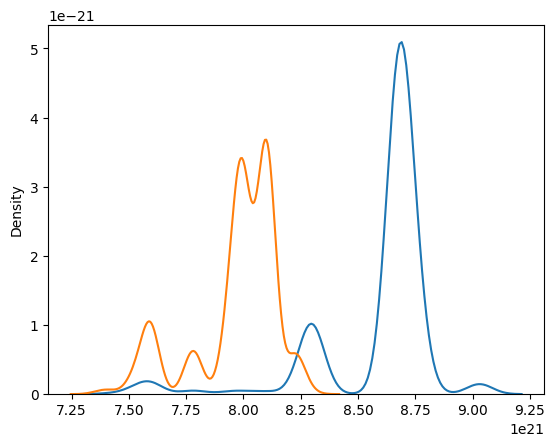

In [ ]:
sns.kdeplot(fmax[np.ravel(ttr2x.posterior.thr.values).astype(int)])
sns.kdeplot(fmax[np.ravel(ttrb2x.posterior.thr.values).astype(int)])

<Axes: ylabel='Density'>

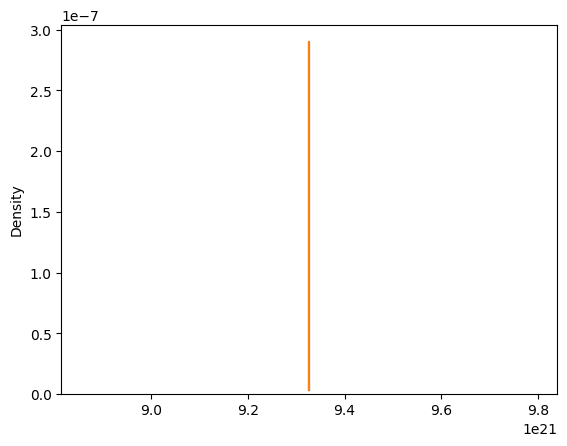

In [ ]:
sns.kdeplot(np.ravel(ttr2x.posterior['thr'].values))
sns.kdeplot(np.ravel(ttrb2x.posterior['thr'].values))
#sns.kdeplot(np.ravel(ttrb0x.posterior['b'].values))

In [ ]:
np.stack(ttr2x.posterior.sigma.values)

array([[[ 6.06879807,  6.12855822,  7.26913133, ..., 21.5434676 ,
         22.89122348, 23.30320833],
        [ 6.41781746,  6.61366023,  6.76104746, ..., 21.45099627,
         21.48485878, 24.64338663],
        [ 6.86542952,  6.34441312,  6.74373633, ..., 18.67427065,
         21.54981789, 26.36214491],
        ...,
        [ 6.75960588,  7.10363061,  6.8887527 , ..., 20.17474843,
         22.25218166, 25.95579916],
        [ 6.64355416,  5.91137676,  6.87148512, ..., 22.71715369,
         21.67054363, 25.51017925],
        [ 5.94112559,  6.8577559 ,  6.5244004 , ..., 21.49087294,
         20.97500708, 22.81296652]],

       [[ 6.1899661 ,  6.59453452,  6.18172666, ..., 19.23810171,
         21.80052692, 23.76847407],
        [ 6.21521273,  6.71920785,  6.85145979, ..., 21.68298288,
         22.72325058, 23.86541708],
        [ 6.35453278,  6.64374982,  6.70513509, ..., 20.9545344 ,
         25.37614587, 24.40038365],
        ...,
        [ 6.04441864,  6.0164507 ,  7.25638184, ..., 1

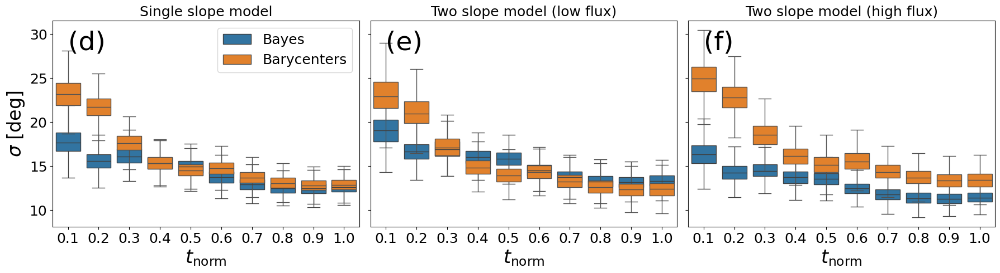

In [ ]:

f,ax = plt.subplots(1,3,figsize=(18,5),sharey=True)

ax=np.ravel(ax)


for i,s in enumerate(['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10']):
  sns.boxplot(y=np.ravel(ttr0x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None,ax=ax[0],label='Bayes')
  sns.boxplot(y=np.ravel(ttrb0x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None,ax=ax[0],label='Barycenters')

  sns.boxplot(y=np.ravel(ttr1x.posterior['sigma_low'].values)*np.ravel(ttr1x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None,ax=ax[1])
  sns.boxplot(y=np.ravel(ttrb1x.posterior['sigma_low'].values)*np.ravel(ttrb1x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None,ax=ax[1])

  sns.boxplot(y=np.ravel(ttr1x.posterior['sigma_high'].values)*np.ravel(ttr1x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None,ax=ax[2])
  sns.boxplot(y=np.ravel(ttrb1x.posterior['sigma_high'].values)*np.ravel(ttrb1x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None,ax=ax[2])


for i,ax1 in enumerate(ax):
  ax1.tick_params(axis='both', labelsize=18)
  ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=24)
  ax1.text(0.05,0.86,f'({chr(97+i+3)})',transform=ax1.transAxes,fontsize=34)

ax[0].set_title('Single slope model',fontsize=18)
ax[1].set_title('Two slope model (low flux)',fontsize=18)
ax[2].set_title('Two slope model (high flux)',fontsize=18)



h,l=ax[0].get_legend_handles_labels()
ax[0].legend(labels=l[:2],fontsize=18)
ax[0].set_ylabel(r'$\sigma$ [deg]',fontsize=24)



f.tight_layout()

f.savefig('/content/plot-tilt-stats/figures/sigma-posterior.pdf',dpi=300)

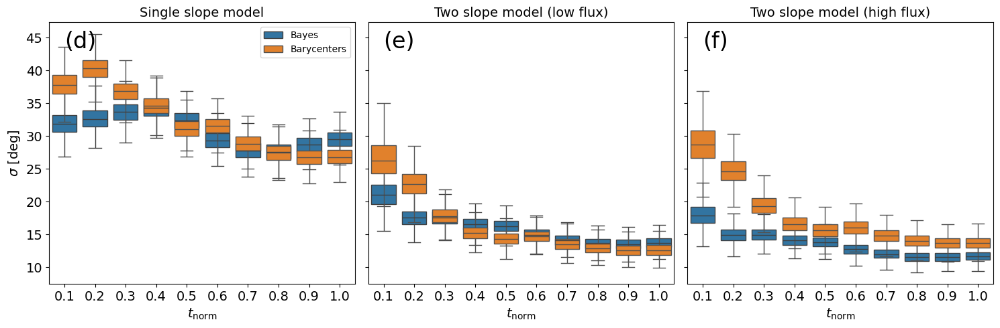

In [ ]:

f,ax = plt.subplots(1,3,figsize=(18,5),sharey=True)

ax=np.ravel(ax)


for i,s in enumerate(['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10']):
  sns.boxplot(y=np.ravel(ttr2x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None,ax=ax[0],label='Bayes')
  sns.boxplot(y=np.ravel(ttrb2x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None,ax=ax[0],label='Barycenters')

  sns.boxplot(y=np.ravel(ttr1x.posterior['sigma_low'].values)*np.ravel(ttr1x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None,ax=ax[1])
  sns.boxplot(y=np.ravel(ttrb1x.posterior['sigma_low'].values)*np.ravel(ttrb1x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None,ax=ax[1])

  sns.boxplot(y=np.ravel(ttr1x.posterior['sigma_high'].values)*np.ravel(ttr1x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None,ax=ax[2])
  sns.boxplot(y=np.ravel(ttrb1x.posterior['sigma_high'].values)*np.ravel(ttrb1x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None,ax=ax[2])


for i,ax1 in enumerate(ax):
  ax1.tick_params(axis='both', labelsize=14)
  ax1.set_xlabel(r'$t_\mathrm{norm}$',fontsize=14)
  ax1.text(0.05,0.9,f'({chr(97+i+3)})',transform=ax1.transAxes,fontsize=24)

ax[0].set_title('Single slope model',fontsize=14)
ax[1].set_title('Two slope model (low flux)',fontsize=14)
ax[2].set_title('Two slope model (high flux)',fontsize=14)



h,l=ax[0].get_legend_handles_labels()
ax[0].legend(labels=l[:2])
ax[0].set_ylabel(r'$\sigma$ [deg]',fontsize=14)



f.tight_layout()

#f.savefig('/content/plot-tilt-stats/figures/sigma-posterior.pdf',dpi=300)

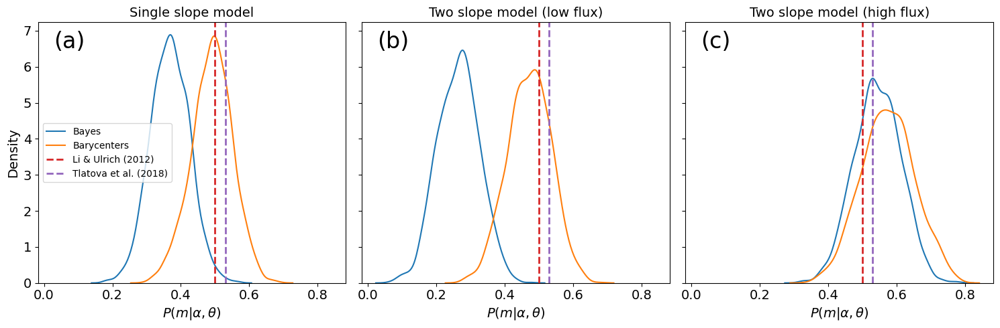

In [ ]:
f,ax = plt.subplots(1,3,figsize=(15,5),sharey=True,sharex=True)

ax=np.ravel(ax)

sns.kdeplot(np.ravel(ttr0x.posterior['a'].values),color='tab:blue',ax=ax[0],label='Bayes')
sns.kdeplot(np.ravel(ttrb0x.posterior['a'].values),color='tab:orange',ax=ax[0],label='Barycenters')

sns.kdeplot(np.ravel(ttr1x.posterior['a_low'].values),color='tab:blue',ax=ax[1],label='Bayes')
sns.kdeplot(np.ravel(ttrb1x.posterior['a_low'].values),color='tab:orange',ax=ax[1],label='Barycenters')

sns.kdeplot(np.ravel(ttr1x.posterior['a_high'].values),color='tab:blue',ax=ax[2],label='Bayes')
sns.kdeplot(np.ravel(ttrb1x.posterior['a_high'].values),color='tab:orange',ax=ax[2],label='Barycenters')



for i,ax1 in enumerate(ax):
  ax1.tick_params(axis='both', labelsize=14)
  ax1.set_xlabel(r'$P(m|\alpha,\theta)$',fontsize=14)
  ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)
  ax1.axvline(0.5,linestyle='--',color='tab:red',linewidth=2,label='Li & Ulrich (2012)')
  ax1.axvline(0.53,linestyle='--',color='tab:purple',linewidth=2,label='Tlatova et al. (2018)')

ax[0].set_title('Single slope model',fontsize=14)
ax[1].set_title('Two slope model (low flux)',fontsize=14)
ax[2].set_title('Two slope model (high flux)',fontsize=14)



h,l=ax[0].get_legend_handles_labels()
ax[0].legend(labels=l)
ax[0].set_ylabel(r'Density',fontsize=14)



f.tight_layout()

f.savefig('/content/plot-tilt-stats/figures/m-posterior.pdf',dpi=300)

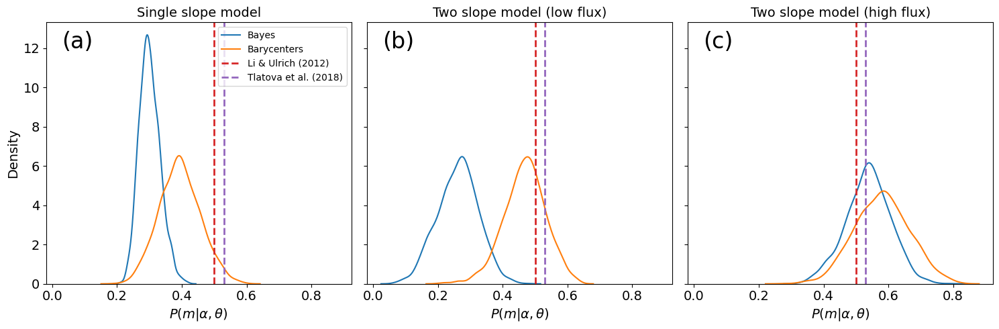

In [ ]:
f,ax = plt.subplots(1,3,figsize=(15,5),sharey=True,sharex=True)

ax=np.ravel(ax)

sns.kdeplot(np.ravel(ttr2x.posterior['a'].values),color='tab:blue',ax=ax[0],label='Bayes')
sns.kdeplot(np.ravel(ttrb2x.posterior['a'].values),color='tab:orange',ax=ax[0],label='Barycenters')

sns.kdeplot(np.ravel(ttr1x.posterior['a_low'].values),color='tab:blue',ax=ax[1],label='Bayes')
sns.kdeplot(np.ravel(ttrb1x.posterior['a_low'].values),color='tab:orange',ax=ax[1],label='Barycenters')

sns.kdeplot(np.ravel(ttr1x.posterior['a_high'].values),color='tab:blue',ax=ax[2],label='Bayes')
sns.kdeplot(np.ravel(ttrb1x.posterior['a_high'].values),color='tab:orange',ax=ax[2],label='Barycenters')



for i,ax1 in enumerate(ax):
  ax1.tick_params(axis='both', labelsize=14)
  ax1.set_xlabel(r'$P(m|\alpha,\theta)$',fontsize=14)
  ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)
  ax1.axvline(0.5,linestyle='--',color='tab:red',linewidth=2,label='Li & Ulrich (2012)')
  ax1.axvline(0.53,linestyle='--',color='tab:purple',linewidth=2,label='Tlatova et al. (2018)')

ax[0].set_title('Single slope model',fontsize=14)
ax[1].set_title('Two slope model (low flux)',fontsize=14)
ax[2].set_title('Two slope model (high flux)',fontsize=14)



h,l=ax[0].get_legend_handles_labels()
ax[0].legend(labels=l)
ax[0].set_ylabel(r'Density',fontsize=14)



f.tight_layout()

#f.savefig('/content/plot-tilt-stats/figures/m-posterior.pdf',dpi=300)

In [ ]:
az.summary(ttr1x,var_names=['a_low','a_high','b','sigma_low','sigma_high'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_low,0.261,0.064,0.143,0.377,0.003,0.002,494.0,601.0,1.00
a_high,0.538,0.071,0.396,0.662,0.004,0.002,401.0,548.0,1.00
b,1.039,1.149,-1.078,3.203,0.058,0.035,392.0,693.0,1.00
sigma_low,3.534,0.828,2.110,5.014,0.064,0.053,177.0,172.0,1.02
sigma_high,3.007,0.704,1.780,4.265,0.056,0.044,168.0,171.0,1.02


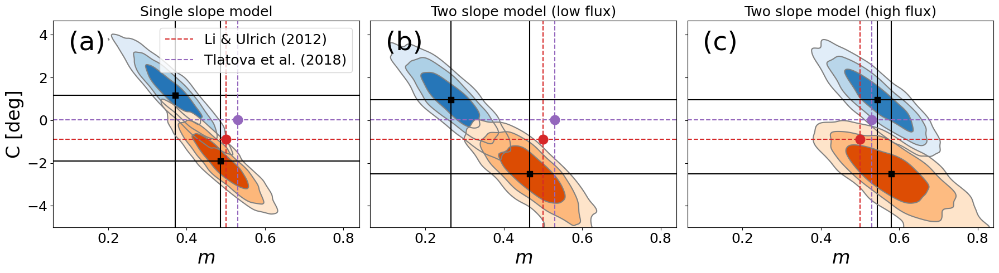

In [ ]:
f,ax = plt.subplots(1,3,figsize=(18,5),sharey=True,sharex=True)
ax=np.ravel(ax)

az.plot_pair(ttr0x,var_names=['a','b'],kind='kde',point_estimate='mean',ax=ax[0],
             kde_kwargs={"contourf_kwargs":{"colors":None, "cmap":plt.cm.Blues}})
az.plot_pair(ttrb0x,var_names=['a','b'],kind='kde',point_estimate='mean',ax=ax[0],
             kde_kwargs={"contourf_kwargs":{"colors":None, "cmap":plt.cm.Oranges}})

az.plot_pair(ttr1x,var_names=['a_low','b'],kind='kde',point_estimate='mean',ax=ax[1],
             kde_kwargs={"contourf_kwargs":{"colors":None, "cmap":plt.cm.Blues}})
az.plot_pair(ttr1x,var_names=['a_high','b'],kind='kde',point_estimate='mean',ax=ax[2],
             kde_kwargs={"contourf_kwargs":{"colors":None, "cmap":plt.cm.Blues}})

az.plot_pair(ttrb1x,var_names=['a_low','b'],kind='kde',point_estimate='mean',ax=ax[1],
             kde_kwargs={"contourf_kwargs":{"colors":None, "cmap":plt.cm.Oranges}})
az.plot_pair(ttrb1x,var_names=['a_high','b'],kind='kde',point_estimate='mean',ax=ax[2],
             kde_kwargs={"contourf_kwargs":{"colors":None, "cmap":plt.cm.Oranges}})

for i,ax1 in enumerate(ax):
  ax1.tick_params(axis='both', labelsize=18)
  ax1.text(0.05,0.86,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=34)
  ax1.set_xlabel(r'$m$',fontsize=24)
  ax1.axvline(0.5,linestyle='--',color='tab:red',label='Li & Ulrich (2012)')
  ax1.axvline(0.53,linestyle='--',color='tab:purple',label='Tlatova et al. (2018)')
  ax1.axhline(-0.9,linestyle='--',color='tab:red')
  ax1.axhline(0.01,linestyle='--',color='tab:purple')
  ax1.plot(0.5,-0.9,marker='o',color='tab:red',markersize=12)
  ax1.plot(0.53,0.01,marker='o',color='tab:purple',markersize=12)

ax[0].set_title('Single slope model',fontsize=18)
ax[1].set_title('Two slope model (low flux)',fontsize=18)
ax[2].set_title('Two slope model (high flux)',fontsize=18)

for ax1 in ax[1:]:
  ax1.set_ylabel('')



ax[0].set_ylabel('C [deg]',fontsize=24)
ax[0].legend(fontsize=18)

f.tight_layout()

f.savefig('/content/plot-tilt-stats/figures/m-posterior-pair.pdf',dpi=300)

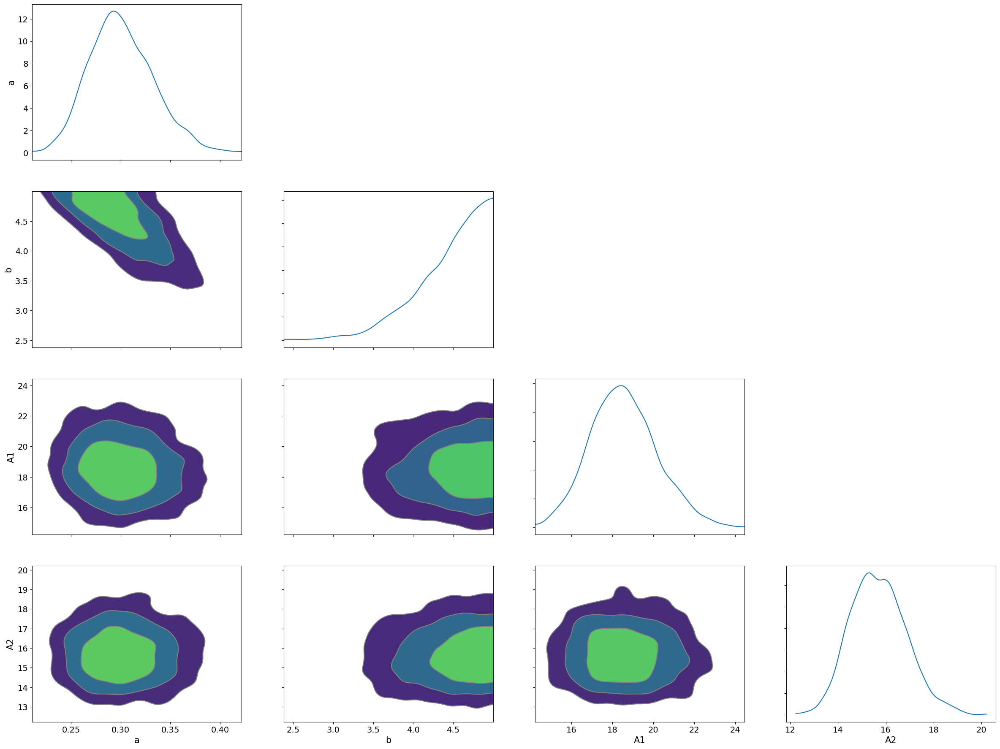

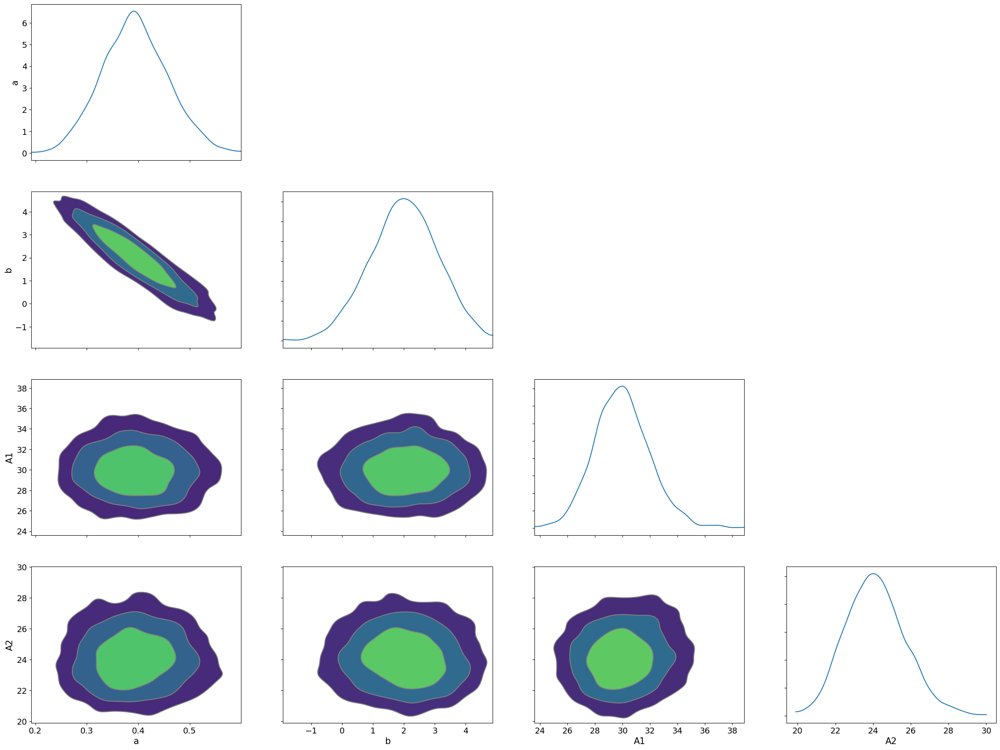

In [ ]:
az.plot_pair(ttr2x,var_names=['a','b','A1','A2'],kind='kde',marginals=True)
plt.show()
az.plot_pair(ttrb2x,var_names=['a','b','A1','A2'],kind='kde',marginals=True)
plt.show()


In [ ]:
ida_alpha = ttr1x      # example name from your script
ida_alphab = ttrb1x

loo_alpha = az.loo(ida_alpha, pointwise=True)
loo_alphab = az.loo(ida_alphab, pointwise=True)

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


In [ ]:
loo_alpha

,0
elpd_loo,-3948.240772
se,27.510079
p_loo,18.257742
n_samples,2000
n_data_points,966
warning,True
loo_i,[<xarray.DataArray 'loo_i' ()> Size: 8B\narray...
pareto_k,[<xarray.DataArray 'pareto_shape' ()> Size: 8B...
scale,log
good_k,0.697064


/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


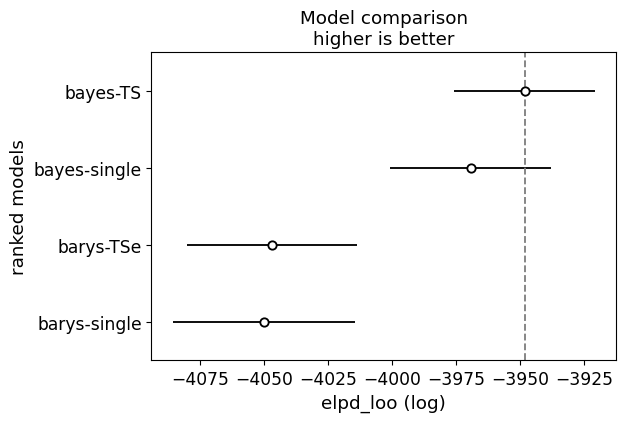

In [ ]:
df_comp_loo = az.compare({"bayes-single": ttr0x, "barys-single": ttrb0x,"bayes-TS": ttr1x, "barys-TSe": ttrb1x})
az.plot_compare(df_comp_loo, insample_dev=False);

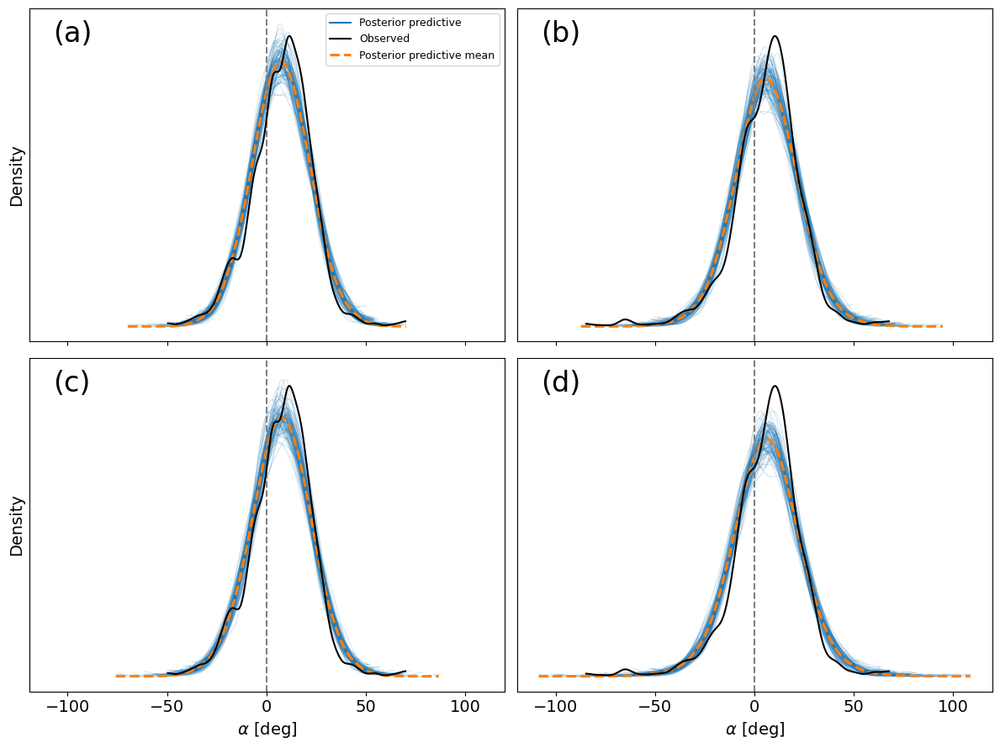

In [ ]:
f,ax=plt.subplots(2,2,figsize=(12,9),sharex=True,sharey=True)
ax=np.ravel(ax)

az.plot_ppc(ppc0x, num_pp_samples=100,ax=ax[0])
az.plot_ppc(ppcb0x, num_pp_samples=100,ax=ax[1])

az.plot_ppc(ppc1x, num_pp_samples=100,ax=ax[2])
az.plot_ppc(ppcb1x, num_pp_samples=100,ax=ax[3])

for ax1 in ax[1:]:
  ax1.legend().remove()

ax[0].legend(fontsize=9)

for i,ax1 in enumerate(ax):
  ax1.axvline(0,linestyle='--',color='gray',linewidth=1.5)
  ax1.tick_params(axis='both', labelsize=14)
  ax1.text(0.05,0.9,f'({chr(97+i)})',transform=ax1.transAxes,fontsize=24)

for i,ax1 in enumerate(ax[2:]):
  ax1.set_xlabel(r'$\alpha$ [deg]',fontsize=14)
for i,ax1 in enumerate(ax[::2]):
  ax1.set_ylabel(r'Density',fontsize=14)
for i,ax1 in enumerate(ax[:2]):
  ax1.set_xlabel('')

f.tight_layout()

array(<Axes: title={'center': 'alpha_obs'}>, dtype=object)

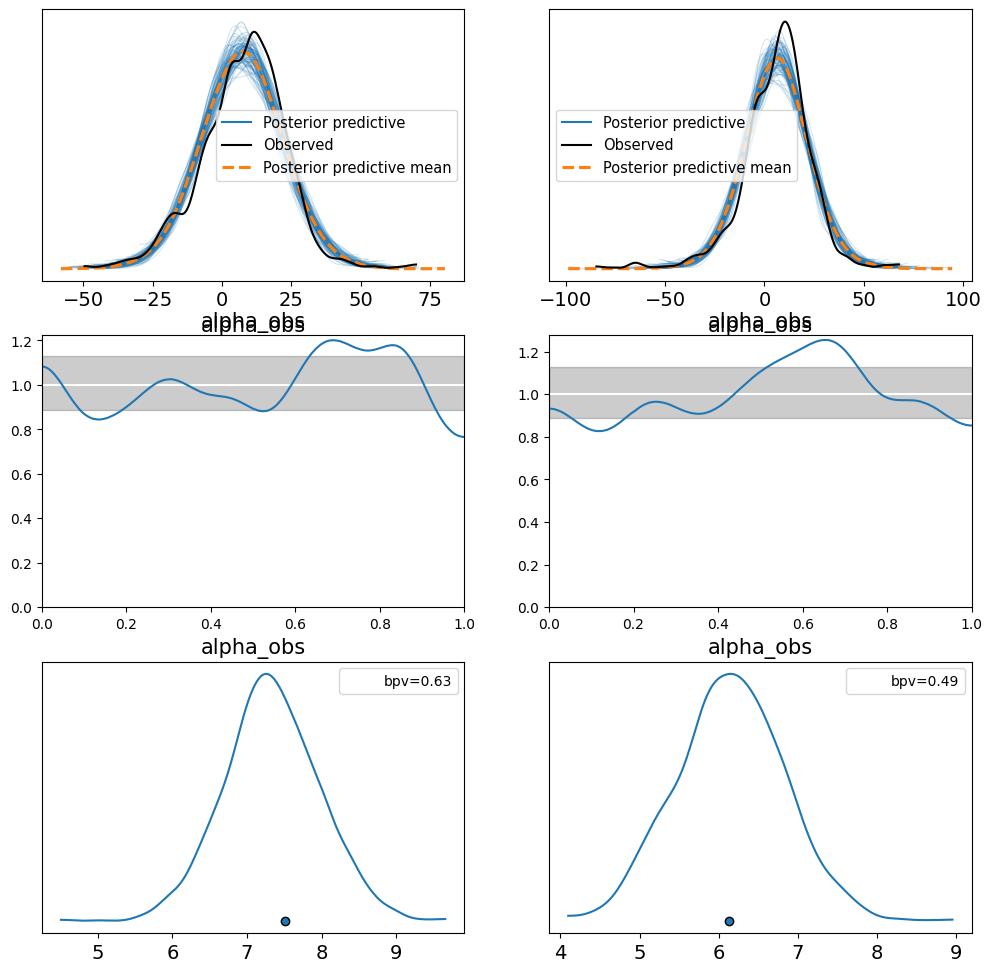

In [ ]:
f,ax=plt.subplots(3,2,figsize=(12,12))
ax=np.ravel(ax)

az.plot_ppc(ppc0x, num_pp_samples=100,ax=ax[0])
az.plot_ppc(ppcb0x, num_pp_samples=100,ax=ax[1])

#az.plot_ppc(ppc0, num_pp_samples=100,ax=ax[2])
#az.plot_ppc(ppcb0, num_pp_samples=100,ax=ax[3])

az.plot_bpv(ppc0x, kind="u_value",ax=ax[2])
az.plot_bpv(ppcb0x, kind="u_value",ax=ax[3])

az.plot_bpv(ppc0x, kind="t_stat",ax=ax[4], t_stat='mean',bpv=True)
az.plot_bpv(ppcb0x, kind="t_stat",ax=ax[5], t_stat='mean',bpv=True)

In [ ]:
ppc1x

Inference data with groups:
	> posterior_predictive
	> observed_data

array(<Axes: title={'center': 'alpha_obs'}>, dtype=object)

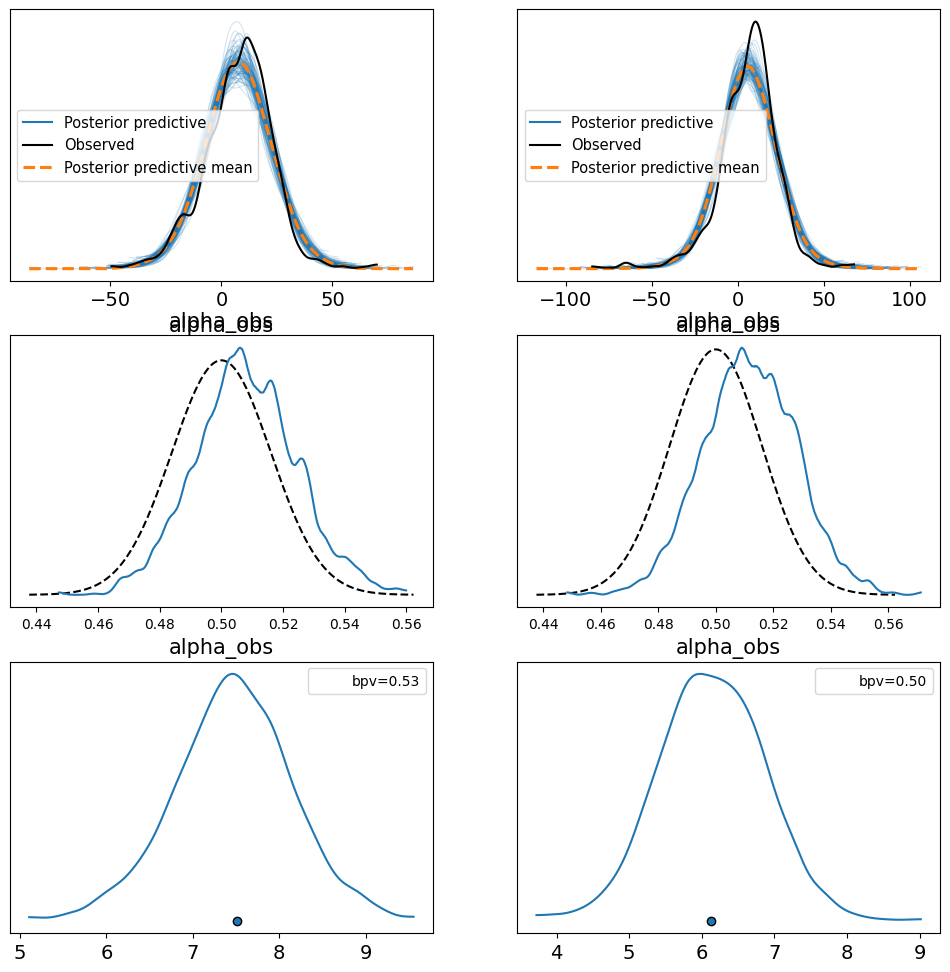

In [ ]:
f,ax=plt.subplots(3,2,figsize=(12,12))
ax=np.ravel(ax)

az.plot_ppc(ppc1x, num_pp_samples=100,ax=ax[0])
az.plot_ppc(ppcb1x, num_pp_samples=100,ax=ax[1])

#az.plot_ppc(ppc0, num_pp_samples=100,ax=ax[2])
#az.plot_ppc(ppcb0, num_pp_samples=100,ax=ax[3])

az.plot_bpv(ppc1x, kind="p_value",ax=ax[2])
az.plot_bpv(ppcb1x, kind="p_value",ax=ax[3])

az.plot_bpv(ppc1x, kind="t_stat",ax=ax[4], t_stat='mean',bpv=True)
az.plot_bpv(ppcb1x, kind="t_stat",ax=ax[5], t_stat='mean',bpv=True)

In [ ]:
def JOYMODEL(alpha,theta):

    # Model
    with pm.Model() as joy_model:
        a = pm.Uniform('a', 0, 1)
        b = pm.Uniform('b', -5, 5)
        sigma = pm.HalfNormal('sigma', 5)

        mu = a * theta + b
        alpha_obs = pm.Normal('alpha_obs', mu, sigma, observed=alpha)

        trace = pm.sample(idata_kwargs={'log_likelihood':True})
        ppc = pm.sample_posterior_predictive(trace)

    # Posterior predictive check
    #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

    return ppc,trace

def JOYMODELC(alpha,theta,fmax):

    # Model
    with pm.Model() as joy_model:
        a = pm.Uniform('a', 0, 1)
        b = pm.Uniform('b', -5, 5)
        fm = pm.Normal('fm', mu=np.median(fmax), sigma=np.std(fmax))
        sigma0 = pm.HalfNormal('sigma0', 5)
        sigma = pm.Deterministic('sigma',sigma0/(1+fm/fmax))


        mu = a * theta + b
        alpha_obs = pm.Normal('alpha_obs', mu, sigma, observed=alpha)

        trace = pm.sample(idata_kwargs={'log_likelihood':True})
        ppc = pm.sample_posterior_predictive(trace)

    # Posterior predictive check
    #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

    return ppc,trace


def JOYMODELB(alpha,theta,rep):

    # Model
    with pm.Model() as joy_model:
        a = pm.Uniform('a', 0, 1)
        b = pm.Uniform('b', -5, 5)

            # Variables independientes
        A1 = pm.HalfNormal('A1', sigma=5)
        A2 = pm.HalfNormal('A2', sigma=5)
        A3 = pm.HalfNormal('A3', sigma=5)
        A4 = pm.HalfNormal('A4', sigma=5)
        A5 = pm.HalfNormal('A5', sigma=5)
        A6 = pm.HalfNormal('A6', sigma=5)
        A7 = pm.HalfNormal('A7', sigma=5)
        A8 = pm.HalfNormal('A8', sigma=5)
        A9 = pm.HalfNormal('A9', sigma=5)
        A10 = pm.HalfNormal('A10', sigma=5)
        #A11 = pm.HalfNormal('A11', sigma=5)

        # Construcción del vector
        A_vec = pm.Deterministic(
            'A_vec',
            pm.math.concatenate([
                pytensor.tensor.extra_ops.repeat(A1, rep[0]),
                pytensor.tensor.extra_ops.repeat(A2, rep[1]),
                pytensor.tensor.extra_ops.repeat(A3, rep[2]),
                pytensor.tensor.extra_ops.repeat(A4, rep[3]),
                pytensor.tensor.extra_ops.repeat(A5, rep[4]),
                pytensor.tensor.extra_ops.repeat(A6, rep[5]),
                pytensor.tensor.extra_ops.repeat(A7, rep[6]),
                pytensor.tensor.extra_ops.repeat(A8, rep[7]),
                pytensor.tensor.extra_ops.repeat(A9, rep[8]),
                pytensor.tensor.extra_ops.repeat(A10, rep[9])
             #   pytensor.tensor.extra_ops.repeat(A11, rep[10])
            ])
        )



        #sigma = pm.HalfNormal('sigma', 5)

        mu = a * theta + b
        alpha_obs = pm.Normal('alpha_obs', mu, A_vec, observed=alpha)

        trace = pm.sample(idata_kwargs={'log_likelihood':True})
        ppc = pm.sample_posterior_predictive(trace)

    # Posterior predictive check
    #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

    return ppc,trace



def JOYMODEL2(alpha,theta):

    # Model
    with pm.Model() as joy_model:
        a = pm.Uniform('a', 0, 1)
        b = pm.Normal('b', mu=0, sigma=0.5)
        sigma = pm.HalfNormal('sigma', 5,shape=10)

        mu = a * theta + b
        alpha_obs = pm.Normal('alpha_obs', mu, sigma, observed=alpha)

        trace = pm.sample()
        ppc = pm.sample_posterior_predictive(trace)

    # Posterior predictive check
    #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

    return ppc,trace

def JOYMODEL3(alpha,theta):

    # Model
    with pm.Model() as joy_model:
        a = pm.Uniform('a', 0, 50)
        b = pm.Normal('b', mu=0, sigma=1)
        sigma = pm.HalfNormal('sigma', 5)

        mu = a * np.sin(np.deg2rad(theta))+b
        alpha_obs = pm.Normal('alpha_obs', mu, sigma, observed=alpha)

        trace = pm.sample(idata_kwargs={'log_likelihood':True})
        ppc = pm.sample_posterior_predictive(trace)

    # Posterior predictive check
    #az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=joy_model))

    return ppc,trace

def JOYMODEL_TWO_SLOPES(alpha, theta, fmax, threshold=None):

      # Si no das un threshold, usa la mediana
      if threshold is None:
          threshold = np.median(np.unique(fmax))



      with pm.Model() as joy_model:

          # Intercepto
          b = pm.Normal('b', mu=0, sigma=10)

          # Dos pendientes distintas
          a_low  = pm.Normal('a_low',  mu=0.3, sigma=0.3)
          a_high = pm.Normal('a_high', mu=0.3, sigma=0.3)
          thr=pm.Uniform('thr',0.5,2)

          # Vector binario: 0 o 1
          group = (fmax/threshold > thr).astype(int)

          # Ensamblar pendiente por observación
          # a_i = a_low si group[i] = 0
          # a_i = a_high si group[i] = 1
          a_i = pm.Deterministic('a_i', a_low*(1 - group) + a_high*group)
          sigma_low=pm.HalfNormal('sigma_low',5)
          sigma_high=pm.HalfNormal('sigma_high',5)
          # Modelo del sigma dependiente de fmax (como tenías)
          sigma = pm.Deterministic('sigma', sigma_low*(1 - group) + sigma_high*group)
          #sigma = pm.HalfNormal('sigma', 5)
          #sigma  = pm.Deterministic('sigma', sigma0 / (1 + fmax / np.median(fmax)))

          # Media del modelo
          mu = a_i * theta + b

          # Likelihood
          alpha_obs = pm.Normal('alpha_obs', mu=mu, sigma=sigma, observed=alpha)

          # Sample posterior
          trace = pm.sample(idata_kwargs={'log_likelihood': True})
          ppc = pm.sample_posterior_predictive(trace)

      return ppc, trace


In [ ]:
ppc0,ttr0=JOYMODEL(np.array(alpha).T,np.array(theta).T)
ppcb0,ttrb0=JOYMODEL(np.array(alphab).T,np.array(theta).T)
#ppc0x,ttr0x=JOYMODELB(np.array(alpha).T,np.array(theta).T,rep)
#ppcb0x,ttrb0x=JOYMODELB(np.array(alphab).T,np.array(theta).T,rep)


ppcc,ttrc=JOYMODEL_TWO_SLOPES(np.array(alpha).T,np.array(theta).T,np.array(fmax).T)
ppcbc,ttrbc=JOYMODEL_TWO_SLOPES(np.array(alphab).T,np.array(theta).T,np.array(fmax).T)

#ppc1,ttr1=JOYMODEL3(np.array(alpha).T,np.array(theta).T)
#ppcb1,ttrb1=JOYMODEL3(np.array(alphab).T,np.array(theta).T)

Output()

Output()

Output()

Output()

Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Output()

Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Output()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az

def JOYMODEL_TWO_SLOPES_SMOOTH(alpha, theta, fmax, standardize=True, target_accept=0.95):
    """
    Modelo Bayesiano: alpha ~ Normal(mu = a(theta)*theta + b, sigma(fmax))
    donde a(theta) es mezcla suave entre a_low y a_high usando una sigmoid dependiente del flujo fmax.
    """

    # Opcional: estandarizar para estabilidad numérica
    alpha = np.asarray(alpha)
    theta = np.asarray(theta)
    fmax = np.asarray(fmax)

    if standardize:
        theta_mean, theta_std = theta.mean(), theta.std()
        alpha_mean, alpha_std = alpha.mean(), alpha.std()

        theta_s = (theta - theta_mean) / (theta_std if theta_std>0 else 1.0)
        alpha_s = (alpha - alpha_mean) / (alpha_std if alpha_std>0 else 1.0)
        fmax_s = (fmax - fmax.mean()) / (fmax.std() if fmax.std()>0 else 1.0)
    else:
        theta_s, alpha_s, fmax_s = theta, alpha, fmax

    with pm.Model() as model:
        # intercept
        b = pm.Normal('b', mu=0.0, sigma=1.0)

        # two slopes
        a_low  = pm.Uniform('a_low', 0, 1.0)
        a_high = pm.Uniform('a_high', 0, 1.0)

        # smooth gating: threshold and steepness
        thr = pm.Uniform('thr', 0.7, 3)      # on standardized fmax
        #k   = pm.HalfNormal('k', sigma=2.0)            # steepness (>0)

        # sigmoid gating per observation (use pm.math.expit)
        s = pm.Deterministic('s', pm.math.sigmoid(10 * (fmax_s/np.median(fmax_s) - thr)))

        # observation-specific slope
        a_i = pm.Deterministic('a_i', a_low * (1 - s) + a_high * s)

        # noise (can also be mixture or depend on fmax)
        sigma_low  = pm.HalfNormal('sigma_low', sigma=1.0)
        sigma_high = pm.HalfNormal('sigma_high', sigma=1.0)
        sigma_i = pm.Deterministic('sigma_i', sigma_low * (1 - s) + sigma_high * s)

        mu = a_i * theta_s + b

        obs = pm.Normal('alpha_obs', mu=mu, sigma=sigma_i, observed=alpha_s)

        trace = pm.sample(target_accept=target_accept)
        ppc = pm.sample_posterior_predictive(trace)

    # Si estandarizaste, devolvé también las estadísticas para reescalar
    if standardize:
        info = dict(theta_mean=theta_mean, theta_std=theta_std,
                    alpha_mean=alpha_mean, alpha_std=alpha_std)
    else:
        info = None

    return model, trace, ppc, info


In [ ]:
info

{'theta_mean': np.float64(16.648033126293996),
 'theta_std': np.float64(7.85784223163108),
 'alpha_mean': np.float64(7.5146392885227),
 'alpha_std': np.float64(15.002399792077115)}

In [ ]:
#mod2,ttrc2,ppc2,info=JOYMODEL_TWO_SLOPES_SMOOTH(np.array(alpha).T,np.array(theta).T,np.array(fmax).T,standardize=False)
modb2,ttrcb2,ppcb2,infob=JOYMODEL_TWO_SLOPES_SMOOTH(np.array(alphab).T,np.array(theta).T,np.array(fmax).T,standardize=False)

Output()

Output()

In [ ]:
az.summary(ttrc2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_high,0.065,0.051,0.000,0.159,0.001,0.001,1065.0,637.0,1.0
a_i[0],0.209,0.034,0.146,0.271,0.001,0.001,1750.0,1207.0,1.0
a_i[1],0.213,0.035,0.149,0.280,0.001,0.001,1658.0,1177.0,1.0
a_i[2],0.205,0.033,0.144,0.266,0.001,0.001,1864.0,1105.0,1.0
a_i[3],0.193,0.031,0.136,0.249,0.001,0.001,2083.0,1144.0,1.0
...,...,...,...,...,...,...,...,...,...
sigma_i[963],1.039,0.029,0.985,1.094,0.001,0.001,1460.0,1203.0,1.0
sigma_i[964],1.051,0.033,0.989,1.109,0.001,0.001,1297.0,1065.0,1.0
sigma_i[965],1.033,0.028,0.981,1.084,0.001,0.001,1580.0,1376.0,1.0
sigma_low,1.056,0.035,0.992,1.118,0.001,0.001,1246.0,1120.0,1.0


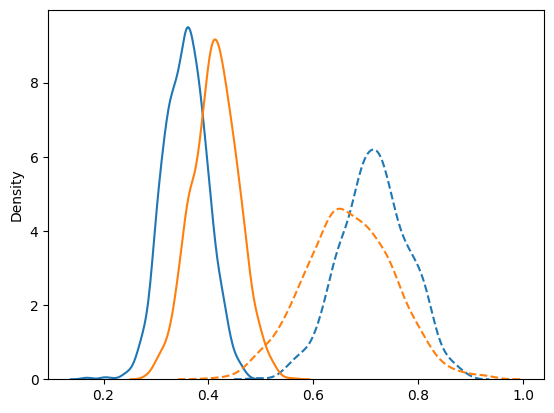

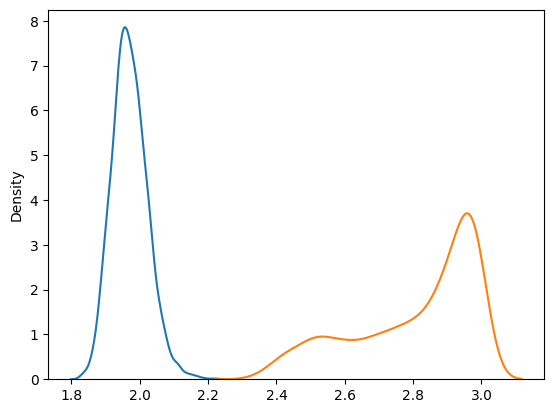

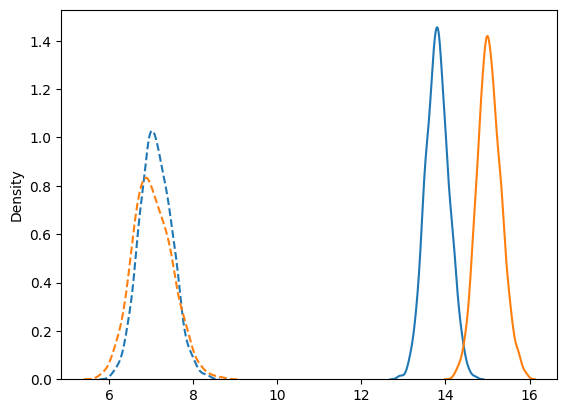

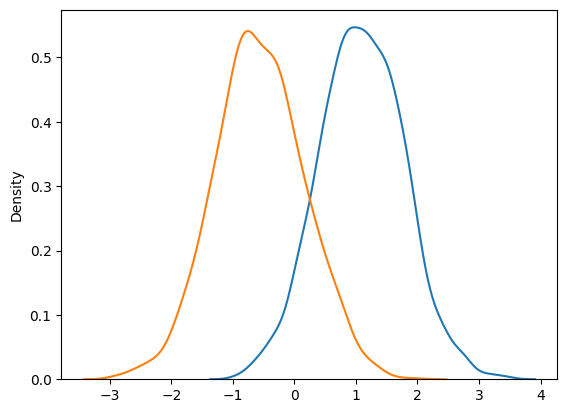

In [ ]:
sns.kdeplot(np.ravel(ttrc2.posterior.a_low.values))
sns.kdeplot(np.ravel(ttrc2.posterior.a_high.values),color='tab:blue',ls='--')

sns.kdeplot(np.ravel(ttrcb2.posterior.a_low.values))
sns.kdeplot(np.ravel(ttrcb2.posterior.a_high.values),color='tab:orange',ls='--')
plt.show()
sns.kdeplot(np.ravel(ttrc2.posterior.thr.values))
sns.kdeplot(np.ravel(ttrcb2.posterior.thr.values))

plt.show()

sns.kdeplot(np.ravel(ttrc2.posterior.sigma_low.values))
sns.kdeplot(np.ravel(ttrc2.posterior.sigma_high.values),color='tab:blue',ls='--')

sns.kdeplot(np.ravel(ttrcb2.posterior.sigma_low.values))
sns.kdeplot(np.ravel(ttrcb2.posterior.sigma_high.values),color='tab:orange',ls='--')
plt.show()

sns.kdeplot(np.ravel(ttrc2.posterior.b.values))
sns.kdeplot(np.ravel(ttrcb2.posterior.b.values))
plt.show()



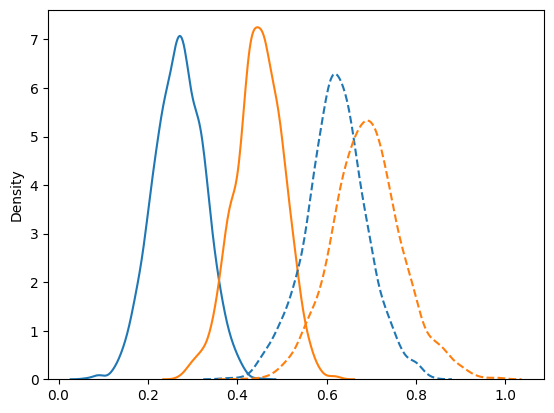

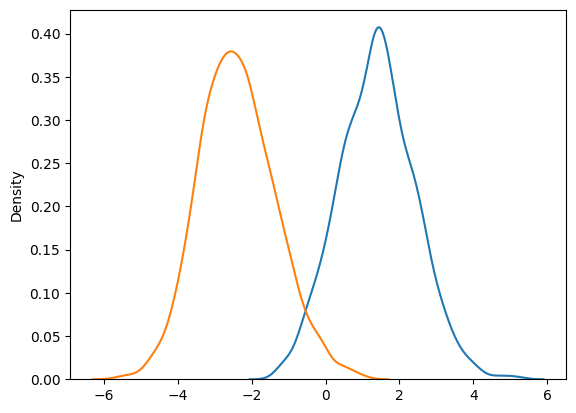

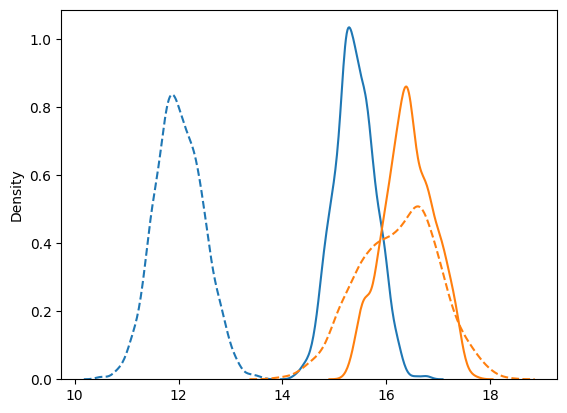

<Axes: ylabel='Density'>

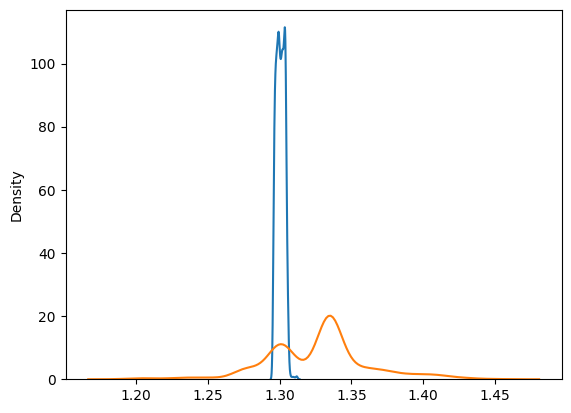

In [ ]:


sns.kdeplot(np.ravel(ttrc.posterior.a_low.values))
sns.kdeplot(np.ravel(ttrbc.posterior.a_low.values))

sns.kdeplot(np.ravel(ttrc.posterior.a_high.values),color='tab:blue',ls='--')
sns.kdeplot(np.ravel(ttrbc.posterior.a_high.values),color='tab:orange',ls='--')

plt.show()

sns.kdeplot(np.ravel(ttrc.posterior.b.values))
sns.kdeplot(np.ravel(ttrbc.posterior.b.values))

plt.show()


sns.kdeplot(np.ravel(ttrc.posterior.sigma_low.values))
sns.kdeplot(np.ravel(ttrbc.posterior.sigma_low.values))

sns.kdeplot(np.ravel(ttrc.posterior.sigma_high.values),color='tab:blue',ls='--')
sns.kdeplot(np.ravel(ttrbc.posterior.sigma_high.values),color='tab:orange',ls='--')

plt.show()

sns.kdeplot(np.ravel(ttrc.posterior.thr.values))
sns.kdeplot(np.ravel(ttrbc.posterior.thr.values))


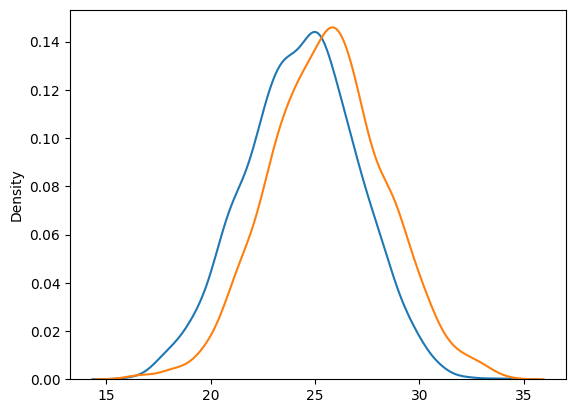

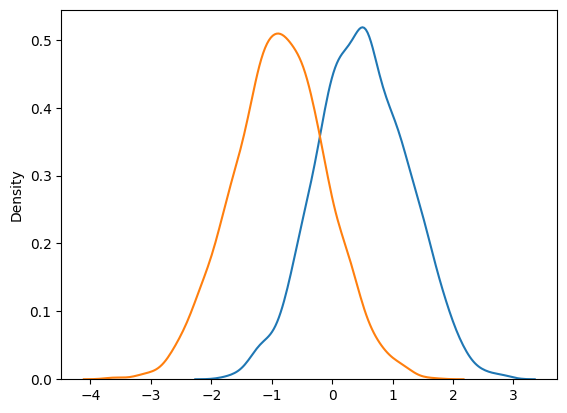

In [ ]:

sns.kdeplot(np.ravel(ttr1.posterior.a.values))
sns.kdeplot(np.ravel(ttrb1.posterior.a.values))

plt.show()

sns.kdeplot(np.ravel(ttr1.posterior.b.values))
sns.kdeplot(np.ravel(ttrb1.posterior.b.values))

plt.show()


In [ ]:
ppc0

Inference data with groups:
	> posterior_predictive
	> observed_data

In [ ]:
np.shape(ttr0.posterior.sigma.values[:].mean(axis=(0,1)))

(10,)

In [ ]:
ttr0x

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

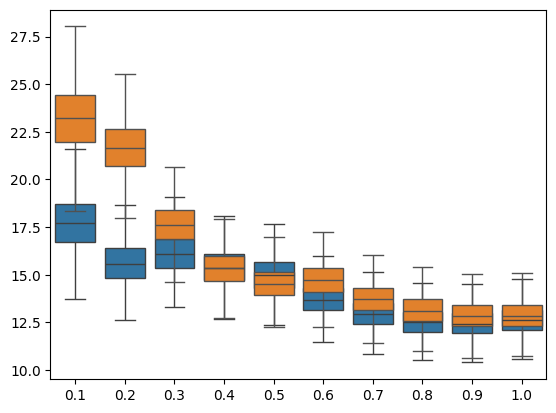

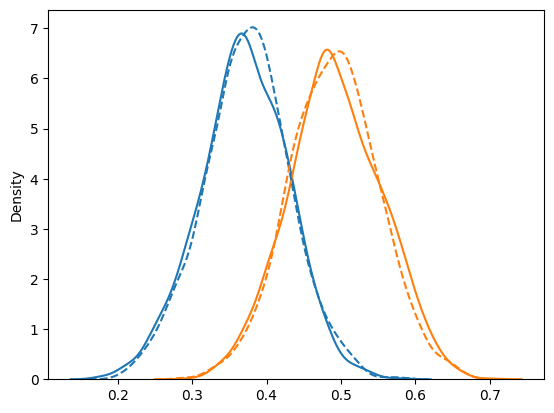

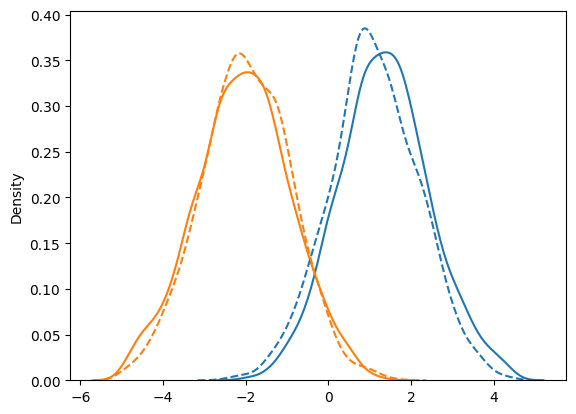

In [ ]:

for i,s in enumerate(['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10']):
  sns.boxplot(y=np.ravel(ttr0x.posterior[s].values),x=(i+1)/10,color='tab:blue',showfliers=None)
  sns.boxplot(y=np.ravel(ttrb0x.posterior[s].values),x=(i+1)/10,color='tab:orange',showfliers=None)

plt.show()

#  plt.plot(ttr0x.posterior.A_vec.values[:].mean(axis=(0,1)))
#  plt.plot(ttrb0x.posterior.A_vec.values[:].mean(axis=(0,1)))

#plt.plot(ttr1.posterior.sigma.values[:].mean(axis=(0,1)),color='tab:blue',ls='--')
#plt.plot(ttrb1.posterior.sigma.values[:].mean(axis=(0,1)),color='tab:orange',ls='--')
#sns.kdeplot(np.ravel(ttr0.posterior.sigma.values))
#sns.kdeplot(np.ravel(ttrb0.posterior.sigma.values))

plt.show()

sns.kdeplot(np.ravel(ttr0.posterior.a.values))

sns.kdeplot(np.ravel(ttrb0.posterior.a.values))
#sns.kdeplot(np.ravel(ttrc.posterior.a.values))


sns.kdeplot(np.ravel(ttr0x.posterior.a.values),color='tab:blue',ls='--')
sns.kdeplot(np.ravel(ttrb0x.posterior.a.values),color='tab:orange',ls='--')
#sns.kdeplot(np.ravel(ttrbc.posterior.a.values),color='tab:green',ls='--')

plt.show()

sns.kdeplot(np.ravel(ttr0.posterior.b.values))
sns.kdeplot(np.ravel(ttrb0.posterior.b.values))
#sns.kdeplot(np.ravel(ttrc.posterior.b.values))

sns.kdeplot(np.ravel(ttr0x.posterior.b.values),color='tab:blue',ls='--')
sns.kdeplot(np.ravel(ttrb0x.posterior.b.values),color='tab:orange',ls='--')
#sns.kdeplot(np.ravel(ttrbc.posterior.b.values),color='tab:green',ls='--')

plt.show()




<Axes: ylabel='Density'>

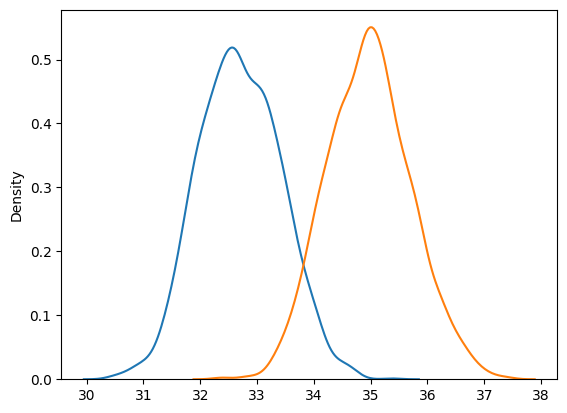

In [ ]:
sns.kdeplot(np.ravel(ttrc.posterior.sigma0.values))
sns.kdeplot(np.ravel(ttrbc.posterior.sigma0.values))

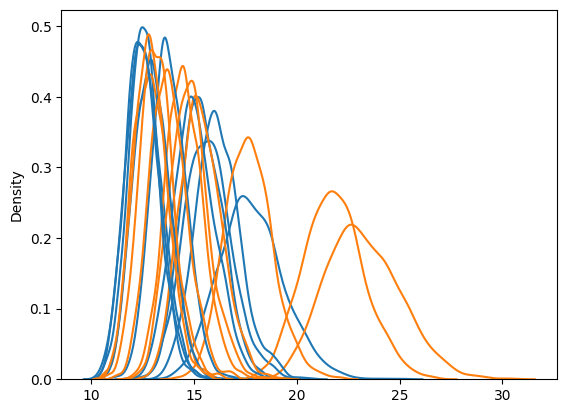

In [ ]:
for r in list(ttr0x.posterior.data_vars)[0:10]:
  sns.kdeplot(np.ravel(ttr0x.posterior[r].values),color='tab:blue')
  sns.kdeplot(np.ravel(ttrb0x.posterior[r].values),color='tab:orange')

array(<Axes: title={'center': 'alpha_obs'}>, dtype=object)

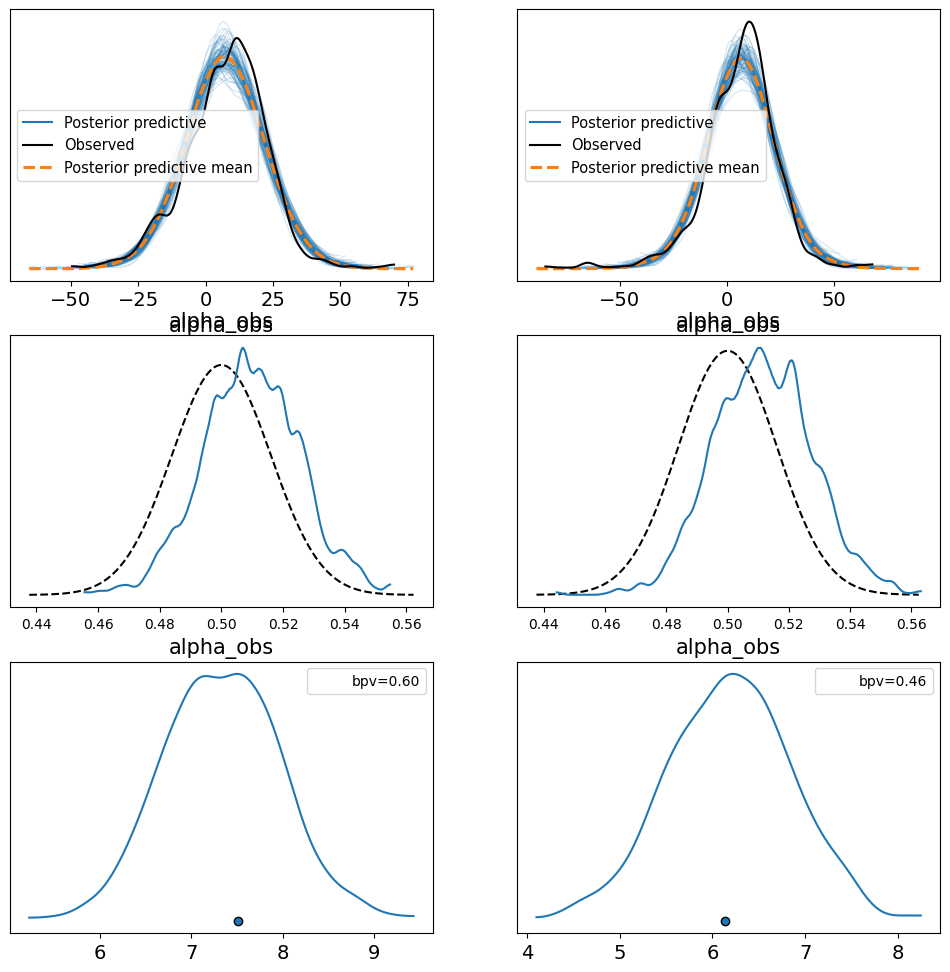

In [ ]:
f,ax=plt.subplots(3,2,figsize=(12,12))
ax=np.ravel(ax)

az.plot_ppc(ppc0x, num_pp_samples=100,ax=ax[0])
az.plot_ppc(ppcb0x, num_pp_samples=100,ax=ax[1])

#az.plot_ppc(ppc0, num_pp_samples=100,ax=ax[2])
#az.plot_ppc(ppcb0, num_pp_samples=100,ax=ax[3])

az.plot_bpv(ppc0x, kind="p_value",ax=ax[2])
az.plot_bpv(ppcb0x, kind="p_value",ax=ax[3])

az.plot_bpv(ppc0x, kind="t_stat",ax=ax[4], t_stat='mean',bpv=True)
az.plot_bpv(ppcb0x, kind="t_stat",ax=ax[5], t_stat='mean',bpv=True)

#az.plot_ppc(ppc1, num_pp_samples=100)
#az.plot_ppc(ppcb1, num_pp_samples=100)


array(<Axes: title={'center': 'alpha_obs'}>, dtype=object)

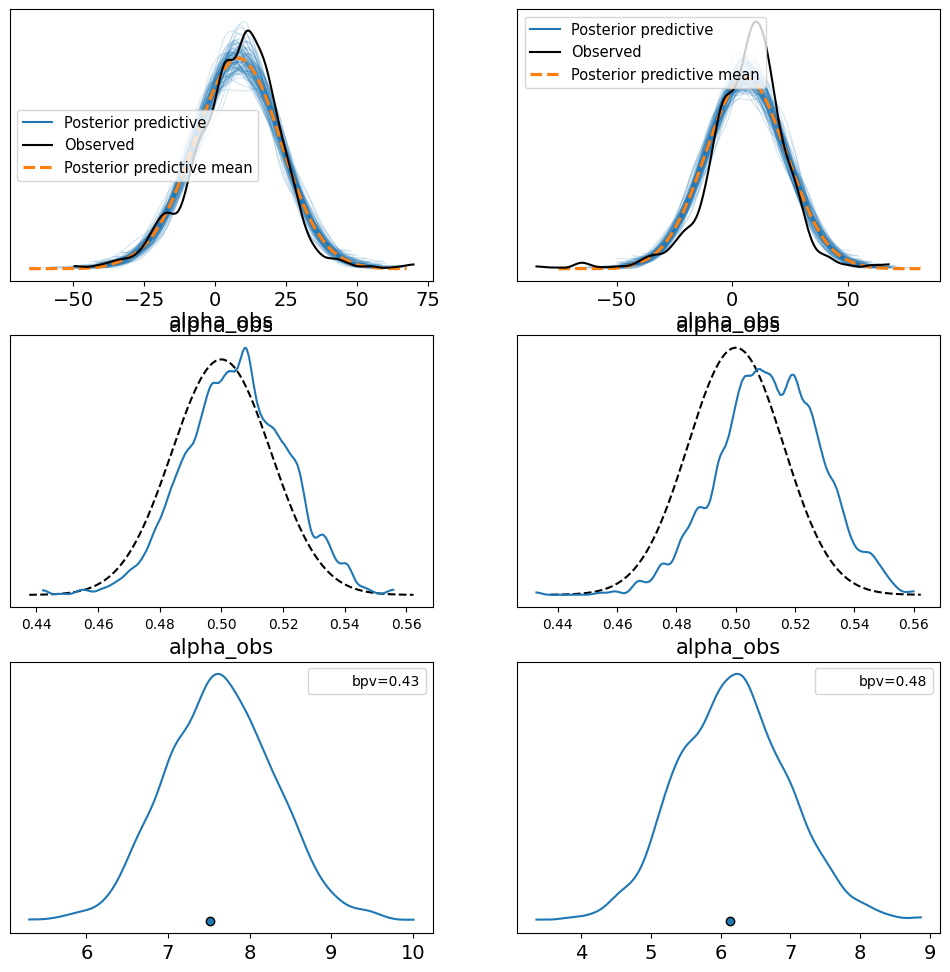

In [ ]:
f,ax=plt.subplots(3,2,figsize=(12,12))
ax=np.ravel(ax)

az.plot_ppc(ppcc, num_pp_samples=100,ax=ax[0])
az.plot_ppc(ppcbc, num_pp_samples=100,ax=ax[1])

#az.plot_ppc(ppc0, num_pp_samples=100,ax=ax[2])
#az.plot_ppc(ppcb0, num_pp_samples=100,ax=ax[3])

az.plot_bpv(ppcc, kind="p_value",ax=ax[2])
az.plot_bpv(ppcbc, kind="p_value",ax=ax[3])

az.plot_bpv(ppcc, kind="t_stat",ax=ax[4], t_stat='mean',bpv=True)
az.plot_bpv(ppcbc, kind="t_stat",ax=ax[5], t_stat='mean',bpv=True)

#az.plot_ppc(ppc1, num_pp_samples=100)
#az.plot_ppc(ppcb1, num_pp_samples=100)


In [ ]:
df_comp_loo = az.compare({"bayes-adapt": ttr0x, "barys-adapt": ttrb0x,"bayes-fixed":ttr0,"barys-fixed":ttrb0,"bayes-TS":ttrc,"barys-TS":ttrbc})
az.plot_compare(df_comp_loo, insample_dev=False);

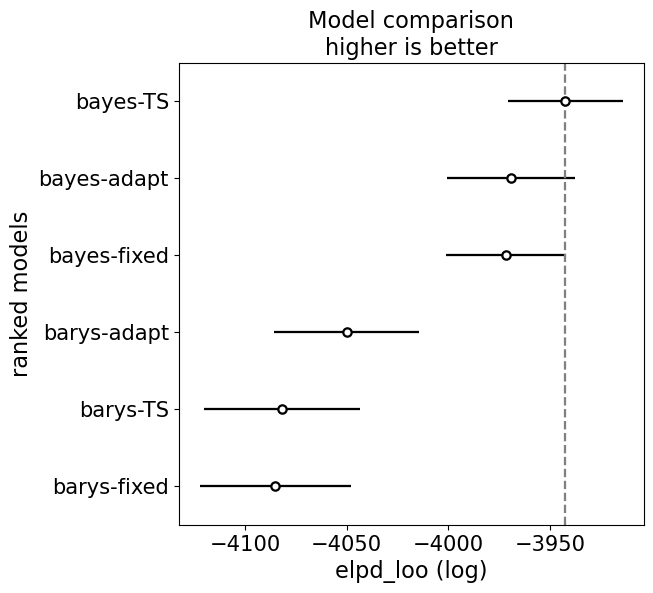

In [ ]:
db = DFx2[DFx2.t_mean <= 1]
db['lat'] = np.abs(db['lat'])
db = db[db.t_norm >= 0]
db['t_bin'] = pd.cut(db['t_norm'], bins=4, labels=False)



db1=db[db['t_bin']==3]

db2=db1.groupby(['AR']).mean().reset_index()

x=db2['lat'].values
y=db2['alpha'].values
yb=db2['alphab'].values
err=db_std['alpha'].values
errb=db_std['alphab'].values

ppc,ttr= JOYMODEL(x,y)
ppc2,ttr2= JOYMODEL(x,yb)


#trace=MODELJOY(x,y,err=err)
#traceb=MODELJOY(x,yb,err=errb)

#trace2=MODELJOY2(x,y,err=err)
#traceb2=MODELJOY2(x,yb,err=errb)


/tmp/ipykernel_9601/755033933.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat'] = np.abs(db['lat'])
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 81 seconds.
Sampling: [alpha_obs]


Output()

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, sigma]


Output()

/data/Work/plot-tilt-stats/.venv/lib/python3.12/site-packages/pymc/step_methods/hmc/quadpotential.py:316: RuntimeWarning: overflow encountered in dot
  return 0.5 * np.dot(x, v_out)


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 146 seconds.
Sampling: [alpha_obs]


Output()

<Axes: ylabel='Count'>

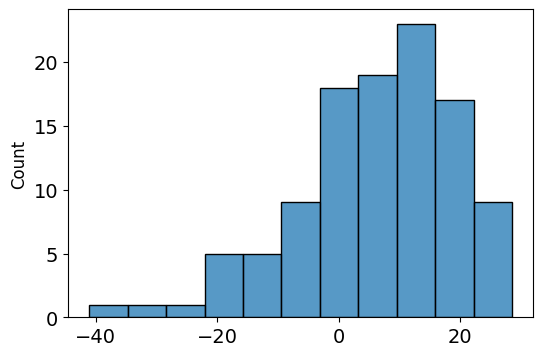

In [ ]:
sns.histplot(y)

<Axes: ylabel='Density'>

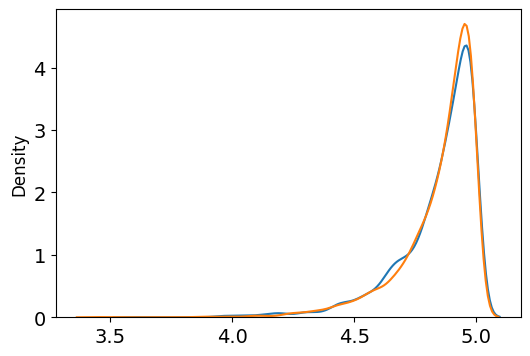

In [ ]:
sns.kdeplot(np.ravel(ttr.posterior.b.values))
sns.kdeplot(np.ravel(ttr2.posterior.b.values))


In [ ]:
az.summary(ttr0x)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
A1,17.772,1.483,15.244,20.742,0.030,0.039,2466.0,1683.0,1.00
A10,12.637,0.842,11.051,14.143,0.017,0.023,2509.0,1253.0,1.00
A2,15.633,1.126,13.590,17.724,0.023,0.025,2549.0,1504.0,1.00
A3,16.170,1.089,14.197,18.381,0.021,0.028,2680.0,1475.0,1.00
A4,15.390,0.989,13.397,17.053,0.020,0.025,2453.0,1187.0,1.01
...,...,...,...,...,...,...,...,...,...
A_vec[963],12.637,0.842,11.051,14.143,0.017,0.023,2509.0,1253.0,1.00
A_vec[964],12.637,0.842,11.051,14.143,0.017,0.023,2509.0,1253.0,1.00
A_vec[965],12.637,0.842,11.051,14.143,0.017,0.023,2509.0,1253.0,1.00
a,0.374,0.055,0.266,0.470,0.002,0.001,1138.0,1249.0,1.00


<Axes: xlabel='alpha_obs'>

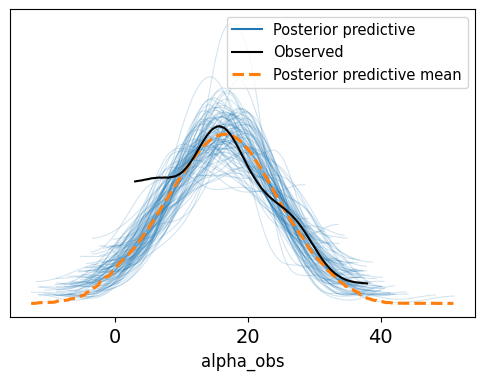

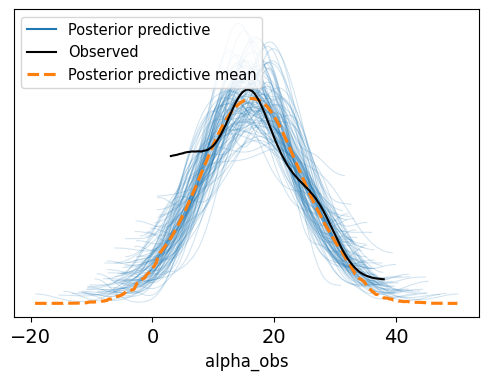

In [ ]:
az.plot_ppc(ppc, num_pp_samples=100)
az.plot_ppc(ppc2, num_pp_samples=100)

<Axes: xlabel='alpha_obs'>

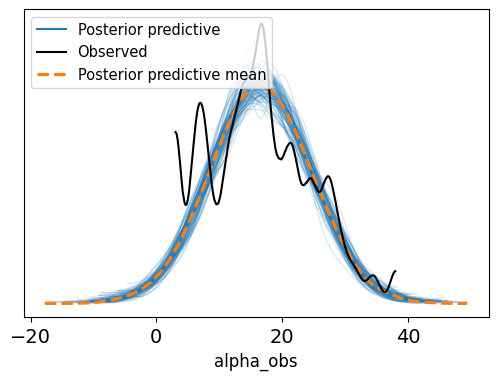

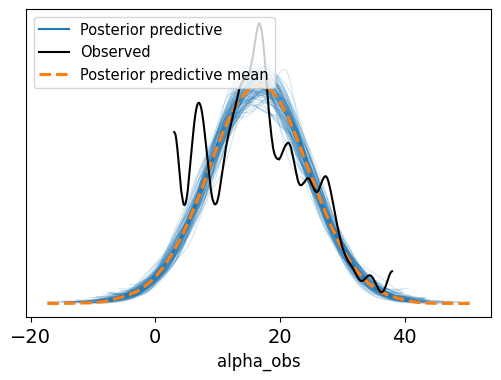

In [ ]:
az.plot_ppc(ppc, num_pp_samples=100)
az.plot_ppc(ppc2, num_pp_samples=100)


In [ ]:
with model:
    pm.sample_posterior_predictive(trace, extend_inferencedata=True)

In [ ]:
pm.sample_posterior_predictive(trace, extend_inferencedata=True)

TypeError: No model on context stack.

In [ ]:
az.plot_ppc(trace, num_pp_samples=100)

TypeError: `data` argument must have the group "posterior_predictive" for ppcplot

In [ ]:
df_comp_loo = az.compare({"hierarchical": trace, "pooled": traceb})

/data/Work/plot-tilt-stats/.venv/lib/python3.12/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/data/Work/plot-tilt-stats/.venv/lib/python3.12/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/data/Work/plot-tilt-stats/.venv/lib/pytho

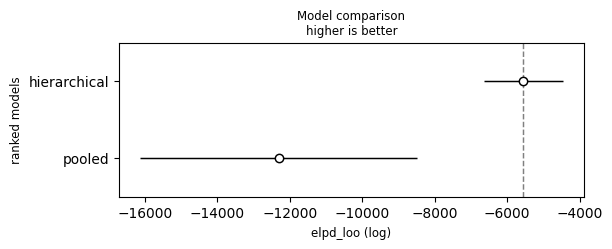

In [ ]:
az.plot_compare(df_comp_loo, insample_dev=False);

In [ ]:
traceb=MODELJOY(x,yb,err=errb)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 146 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


In [ ]:
db = DFx2[DFx2.t_mean <= 1]
db['lat'] = np.abs(db['lat'])
db = db[db.t_norm >= 0]
db['t_bin'] = pd.cut(db['t_norm'], bins=4, labels=False)
db1=db[db['t_bin']==1]

db2=db1.groupby('AR').median().reset_index()
db_std=db1.groupby('AR').std().reset_index()
x=db2['lat'].values
y=db2['alpha'].values
yb=db2['alphab'].values
err=db_std['alpha'].values
errb=db_std['alphab'].values
err

/tmp/ipykernel_343005/2340276736.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db['lat'] = np.abs(db['lat'])


array([ 6.00422155,  2.11605431, 10.79018692, 10.70482709,  0.79019379,
        1.41436156,  1.34090855,  5.40714839,  0.66461606,  0.74073756,
        0.34099892,  1.21159598,  1.88447992,  0.42881369,  0.48342694,
        1.15810132,  1.58535265,  4.08498717,  3.28297123,  7.27872613,
        2.50907139,  1.88201134,  3.04456489,  2.69708966,  1.31372489,
        3.10389796,  1.25891112,  2.85353576,  9.45250417,  1.19521741,
        5.27058272,  0.77933556,  2.62456578,  7.86399555,  2.80079221,
        1.89827109,  0.53776913,  0.92046406,  1.46761721,  0.92238139,
        2.57881717,  0.97502057,  0.52567796,  1.56255714,  2.29171326,
        2.43956832,  2.1993802 ,  1.09534948,  4.87176555,  2.04318661,
        1.10247158,  3.15765089,  2.38598224,  0.50631697,  0.60009442,
        0.43876117,  0.99543071,  1.77336042,  1.56966242,  3.8023004 ,
        4.1316699 ,  1.53679426,  2.73957559,  4.15961685,  1.91870799,
        3.17587513,  3.718022  , 10.11397569,  0.91394118,  2.98

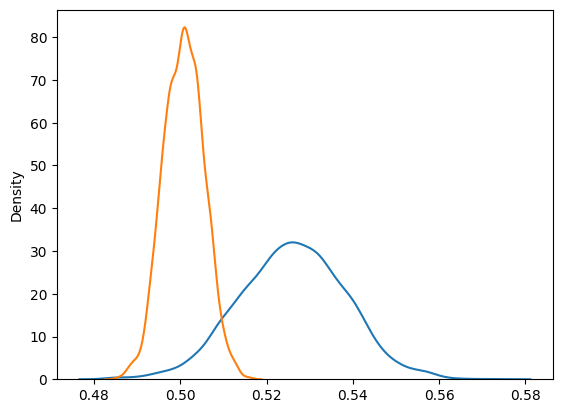

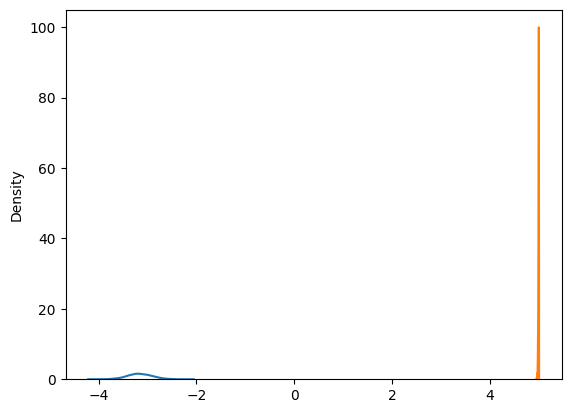

In [ ]:
sns.kdeplot(np.ravel(trace.posterior.a.values),common_norm=True)
sns.kdeplot(np.ravel(traceb.posterior.a.values),common_norm=True)

plt.show()
sns.kdeplot(np.ravel(trace.posterior.b.values))
sns.kdeplot(np.ravel(traceb.posterior.b.values))

plt.show()

# Discarded plots

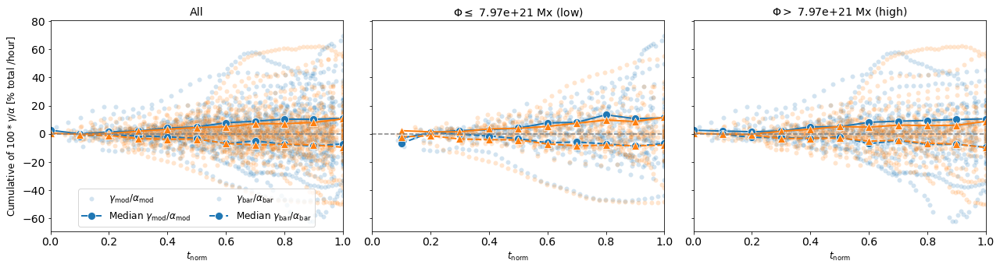

In [ ]:
import numpy as np

db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

dfa=pd.merge(db,DFx2,on='AR',suffixes=('_max',''))

dfa['frac_rot'] = dfa['rot']/dfa['alpha_max']*100
dfa['frac_rotb'] = dfa['rotb']/dfa['alphab_max']*100

# Crear máscaras para valores entre -5 y 5
mask_rot = (dfa['frac_rot'].between(-5, 5))
mask_rotb = (dfa['frac_rotb'].between(-5, 5))

# Aplicar las máscaras y reemplazar valores fuera del rango con NaN
dfa.loc[~mask_rot, 'frac_rot'] = np.nan
dfa.loc[~mask_rotb, 'frac_rotb'] = np.nan

# Alternativamente, si quieres mantener solo las filas que cumplen ambas condiciones:
dfa = dfa[mask_rot & mask_rotb]

dfa['frac_rot']=dfa.groupby('AR').frac_rot.cumsum()
dfa['frac_rotb']=dfa.groupby('AR').frac_rotb.cumsum()

f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([dfa,dfa[dfa.AR.isin(arslowf)],dfa[dfa.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):

    dfm=db1.groupby('AR').mean().reset_index()

    arsp=dfm[dfm.frac_rot>0].AR.values
    arsn=dfm[dfm.frac_rot<0].AR.values

    # plot rot_cum in blue with circle marker and solid line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsp)],'frac_rot',title='',marker='o',
                            color='tab:blue',error=None,estim='median',
                            err_kws={'alpha':1},ax=ax1,fig=f,scatter=True)


    # plot rot_cum in blue with circle marker and solid line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsn)].reset_index(),'frac_rot',title='',marker='o'
                            ,color='tab:blue',error=None,estim='median',
                            err_kws={'alpha':1},ax=ax1,fig=f,scatter=True,ls='--')

    arsp=dfm[dfm.frac_rotb>0].AR.values
    arsn=dfm[dfm.frac_rotb<0].AR.values

    # plot rotb_cum in orange with triangle marker and dashed line
    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsp)],'frac_rotb',title='',
                            ax=ax1,fig=f,marker='^',color='tab:orange',estim='median'
                            ,error=None,err_kws={'alpha':1},scatter=True)



    f1,ax1=plotting.plot_single(db1[db1.AR.isin(arsn)],'frac_rotb',title='',
                            ax=ax1,fig=f,marker='^',color='tab:orange',estim='median',
                            error=None,err_kws={'alpha':1},scatter=True,ls='--')

    ax1.legend().remove()
    ax1.set_ylabel(r'Cumulative of $100*\gamma/\alpha$ [% total /hour]')
    ax1.set_xlabel(r'$t_\mathrm{norm}$')
    ax1.set_xlim(0,1)
    #ax1.set_ylim(-20,20)
    ax1.axhline(0,color='gray',ls='--')
    ax1.set_title(title)

h,l=ax[0].get_legend_handles_labels()
ax[0].legend(ncols=2,fontsize=12,handles=h,
             labels=[r'$\gamma_\mathrm{mod}/\alpha_\mathrm{mod}$',
                     r'Median $\gamma_\mathrm{mod}/\alpha_\mathrm{mod}$',
                     r'$\gamma_\mathrm{bar}/\alpha_\mathrm{bar}$',
                     r'Median $\gamma_\mathrm{bar}/\alpha_\mathrm{bar}$'],
             loc='lower center')
f.tight_layout()



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


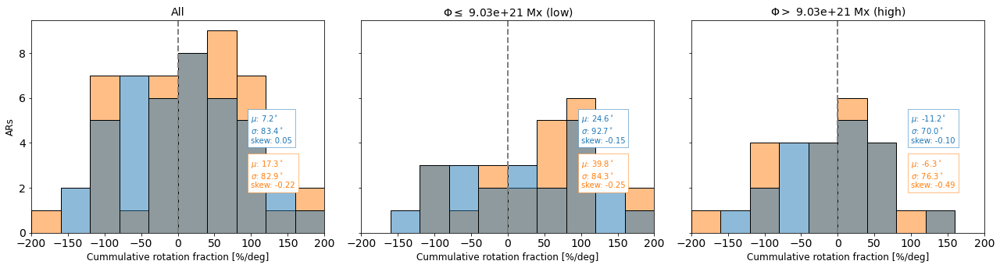

In [ ]:
'''
Este plot muestra histogramas de la fracción acumulativa de rotación (gamma/alpha)
en función del momento del flujo magnético total de las regiones activas (ARs).
Se divide en tres subplots: todos los ARs, ARs con flujo bajo y ARs con flujo alto.
Se calculan estadísticas como la media, desviación estándar y sesgo
para cada grupo y se muestran en el gráfico. Los valores extremos fuera del rango
de -200 a 200 se excluyen para una mejor visualización, ya que estos provienen de ARs
con valores muy pequeños de tilt al final de la emergencia que generan fracciones muy grandes.

'''

f,ax=plt.subplots(1,3,figsize=(18,5),sharey=True)



db=DFx2[DFx2.t_mean==1].groupby('AR').mean().reset_index()

db['frac_rot'] = 100*db['rot_cum']/db['alpha']
db['frac_rotb'] = 100*db['rotb_cum']/db['alphab']

# Crear máscaras para valores entre -5 y 5
mask_rot = (db['frac_rot'].between(-200, 200))
mask_rotb = (db['frac_rotb'].between(-200, 200))

# Aplicar las máscaras y reemplazar valores fuera del rango con NaN
db.loc[~mask_rot, 'frac_rot'] = np.nan
db.loc[~mask_rotb, 'frac_rotb'] = np.nan

# Alternativamente, si quieres mantener solo las filas que cumplen ambas condiciones:
db = db[mask_rot & mask_rotb]

arslowf=db[db.flux <= db.flux.median()].AR.unique()
arshighf=db[db.flux > db.flux.median()].AR.unique()


for db1,ax1,title in zip([db,db[db.AR.isin(arslowf)],db[db.AR.isin(arshighf)]],ax,
                        ['All',rf'$\Phi \leq $ {db.flux.median():.2e} Mx (low)',rf'$\Phi > $ {db.flux.median():.2e} Mx (high)']):
    sns.histplot(data=pd.melt(db1,
                            value_vars=['frac_rot','frac_rotb']),x='value',hue='variable',fill=True,ax=ax1,bins=10,binrange=(-200,200))

    ax1.set_xlabel(r'Cummulative rotation fraction [%/deg]')
    ax1.set_ylabel('ARs')
    ax1.set_title(title)
    ax1.set_xlim(-200,200)
    ax1.legend().remove()


    #ax1.legend(title='',labels=['Bayes','Barycenters'],fontsize=12)
    ax1.axvline(0,color='gray',linestyle='--',linewidth=2)

    ax1.text(100,4,f'$\mu$: {db1.frac_rot.mean():.1f}$^\circ$\n$\sigma$: {db1.frac_rot.std():.1f}$^\circ$\nskew: {db1.frac_rot.skew():.2f}',
            color='tab:blue',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:blue'))
    ax1.text(100,2,f'$\mu$: {db1.frac_rotb.mean():.1f}$^\circ$\n$\sigma$: {db1.frac_rotb.std():.1f}$^\circ$\nskew: {db1.frac_rotb.skew():.2f}',
            color='tab:orange',fontsize=10,
            bbox=dict(facecolor='white', alpha=1,linewidth=0.5,edgecolor='tab:orange'))

f.tight_layout()


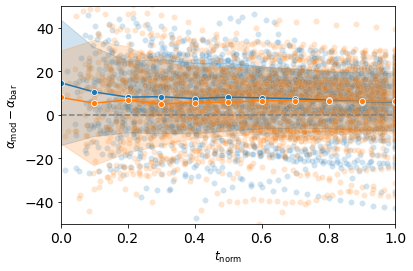

: 

: 

In [ ]:
f,ax=plotting.plot_comparison(DFx2,'alpha','alphab',title='',all=True)
ax.set_ylabel(r'$\alpha_\mathrm{mod} - \alpha_\mathrm{bar}$')
ax.set_xlabel(r'$t_\mathrm{norm}$')
ax.set_xlim(0,1)
ax.set_ylim(-50,50)
ax.axhline(0,color='gray',ls='--')

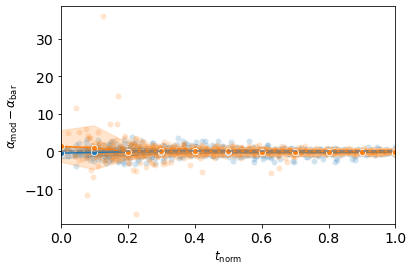

: 

: 

In [ ]:
f,ax=plotting.plot_comparison(DFx2,'rot','rotb',title='',all=True)
ax.set_ylabel(r'$\alpha_\mathrm{mod} - \alpha_\mathrm{bar}$')
ax.set_xlabel(r'$t_\mathrm{norm}$')
ax.set_xlim(0,1)
#ax.set_ylim(-50,50)
ax.axhline(0,color='gray',ls='--')